# Network Creation and analysis

The following Notebook contains the code used for the creation of the lexical dynamic network and its subsequent analyses. The **iGraph** library is requested.

In [34]:
import pandas as pd
import pyphen
import networkx as nx
import matplotlib.pyplot as plt
from pathlib import Path
import os
import time
from collections import Counter, defaultdict
import igraph as ig
from tqdm import tqdm  # Per la barra di avanzamento
import math
import numpy as np

## 1. Dynamic graph creation

The subsequent code creates a weighted (by similarity) graph for each snapshot using **ipgraph** library. Each node is labelled with:

- Its corresponding *token*;
- The *frequency* of the corresponding token;


In [ ]:
# --- CONFIGURAZIONE PATH ---
# Directory Input 1: Global Threshold (0.5%)
edges_dir_global = Path("../edges_analysis/edges_p99_5")

# Directory Input 2: Serrano Backbone
edges_dir_serrano = Path("../edges_analysis/backbone") 

vec_dir = Path("../embedding/word_embeddings_cleaned")
freq_dir = Path("../embedding/frequencies_all")

# Directory Output: Hybrid Union
output_dir = Path("networks_hybrid")
output_dir.mkdir(exist_ok=True)

percentile_str = "99.5" # Stringa usata nel nome file

print("[START] Costruzione grafi Ibridi (Union: Global 0.5% + Serrano)")

for snap in range(1, 8):
    t0 = time.time()
    
    # 1. Definizione percorsi file
    # File Global (es: edges_snap1_p99.5.tsv)
    file_global = edges_dir_global / f"edges_snap{snap}_p{percentile_str}.tsv"
    
    # File Serrano (es: backbone_snap1.tsv)
    file_serrano = edges_dir_serrano / f"backbone_snap{snap}.tsv"
    
    # File ausiliari
    vec_file = vec_dir / f"fasttext_snap{snap}_filt.vec"
    freq_file = freq_dir / f"vocab_freq_snap{snap}.csv"
    
    # Output
    out_graph_path = output_dir / f"graph_snap{snap}_hybrid.igp"

    print(f"\n[SNAPSHOT {snap}]")

    # --- 2. LETTURA EDGES GLOBAL ---
    # Assumiamo formato: source \t target \t weight
    df_glob = pd.read_csv(file_global, sep="\t", header=0, names=["src", "dst", "weight"])
    
    # Creiamo un dizionario {(src, dst): weight} per accesso rapido
    # Nota: Assicuriamo che src < dst per gestire grafi non diretti in modo univoco
    edges_global = {}
    for _, row in df_glob.iterrows():
        u, v = int(row["src"]), int(row["dst"])
        if u > v: u, v = v, u # Normalizza ordine
        edges_global[(u, v)] = float(row["weight"])
        
    count_global = len(edges_global)

    # --- 3. LETTURA EDGES SERRANO ---
    # Assumiamo stesso formato source \t target \t weight
    df_ser = pd.read_csv(file_serrano, sep="\t", header=0, names=["src", "dst", "weight"])
    
    edges_serrano = {}
    for _, row in df_ser.iterrows():
        u, v = int(row["src"]), int(row["dst"])
        if u > v: u, v = v, u
        edges_serrano[(u, v)] = float(row["weight"])
        
    count_serrano = len(edges_serrano)

    # --- 4. UNIONE (HYBRID STRATEGY) ---
    # Uniamo le chiavi (coppie di nodi)
    all_keys = set(edges_global.keys()) | set(edges_serrano.keys())
    
    final_sources = []
    final_targets = []
    final_weights = []
    
    # Statistiche per capire l'overlap
    overlap_count = 0
    only_global = 0
    only_serrano = 0
    
    for (u, v) in all_keys:
        w = 0.0
        is_in_global = (u, v) in edges_global
        is_in_serrano = (u, v) in edges_serrano
        
        if is_in_global and is_in_serrano:
            overlap_count += 1
            w = edges_global[(u, v)] # Il peso è lo stesso (coseno), prendiamo dal global
        elif is_in_global:
            only_global += 1
            w = edges_global[(u, v)]
        elif is_in_serrano:
            only_serrano += 1
            w = edges_serrano[(u, v)]
            
        final_sources.append(u)
        final_targets.append(v)
        final_weights.append(w)
        
    print(f"   -> Stats Unione: Global={count_global}, Serrano={count_serrano}")
    print(f"   -> Overlap={overlap_count}, Solo Global={only_global}, Recuperati da Serrano={only_serrano}")
    print(f"   -> Totale Archi Ibridi: {len(final_sources)}")

    # --- 5. CARICAMENTO NODI E FREQUENZE ---
    tokens = []
    # Lettura token dal file .vec (saltando header)
    try:
        with open(vec_file, encoding="utf-8") as f:
            header = next(f) # Salta prima riga (n_words n_dim)
            for line in f:
                parts = line.rstrip().split(" ")
                tokens.append(parts[0])
    except Exception as e:
        print(f"Errore lettura vettori: {e}")
        continue

    n_nodes = len(tokens)

    # Lettura frequenze
    freq_map = {}
    if freq_file.exists():
        df_freq = pd.read_csv(freq_file)
        # Assumiamo colonne "word" e "frequency" (o simili)
        # Adatta i nomi colonne se necessario
        cols = df_freq.columns
        w_col = cols[0] if "word" not in cols else "word"
        f_col = cols[1] if "frequency" not in cols else "frequency"
        
        for _, row in df_freq.iterrows():
            freq_map[str(row[w_col])] = row[f_col]
    
    # Allineamento token -> freq
    node_freqs = [freq_map.get(tok, 0) for tok in tokens]

    # --- 6. COSTRUZIONE GRAFO ---
    g = ig.Graph(n=n_nodes, directed=False)
    
    # Attributi nodi
    g.vs["token"] = tokens
    g.vs["freq"] = node_freqs
    
    # Aggiunta archi
    # igraph accetta lista di tuple [(u,v), ...]
    edges_list = list(zip(final_sources, final_targets))
    g.add_edges(edges_list)
    
    # Attributi archi
    g.es["weight"] = final_weights
    
    # Metadata opzionale (per ricordarsi come è stato fatto)
    g["name"] = f"Hybrid Union Snap{snap} (Global0.5% + Serrano)"

    # --- 7. SALVATAGGIO ---
    g.write_pickle(out_graph_path)

    print(
        f"[DONE] Salvato {out_graph_path.name} | "
        f"Nodi={n_nodes}, Archi={g.ecount()} | "
        f"Tempo: {time.time() - t0:.2f}s"
    )

print("\n[TOTAL] Elaborazione completata.")

[START] Costruzione grafi Ibridi (Union: Global 0.5% + Serrano)

[SNAPSHOT 1]
   -> Stats Unione: Global=3033079, Serrano=12313
   -> Overlap=12313, Solo Global=3020766, Recuperati da Serrano=0
   -> Totale Archi Ibridi: 3033079
[DONE] Salvato graph_snap1_hybrid.igp | Nodi=34742, Archi=3033079 | Tempo: 93.69s

[SNAPSHOT 2]
   -> Stats Unione: Global=1984681, Serrano=144078
   -> Overlap=143119, Solo Global=1841562, Recuperati da Serrano=959
   -> Totale Archi Ibridi: 1985640
[DONE] Salvato graph_snap2_hybrid.igp | Nodi=28017, Archi=1985640 | Tempo: 65.52s

[SNAPSHOT 3]
   -> Stats Unione: Global=1930240, Serrano=130624
   -> Overlap=129884, Solo Global=1800356, Recuperati da Serrano=740
   -> Totale Archi Ibridi: 1930980
[DONE] Salvato graph_snap3_hybrid.igp | Nodi=28028, Archi=1930980 | Tempo: 63.55s

[SNAPSHOT 4]
   -> Stats Unione: Global=3011132, Serrano=128613
   -> Overlap=128380, Solo Global=2882752, Recuperati da Serrano=233
   -> Totale Archi Ibridi: 3011365
[DONE] Salvato gra

# 2. Node Labelling
For the Complexity labelling, 3 metrics are merged:

1. **Morphological Complexity**: By the Zipf Law (or law of least effort) complex words are inveresely proportional to their length in terms of characters and syllables.
2. **De Mauro's list of common words**: common words can be Fundamentals (high frequency words, 90% coverage of texts), High Usage (6-8% coverage of texts) and High Availability (common but rarely used words). A complex word doesn't belong to any of these sets. 
3. **Inverse Document Frequency**: A generic/less complex word tends to appear more frequently than a complex/high informative word.

In [29]:
import pandas as pd
import igraph as ig
import pyphen
from pathlib import Path
from collections import Counter
from tqdm import tqdm
import math
import spacy

# --- 1. SETUP INIZIALE ---
print("Caricamento risorse...")

# A. Pyphen per le sillabe
dic = pyphen.Pyphen(lang='it_IT')

# B. SpaCy per il POS Tagging
# Disabilitiamo parser e ner perché ci serve solo il tagger (più veloce)
try:
    nlp = spacy.load("it_core_news_sm", disable=["parser", "ner", "lemmatizer"])
except OSError:
    print("Errore: Modello spaCy non trovato. Esegui: python -m spacy download it_core_news_sm")
    exit()

# C. Carica De Mauro (NVdB)
try:
    # Assumiamo che il CSV abbia colonne 'lemma' e 'categoria'
    nvdb_df = pd.read_csv('nvdb.csv')
    # Rimuoviamo duplicati per sicurezza
    nvdb_df = nvdb_df.drop_duplicates(subset=['lemma'])
    nvdb = nvdb_df.set_index('lemma')['categoria'].to_dict()
except Exception as e:
    print(f"Attenzione: Errore caricamento NVdB ({e}). I nodi avranno valore default.")
    nvdb = {}

# Mapping punteggi De Mauro
demauro_scores = {'FO': 0, 'AU': 1, 'AD': 2, 'Altro': 3}

# --- 2. PRE-CALCOLO DOCUMENT FREQUENCY ---
freq_doc_path = Path("../embedding/frequencies_all")
doc_freq_counter = Counter()
total_docs = 0

print("Pre-calcolo delle frequenze documentali (DF)...")
# Assicurati che freq_doc_path esista
if freq_doc_path.exists():
    files_list = list(freq_doc_path.glob("*.csv"))
    total_docs = len(files_list)

    for file_path in tqdm(files_list, desc="Lettura DF"):
        try:
            df = pd.read_csv(file_path)
            # Assicurati che la colonna sia stringa
            words = df['word'].dropna().astype(str).unique()
            doc_freq_counter.update(words)
        except Exception as e:
            print(f"Errore lettura {file_path}: {e}")
else:
    print(f"Attenzione: Cartella {freq_doc_path} non trovata. IDF sarà 0.")

print(f"DF calcolata su {total_docs} documenti.")

# --- 3. FUNZIONE COMPLESSITÀ (Solo metriche numeriche) ---
def compute_metrics(lemma, doc_freq_val, total_documents):
    """Calcola metriche numeriche. Il POS viene calcolato separatamente con nlp.pipe"""
    if not isinstance(lemma, str): 
        return 0, 0, 3, 0.0
    
    # A. Lunghezza
    char_len = len(lemma)
    try:
        syll_len = len(dic.inserted(lemma).split('-'))
    except:
        syll_len = 0
    
    # B. De Mauro
    cat = nvdb.get(lemma, 'Altro')
    dm_score = demauro_scores.get(cat, 3)
    
    # C. IDF
    # Smoothing: log(N / (1 + df))
    idf = math.log(total_documents / (1 + doc_freq_val)) if total_documents > 0 else 0
    
    return char_len, syll_len, dm_score, idf

# --- 4. ETICHETTATURA DEI GRAFI (IGRAPH) ---
output_dir = Path("networks_hybrid") 
processed_dir = Path("networks_hybrid_annotated") 
processed_dir.mkdir(parents=True, exist_ok=True)

graph_files = list(output_dir.glob("graph_snap*_hybrid.igp"))

for graph_path in tqdm(graph_files, desc="Annotazione Grafi"):
    
    # Carica Grafo
    try:
        G = ig.Graph.Read_Pickle(str(graph_path))
    except Exception as e:
        print(f"Errore apertura {graph_path}: {e}")
        continue

    # Identifica attributo nome nodo
    node_attr_name = 'name' if 'name' in G.vs.attributes() else 'token'
    
    # Ottieni lista lemmi (convertiti a stringa per sicurezza spaCy)
    lemmas = [str(x) for x in G.vs[node_attr_name]]
    
    # --- A. POS TAGGING BATCH (SPACY) ---
    # Usiamo nlp.pipe per processare tutti i nodi insieme (molto veloce)
    # Poiché sono parole singole, il contesto manca, ma spaCy restituirà il POS più probabile.
    list_pos = []
    
    # batch_size regola quanti nodi processare alla volta in memoria
    for doc in nlp.pipe(lemmas, batch_size=1000):
        # doc[0] perché ogni 'lemma' è trattato come un documento di una parola
        if len(doc) > 0:
            list_pos.append(doc[0].pos_) # Es: NOUN, VERB, ADJ
        else:
            list_pos.append("X") # Fallback per stringhe vuote o strane

    # --- B. CALCOLO ALTRE METRICHE ---
    list_char = []
    list_syll = []
    list_dm = []
    list_idf = []
    
    for lemma in lemmas:
        df_val = doc_freq_counter.get(lemma, 0)
        c, s, d, i = compute_metrics(lemma, df_val, total_docs)
        
        list_char.append(c)
        list_syll.append(s)
        list_dm.append(d)
        list_idf.append(i)
    
    # --- C. ASSEGNAZIONE ATTRIBUTI ---
    G.vs["pos"] = list_pos            # Nuova colonna grammaticale
    G.vs["char_len"] = list_char
    G.vs["syll_len"] = list_syll
    G.vs["demauro_level"] = list_dm
    G.vs["idf"] = list_idf
    
    # Salva
    out_path = processed_dir / graph_path.name
    # Usa write_pickle di igraph
    G.write_pickle(str(out_path))

print("Finito! Grafi annotati (incluso POS) salvati in networks_hybrid_annotated/")

Caricamento risorse...
Pre-calcolo delle frequenze documentali (DF)...


Lettura DF: 100%|██████████| 7/7 [00:00<00:00, 11.07it/s]


DF calcolata su 7 documenti.


Annotazione Grafi: 100%|██████████| 7/7 [01:04<00:00,  9.21s/it]

Finito! Grafi annotati (incluso POS) salvati in networks_hybrid_annotated/


In [31]:
g = ig.Graph.Read_Pickle("./networks_hybrid_annotated/graph_snap1_hybrid.igp")
g.vs[0]

igraph.Vertex(<igraph.Graph object at 0x00000173A957E150>, 0, {'token': 'disputato', 'freq': 126, 'pos': 'VERB', 'char_len': 9, 'syll_len': 4, 'demauro_level': 3, 'idf': -0.13353139262452263})

## 3. Network analyses

### 3.1) Simple networks statistics

In [4]:
import gc # Garbage Collector per liberare RAM

input_dir = "./networks_hybrid" 
rows = []

# Imposta su False se vuoi un risultato immediato per testare
CALCOLA_CLUSTERING = True 

print(f"Inizio analisi su {input_dir}...")

for file in sorted(os.listdir(input_dir)):
    if not "snap" in file: continue # sicurezza
    
    # Estrazione tempo
    try:
        t = int(file.split("_")[1].replace("snap", ""))
    except:
        continue

    print(f"Analisi {t}...", end="")

    try:
        # Caricamento
        path = os.path.join(input_dir, file)
        
        Gt = ig.Graph.Read_Pickle(path) 

        num_nodes = Gt.vcount()
        num_edges = Gt.ecount()

        # 1. Density (Calcolo aritmetico istantaneo)
        possible_edges = (num_nodes * (num_nodes - 1) / 2)
        density = num_edges / possible_edges if num_nodes > 1 else 0

        # 2. Avg Degree (Veloce)
        # mean() nativo di python è leggermente meglio del calcolo manuale su liste enormi
        degrees = Gt.degree()
        avg_degree = sum(degrees) / num_nodes if num_nodes > 0 else 0

        # Average path length
        avg_path_length = Gt.average_path_length() if num_edges > 0 else 0

        # 3. Componenti Connesse (OTTIMIZZATO)
        # Chiamiamo l'algoritmo UNA volta sola
        if num_nodes > 0:
            clusters = Gt.connected_components(mode="weak")
            num_components = len(clusters)
            # .sizes() restituisce una lista di interi direttamente dal C -> Velocissimo
            sizes = clusters.sizes()
            largest_cc = max(sizes) if sizes else 0
        else:
            num_components = 0
            largest_cc = 0

        # 4. Clustering Coefficient (IL PUNTO CRITICO)
        if CALCOLA_CLUSTERING and num_edges > 0:
            # Usa transitivity_undirected() (Globale) invece di avglocal.
            # È drasticamente più veloce su grafi densi.
            clustering_coefficient = Gt.transitivity_undirected()
        else:
            clustering_coefficient = 0

        rows.append({
            "time": t,
            "nodes": num_nodes,
            "edges": num_edges,
            "density": density,
            "avg_degree": avg_degree,
            "average_path_length": avg_path_length,
            "components": num_components,
            "largest_cc": largest_cc,
            "clustering": clustering_coefficient
        })

        print(f" Fatto. (N={num_nodes}, E={num_edges})")

        # Pulizia memoria esplicita
        del Gt
        del clusters
        del degrees
        gc.collect()

    except Exception as e:
        print(f" Errore su {file}: {e}")

# Output
pd.options.display.float_format = '{:.6f}'.format
pd.set_option('display.width', 1000)
df = pd.DataFrame(rows).sort_values("time")

print("\nRisultati Finali:")
print(df)

Inizio analisi su ./networks_hybrid...
Analisi 1... Fatto. (N=34742, E=3033079)
Analisi 2... Fatto. (N=28017, E=1985640)
Analisi 3... Fatto. (N=28028, E=1930980)
Analisi 4... Fatto. (N=34431, E=3011365)
Analisi 5... Fatto. (N=37089, E=3482725)
Analisi 6... Fatto. (N=37658, E=3604324)
Analisi 7... Fatto. (N=31000, E=2390413)

Risultati Finali:
   time  nodes    edges  density  avg_degree  average_path_length  components  largest_cc  clustering
0     1  34742  3033079 0.005026  174.605895             3.115431          25       34718    0.306299
1     2  28017  1985640 0.005059  141.745369             3.128467          17       28001    0.283927
2     3  28028  1930980 0.004916  137.789354             3.129798          27       28002    0.267677
3     4  34431  3011365 0.005081  174.921728             3.020816          19       34413    0.256082
4     5  37089  3482725 0.005064  187.803661             2.986916          21       37069    0.253158
5     6  37658  3604324 0.005083  191.42408

<>:70: SyntaxWarning: invalid escape sequence '\g'
<>:70: SyntaxWarning: invalid escape sequence '\g'
C:\Users\leona\AppData\Local\Temp\ipykernel_2460\1795486961.py:70: SyntaxWarning: invalid escape sequence '\g'
  ax.set_title(f"Snap {snap} | $\gamma={alpha:.2f}$")


--- TEST MODELLO BARABASI-ALBERT (POWER LAW FIT) ---
Snap 1: gamma=6.19, xmin=1090.0, Preferisce: Log-Normal (p=0.043)
Snap 2: gamma=5.63, xmin=627.0, Preferisce: Log-Normal (p=0.009)
Snap 3: gamma=6.55, xmin=690.0, Preferisce: Log-Normal (p=0.030)
Snap 4: gamma=9.40, xmin=987.0, Preferisce: Log-Normal (p=0.210)
Snap 5: gamma=6.27, xmin=710.0, Preferisce: Log-Normal (p=0.007)
Snap 6: gamma=7.43, xmin=982.0, Preferisce: Log-Normal (p=0.328)
Snap 7: gamma=5.81, xmin=599.0, Preferisce: Log-Normal (p=0.006)


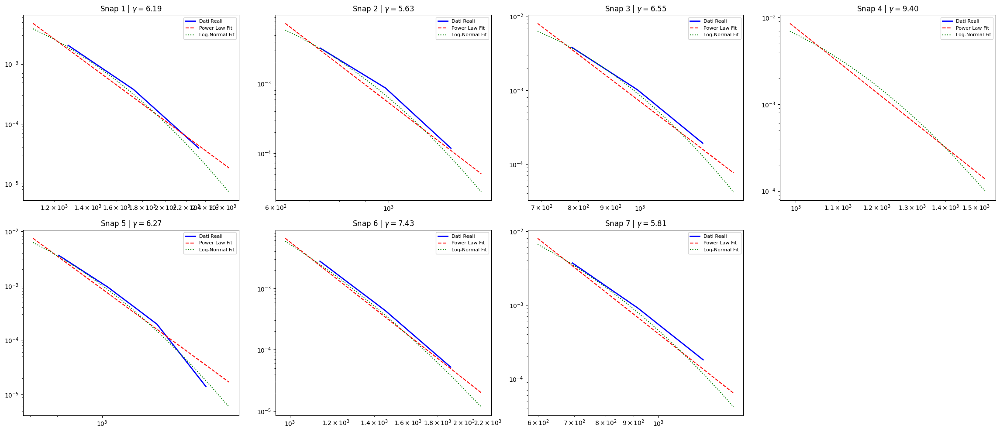


--- RISULTATI FIT TOPOLOGICO ---
   snapshot  alpha (gamma)        xmin  R_likelihood    Best_Fit
0         1       6.193420 1090.000000     -5.613387  Log-Normal
1         2       5.626347  627.000000     -7.864660  Log-Normal
2         3       6.552316  690.000000     -5.624813  Log-Normal
3         4       9.403911  987.000000     -1.762150  Log-Normal
4         5       6.273070  710.000000     -9.341295  Log-Normal
5         6       7.426237  982.000000     -1.241513  Log-Normal
6         7       5.805455  599.000000     -8.808053  Log-Normal


In [7]:
import igraph as ig
import powerlaw
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid") 
snapshots = range(1, 8)

# =============================================================================
# ANALISI POWER LAW (Fit e Confronto)
# =============================================================================

results = []
print("--- TEST MODELLO BARABASI-ALBERT (POWER LAW FIT) ---")

# Setup grafico: griglia per i plot
fig, axes = plt.subplots(2, 4, figsize=(23, 10))
axes = axes.flatten()

for i, snap in enumerate(snapshots):
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    try:
        # Carica Grafo COMPLETO (non Core, stiamo valutando la topologia globale)
        g = ig.Graph.Read_Pickle(str(file_path))
        degrees = np.array(g.degree())
        
        # Filtra gradi a 0 per evitare errori log
        degrees = degrees[degrees > 0]
        
        # 1. Fit della Power Law
        # xmin viene calcolato automaticamente per trovare la parte "coda" della distribuzione
        fit = powerlaw.Fit(degrees, verbose=False)
        
        alpha = fit.power_law.alpha
        xmin = fit.power_law.xmin
        sigma = fit.power_law.sigma # Errore standard
        
        # 2. Confronto con Log-Normal
        # (Le reti linguistiche spesso sono Log-Normal piuttosto che pure Power Law)
        # R > 0: Power Law è meglio. R < 0: Log-Normal è meglio.
        R, p = fit.distribution_compare('power_law', 'lognormal') # p è la significatività del confronto
        
        results.append({
            'snapshot': snap,
            'alpha (gamma)': alpha,
            'xmin': xmin,
            'sigma': sigma,
            'R_likelihood': R,
            'p_value': p, # Significatività del confronto (se p < 0.05, la differenza tra Power Law e Log-Normal è significativa)
            'Best_Fit': 'Power Law' if R > 0 else 'Log-Normal'
        })
        
        # 3. Visualizzazione (PDF)
        ax = axes[i]
        
        # Plot dati reali
        fit.plot_pdf(color='b', linewidth=2, ax=ax, label='Dati Reali')
        
        # Plot curve teoriche
        fit.power_law.plot_pdf(color='r', linestyle='--', ax=ax, label='Power Law Fit')
        fit.lognormal.plot_pdf(color='g', linestyle=':', ax=ax, label='Log-Normal Fit')
        
        ax.set_title(f"Snap {snap} | $\gamma={alpha:.2f}$")
        ax.legend(loc='upper right', fontsize=8)
        
        print(f"Snap {snap}: gamma={alpha:.2f}, xmin={xmin}, Preferisce: {'Power Law' if R>0 else 'Log-Normal'} (p={p:.3f})")

    except Exception as e:
        print(f"Errore snap {snap}: {e}")

# Rimuovi grafico vuoto se c'è (8 slot per 7 snap)
if len(snapshots) < 8:
    fig.delaxes(axes[7])

plt.tight_layout()
plt.show()

# =============================================================================
# RISULTATI IN TABELLA
# =============================================================================
df_res = pd.DataFrame(results)
print("\n--- RISULTATI FIT TOPOLOGICO ---")
print(df_res[['snapshot', 'alpha (gamma)', 'xmin', 'R_likelihood', 'Best_Fit']])

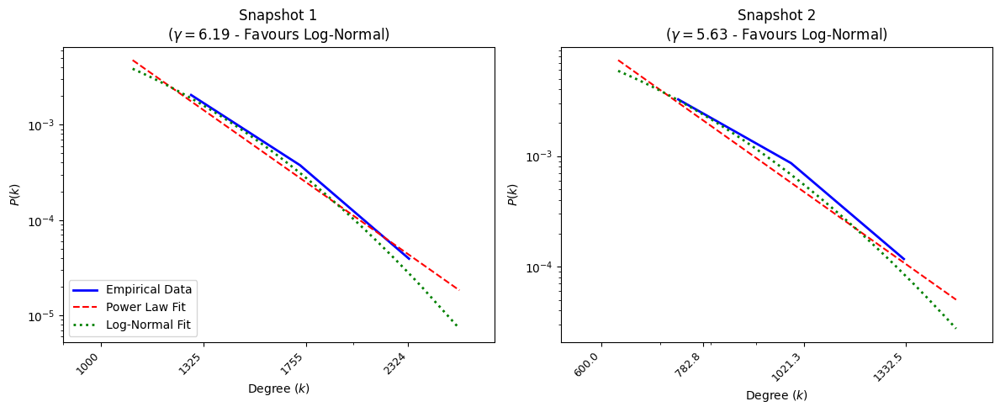

In [62]:
import igraph as ig
from matplotlib import ticker
import powerlaw
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# CONFIGURAZIONE
input_dir = Path("networks_hybrid_annotated") 
snapshots_to_plot = [1, 2] # Selezioniamo solo Inizio e Fine

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for i, snap in enumerate(snapshots_to_plot):
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    # Carica Grafo
    g = ig.Graph.Read_Pickle(str(file_path))
    degrees = np.array(g.degree())
    degrees = degrees[degrees > 0] # Filtra zero
    
    # Fit
    fit = powerlaw.Fit(degrees, verbose=False)
    
    # Plot
    ax = axes[i]
    fit.plot_pdf(color='b', linewidth=2, ax=ax, label='Empirical Data')
    fit.power_law.plot_pdf(color='r', linestyle='--', ax=ax, label='Power Law Fit')
    fit.lognormal.plot_pdf(color='g', linestyle=':', linewidth=2, ax=ax, label='Log-Normal Fit')
    
    # Calcolo statistiche per il titolo
    R, p = fit.distribution_compare('power_law', 'lognormal')
    winner = "Log-Normal" if R < 0 else "Power Law"
    
  
    ax.set_title(f"Snapshot {snap}\n($\\gamma={fit.power_law.alpha:.2f}$ - Favours {winner})")
    ax.set_xlabel("Degree ($k$)")
    ax.set_ylabel("$P(k)$")

    # 1. STRINGI L'ASSE SUI DATI REALI
    # Togliamo il vuoto a sinistra impostando il limite sul grado minimo
    if i==0:
        plus = 999# Aggiunta di un margine per evitare che il punto più piccolo sia esattamente al limite
    else:
        plus = 599
    xmin, xmax = degrees.min() + plus, degrees.max()
    ax.set_xlim(xmin * 0.9, xmax * 1.1) 

    # 2. CREA TICK MANUALI EQUISPAZIATI (LOGARITMICAMENTE)
    # Generiamo 8 punti tra il minimo e il massimo reale
    # 'num=8' assicura che ci siano abbastanza punti tra cui scegliere
    all_ticks = np.geomspace(xmin, xmax, num=8)
    
    # 3. APPLICA LO SKIP "UNO SÌ E UNO NO"
    selected_ticks = all_ticks[::2]
    ax.set_xticks(selected_ticks)

    # 4. FORMATAZIONE E ROTAZIONE
    # Usiamo ScalarFormatter per numeri "piani" (es. 1200 invece di 1.2x10^3)
    ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
    ax.xaxis.set_minor_formatter(ticker.NullFormatter()) # Rimuove i trattini piccoli
    
    # Ruota di 45 gradi e allinea a destra
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)
    # -----------------------

    if i == 0:
        ax.legend(loc='lower left')

plt.tight_layout()
plt.show()

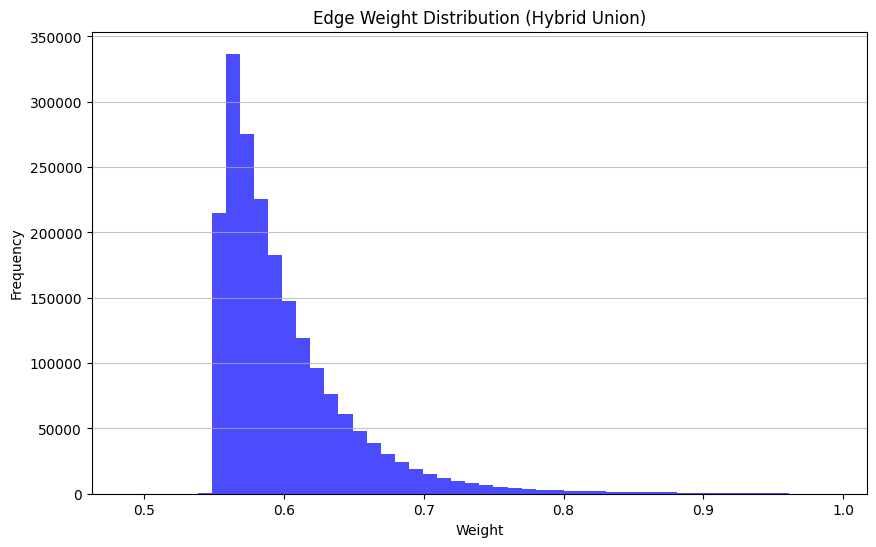

In [24]:
# weight distribution plot
g = ig.Graph.Read_Pickle(str("networks_hybrid/graph_snap2_hybrid.igp")) # Carica uno dei grafi ibridi (es: snap1)
final_weights = g.es["weight"]
plt.figure(figsize=(10, 6))
plt.hist(final_weights, bins=50, color='blue', alpha=0.7)
plt.title('Edge Weight Distribution (Hybrid Union)')
plt.xlabel('Weight')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


In [24]:
import igraph as ig
import matplotlib.pyplot as plt
from itertools import islice

# --- 1. CARICAMENTO GRAFI ---
path_global = "networks_p99_5/graph_snap3_p99.5.igp"   # Grafo "Scheletro" (0.5%)
path_hybrid = "networks_hybrid/graph_snap3_hybrid.igp" # Grafo Finale (Unione)

print("Caricamento grafi...")
g_global = ig.Graph.Read_Pickle(path_global)
g_hybrid = ig.Graph.Read_Pickle(path_hybrid)

# Assicuriamoci che i nodi siano allineati (stessi indici/nomi)
# Per sicurezza usiamo i nomi dei token come identificatori
# Creiamo dei set di archi basati sui nomi: (token_u, token_v)
def get_edge_set(graph):
    edges = set()
    for e in graph.es:
        src = graph.vs[e.source]["token"]
        dst = graph.vs[e.target]["token"]
        # Ordina per non avere duplicati in grafi non diretti
        if src > dst: src, dst = dst, src
        edges.add((src, dst))
    return edges

print("Analisi differenze archi...")
edges_glob_set = get_edge_set(g_global)
# Non serve ricalcolare tutto per hybrid, possiamo iterare direttamente

# --- 2. TROVARE IL NODO "EROE" (Quello con più archi recuperati) ---
# Cerchiamo un nodo che ha tanti vicini in Hybrid che NON erano in Global
recovered_counts = {} # {token: numero_archi_recuperati}

# Iteriamo sugli archi di Hybrid
for e in g_hybrid.es:
    src_tok = g_hybrid.vs[e.source]["token"]
    dst_tok = g_hybrid.vs[e.target]["token"]
    
    # Ordiniamo la tupla per controllare nel set
    u, v = (dst_tok, src_tok) if src_tok > dst_tok else (src_tok, dst_tok)
    
    # Se questo arco NON c'era nel grafo Global...
    if (u, v) not in edges_glob_set:
        # Contalo per entrambi i nodi
        recovered_counts[src_tok] = recovered_counts.get(src_tok, 0) + 1
        recovered_counts[dst_tok] = recovered_counts.get(dst_tok, 0) + 1

# Ordina i nodi per numero di archi recuperati
sorted_nodes = sorted(recovered_counts.items(), key=lambda x: x[1], reverse=True)

if not sorted_nodes:
    print("Nessuna differenza trovata! I grafi sembrano identici.")
    exit()

best_node_token = sorted_nodes[0][0] # Il nodo con più "recuperi"
count = sorted_nodes[0][1]
print(f"Nodo più interessante: '{best_node_token}' (ha recuperato {count} archi grazie a Serrano)")

# --- 3. CAMPIONAMENTO BFS ATTORNO AL NODO INTERESSANTE ---
# Troviamo l'ID di questo nodo nel grafo Hybrid
start_node_id = g_hybrid.vs.find(token=best_node_token).index

max_nodes = 50
bfs_iter = g_hybrid.bfsiter(start_node_id, mode="all")
sampled_indices = list(islice(bfs_iter, max_nodes))

# Creiamo il sottografo
sub_g = g_hybrid.subgraph(sampled_indices)

# --- 4. COLORAZIONE ARCHI PER LA PLOT ---
# Vogliamo colorare di ROSSO gli archi che esistono solo grazie a Serrano
edge_colors = []
edge_widths = []

for e in sub_g.es:
    src_tok = sub_g.vs[e.source]["token"]
    dst_tok = sub_g.vs[e.target]["token"]
    u, v = (dst_tok, src_tok) if src_tok > dst_tok else (src_tok, dst_tok)
    
    if (u, v) in edges_glob_set:
        # Arco Strutturale (Global 0.5%) -> Grigio, Sottile
        edge_colors.append("gray")
        edge_widths.append(0.5)
    else:
        # Arco Recuperato (Serrano) -> Rosso, Più evidente
        edge_colors.append("firebrick") 
        edge_widths.append(1.5)




Caricamento grafi...
Analisi differenze archi...
Nodo più interessante: 'plurale' (ha recuperato 70 archi grazie a Serrano)


Visualizzazione intorni di 'plurale'...


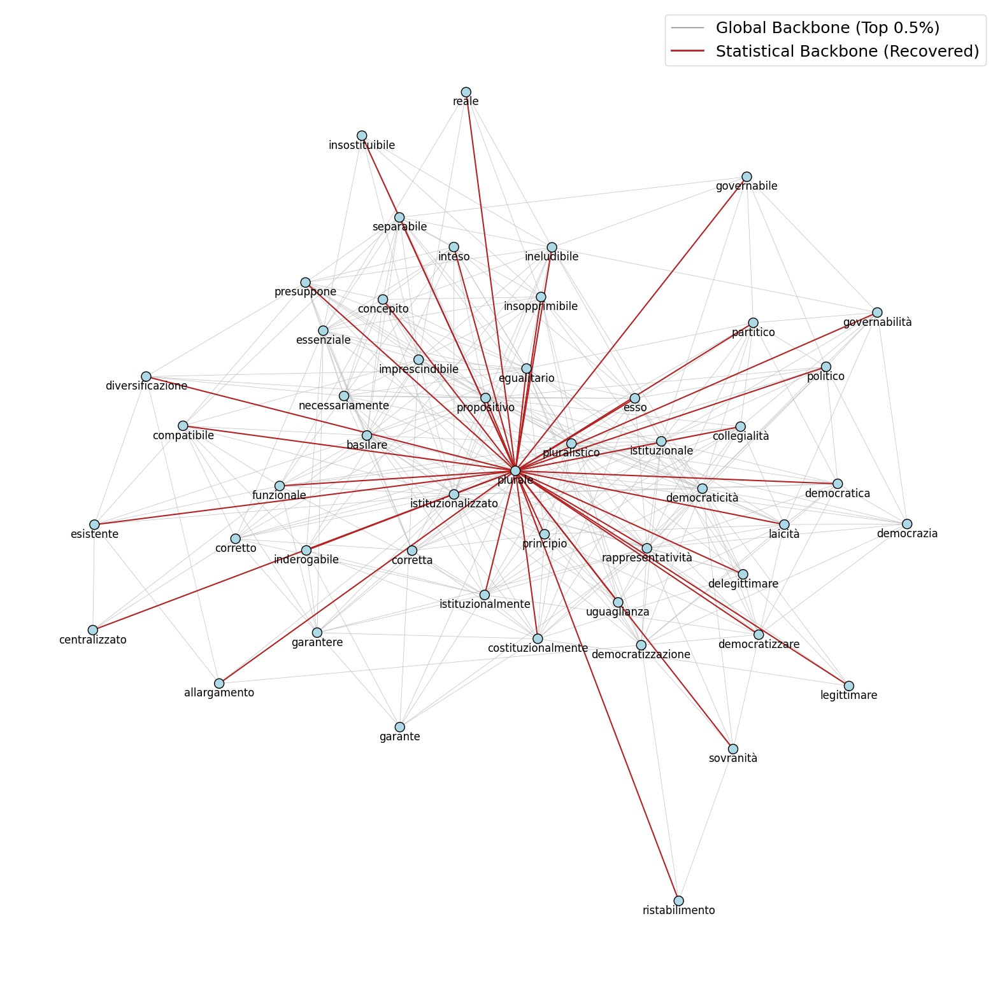

In [43]:
# --- 5. PLOT ---
print(f"Visualizzazione intorni di '{best_node_token}'...")
fig, ax = plt.subplots(figsize=(20, 20))

# Calcola il layout PRIMA di plottare
layout = sub_g.layout_fruchterman_reingold()

ig.plot(
    sub_g, 
    target=ax, 
    layout=layout,
    vertex_size=15, 
    vertex_color="lightblue",
    vertex_label=sub_g.vs["token"], 
    vertex_label_dist=1.5, 
    vertex_label_size=12,
    edge_color=edge_colors, 
    edge_width=edge_widths
)

# Legenda manuale
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='gray', lw=1, label='Global Backbone (Top 0.5%)'),
    Line2D([0], [0], color='firebrick', lw=2, label='Statistical Backbone (Recovered)')
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=18)
# plt.title(f"Hybrid Network Sample around '{best_node_token}'\n(Red edges are recovered by Disparity Filter)", fontsize=18)
plt.show()


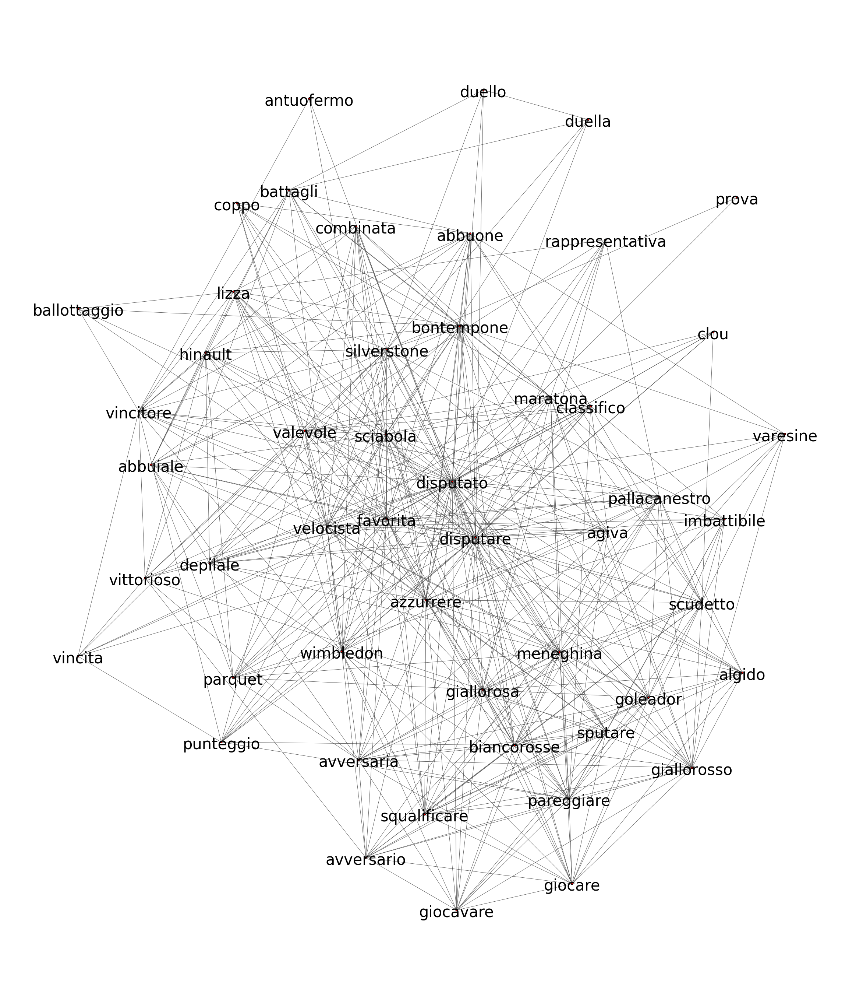

In [31]:
# visualizzazione di una parte del grafo (es. snap1)
from sklearn.pipeline import islice


g = ig.Graph.Read_Pickle("networks_hybrid/graph_snap3_hybrid.igp")
# sample di 1000 nodi tramite BFS (per mantenere la connettività)
max_nodes = 50

# Crea l'iteratore BFS partendo dal nodo 0
# prendiamo l'id del nodo che ha il token="campiona"
# start_node = g.vs.find(token="campiona").index
bfs_iter = g.bfsiter(0, mode="all")

# Estrai solo i primi 'max_nodes' nodi
sampled_nodes = list(islice(bfs_iter, max_nodes))

# Crea il sottografo
new_g = g.subgraph(sampled_nodes)

fig, ax = plt.subplots(figsize=(30, 35))
ig.plot(new_g, target=ax, vertex_size=5, vertex_label=new_g.vs["token"], vertex_label_dist=2, vertex_label_size=30, edge_width=0.6)


### 3.2) Node persistence analysis

Which are the persistent and volatile words?

In [13]:
input_dir = Path("networks_hybrid")
files = sorted([f for f in os.listdir(input_dir) if "snap" in f])

# Dizionario: chiave = parola, valore = set di anni in cui appare
word_presence = defaultdict(set)
all_years = []

print("Estrazione vocabolario temporale...")

for file in files:
    # Estrai anno dal nome file (es. graph_snap1960_p99.igp -> 1960)
    try:
        year = int(file.split("_")[1].replace("snap", ""))
    except:
        continue
        
    all_years.append(year)
    
    # Carica grafo
    path = input_dir / file
    G = ig.Graph.Read_Pickle(str(path))
    
    # Ottieni lista nodi 
    node_names = G.vs['token'] 
    
    for word in node_names:
        word_presence[word].add(year)

print(f"Analizzati {len(all_years)} snapshot.")

# --- CREAZIONE DATAFRAME DI ANALISI ---
rows = []
total_snapshots = len(all_years)

for word, years in word_presence.items():
    rows.append({
        "lemma": word,
        "count": len(years),                   # In quanti snap c'è
        "persistence_score": len(years) / total_snapshots, # % presenza (0-1)
        "first_seen": min(years),              # Anno nascita
        "last_seen": max(years),               # Anno morte (o ultimo rilevamento)
        "is_always_present": len(years) == total_snapshots
    })

df_persistence = pd.DataFrame(rows).sort_values("count", ascending=False)


Estrazione vocabolario temporale...
Analizzati 7 snapshot.


In [16]:
# --- STATISTICHE ---
avg_appearance = df_persistence['count'].mean()
median_appearance = df_persistence['count'].median()

print(f"\n--- RISULTATI PERSISTENZA ---")
print(f"Parole totali uniche nel corpus: {len(df_persistence)}")
print(f"Media snapshot per parola: {avg_appearance:.2f} su {total_snapshots}")
print(f"Mediana snapshot per parola: {median_appearance}")
print(f"Parole sempre presenti (Core): {df_persistence['is_always_present'].sum()}")

# Esempio Top 10 parole più stabili
print("\nTop 10 Parole più stabili:")
print(df_persistence.head(30)[['lemma', 'count', 'first_seen', 'last_seen']])

# Esempio Parole effimere (comparse 1 sola volta)
print("\nEsempio Parole effimere (Count=1):")
print(df_persistence[df_persistence['count'] == 1].head(30)['lemma'].tolist())


--- RISULTATI PERSISTENZA ---
Parole totali uniche nel corpus: 52366
Media snapshot per parola: 4.41 su 7
Mediana snapshot per parola: 5.0
Parole sempre presenti (Core): 20113

Top 10 Parole più stabili:
                lemma  count  first_seen  last_seen
0           disputato      7           1          7
20035         insetto      7           1          7
20032     ammonizione      7           1          7
20029          lenire      7           1          7
20028       cremonese      7           1          7
20027            glio      7           1          7
20026        lentezza      7           1          7
20025    connotazione      7           1          7
20024         stralco      7           1          7
20023           fuori      7           1          7
20021       venezuela      7           1          7
20019  favorevolmente      7           1          7
20018          spugna      7           1          7
20015       stabilito      7           1          7
20013         s

### 3.3) Jaccard Index and lexical turnover

- *Jaccard Index*: analyzes how much language is static (index=1) or dynamic (index=0) across time;
- *Lexical Turnover*: computes how many words enter and exit the vocabulary.

In [36]:
input_dir = Path("networks_hybrid_annotated") 
files = sorted([f for f in os.listdir(input_dir) if "snap" in f])

# Creiamo una lista di set di parole ordinate per anno
sets_by_year = []
# Assumo i file siano tipo "graph_snap1960.p"
sorted_files = sorted(files, key=lambda x: int(x.split("_")[1].replace("snap", "")))

for file in sorted_files:
    try:
        year = int(file.split("_")[1].replace("snap", ""))
    except: continue
        
    G = ig.Graph.Read_Pickle(str(input_dir / file))
    attr_name = 'token'
    words = set(G.vs[attr_name])
    sets_by_year.append( (year, words) )

dynamic_metrics = []

for i in range(len(sets_by_year) - 1):
    t0, set0 = sets_by_year[i]
    t1, set1 = sets_by_year[i+1]
    
    # Insiemi fondamentali
    intersection = set0.intersection(set1) # Core stabile
    union = set0.union(set1)
    new_words = set1 - set0  # Parole entrate
    lost_words = set0 - set1 # Parole uscite
    
    # --- METRICHE NORMALIZZATE ---
    
    # 1. Jaccard (Classico)
    jaccard = len(intersection) / len(union) if len(union) > 0 else 0
    
    # 2. Simpson's Overlap (Resistente alle differenze di grandezza)
    # Se t0=1000 parole e t1=2000 parole, e tutte le 1000 di t0 sono in t1:
    # Jaccard = 0.5 (sembra basso), Simpson = 1.0 (corretto, t0 è incluso in t1)
    simpson = len(intersection) / min(len(set0), len(set1)) if min(len(set0), len(set1)) > 0 else 0
    
    # 3. Volatilità Globale (Quanto cambia il sistema totale)
    # Range 0-1. Basso = Stabile, Alto = Turbolento.
    volatility = (len(new_words) + len(lost_words)) / (len(set0) + len(set1))
    
    # 4. Tassi Specifici (Innovation & Obsolescence)
    
    # 4.1 Innovation: % di parole di t1 che non c'erano prima
    innovation_rate = len(new_words) / len(set1) if len(set1) > 0 else 0
    
    # 4.2 Obsolescence: % di parole di t0 che non sono sopravvissute
    obsolescence_rate = len(lost_words) / len(set0) if len(set0) > 0 else 0

    # percentuale di parole complesse tra quelle perse (obsolescence) e tra quelle nuove (innovation)
    # complessità = De Mauro alto
    new_words_complexity = []
    lost_words_complexity = []
    
    
    # 5. Delta Vocabolario (Crescita/Decrescita netta percentuale)
    # Positivo = Vocabolario si espande, Negativo = Si contrae (RQ1 signal!)
    growth_rate = (len(set1) - len(set0)) / len(set0) if len(set0) > 0 else 0

    dynamic_metrics.append({
        "interval": f"{t0}-{t1}",
        "jaccard": jaccard, # Jaccard index: quante parole sono condivise tra i due intervalli
        "simpson_overlap": simpson, # Simpson's Overlap: quanto un insieme è contenuto nell'altro 
        "volatility": volatility, # Quanto il vocabolario è volatile (1: completamente diverso, 0: identico)
        "innovation_rate": innovation_rate,     # % di parole nuove (Quanto del vocabolario odierno è nuovo?)
        "obsolescence_rate": obsolescence_rate, # % di parole perse (Quanto del vocabolario passato è andato perso?)
        "growth_rate": growth_rate,             # Espansione/Contrazione del vocabolario normalizzata
        "raw_new": len(new_words),              # N. parole nuove
        "raw_lost": len(lost_words)             # N. parole perse
    })

df_dyn = pd.DataFrame(dynamic_metrics)

print("\n--- ANALISI DINAMICA NORMALIZZATA ---")
print(df_dyn[['interval', 'volatility', 'innovation_rate', 'obsolescence_rate', 'growth_rate', 'simpson_overlap']].head())



--- ANALISI DINAMICA NORMALIZZATA ---
  interval  volatility  innovation_rate  obsolescence_rate  growth_rate  \
0      1-2    0.181823         0.083628           0.261010    -0.193570   
1      2-3    0.123490         0.123662           0.123318     0.000393   
2      3-4    0.166493         0.243995           0.071286     0.228450   
3      4-5    0.113926         0.145677           0.079725     0.077198   
4      5-6    0.155551         0.161931           0.149074     0.015341   

   simpson_overlap  
0         0.916372  
1         0.876682  
2         0.928714  
3         0.920275  
4         0.850926  


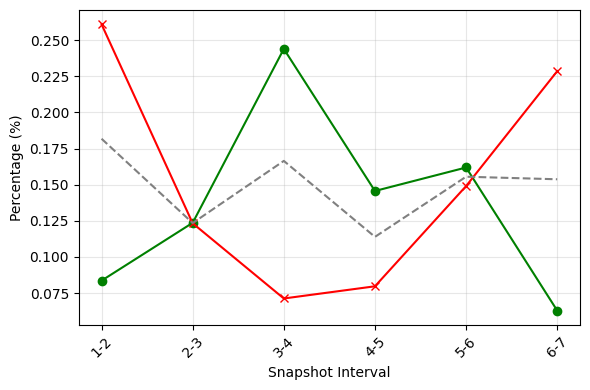

In [37]:
# Visualizzazione rapida trend

# Tasso di Innovazione, Obsolescenza e Volatilità nel tempo
plt.figure(figsize=(6, 4))
plt.plot(df_dyn['interval'], df_dyn['innovation_rate'], label='Innovation Rate (New/Total)', marker='o', color='green')
plt.plot(df_dyn['interval'], df_dyn['obsolescence_rate'], label='Obsolescence Rate (Lost/Total)', marker='x', color='red')
plt.plot(df_dyn['interval'], df_dyn['volatility'], label='Total Volatility', linestyle='--', color='grey')

plt.xlabel('Snapshot Interval')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45)
#plt.title("Evolution of Lexical Turnover (Normalized)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

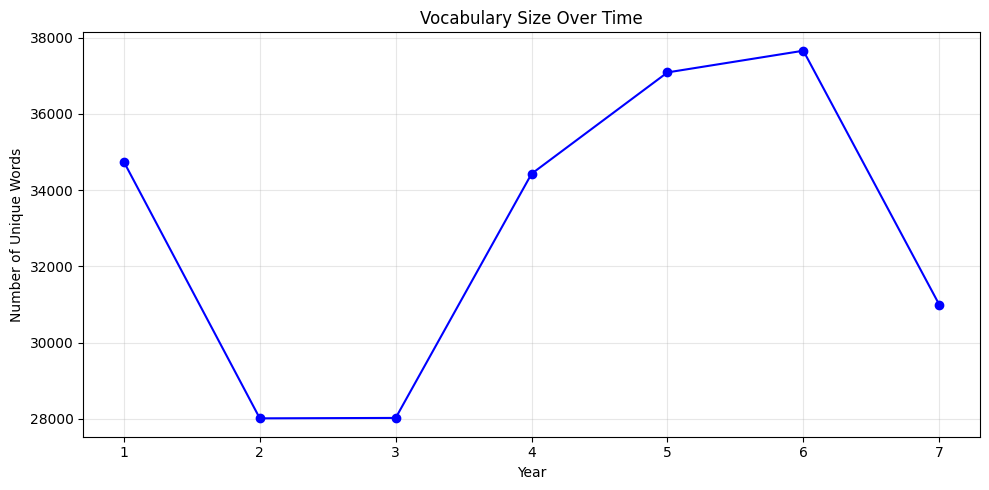

In [9]:
# dimensioni dei vocabolari nel tempo
vocab_sizes = []
for file in sorted_files:
    try:
        year = int(file.split("_")[1].replace("snap", ""))
    except:
        continue
        
    G = ig.Graph.Read_Pickle(str(input_dir / file))
    attr_name = 'token'
    words = set(G.vs[attr_name])
    vocab_sizes.append( (year, len(words)) )
    years, sizes = zip(*vocab_sizes)
plt.figure(figsize=(10, 5))
plt.plot(years, sizes, marker='o', color='blue')
plt.title("Vocabulary Size Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Unique Words")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [19]:
# average jaccard similarity
avg_jaccard = df_dyn['jaccard'].mean()
print(f"\nAverage Jaccard Similarity across intervals: {avg_jaccard:.4f}") # quanto il vocabolario rimane in media simile da un intervallo al successivo
# average volatility
avg_volatility = df_dyn['volatility'].mean()
print(f"Average Volatility across intervals: {avg_volatility:.4f}") # quanto il vocabolario cambia in media da un intervallo al successivo
# average growth rate
avg_growth = df_dyn['growth_rate'].mean()
print(f"Average Growth Rate across intervals: {avg_growth:.4f}") # in media il vocabolario si espande o si contrae? (positivo = espansione, negativo = contrazione)
# average simpson overlap
avg_simpson = df_dyn['simpson_overlap'].mean()
print(f"Average Simpson's Overlap across intervals: {avg_simpson:.4f}") # quanto in media un intervallo è contenuto nell'altro (resistente a differenze di grandezza)
# average survival rate
avg_survival = df_dyn['innovation_rate'].mean()
print(f"Average Survival Rate across intervals: {avg_survival:.4f}") # in media quanto del vocabolario odierno è nuovo (non presente prima)
# average obsolescence rate
avg_obsolescence = df_dyn['obsolescence_rate'].mean()
print(f"Average Obsolescence Rate across intervals: {avg_obsolescence:.4f}") # in media quanto del vocabolario passato è andato perso (non presente dopo)


Average Jaccard Similarity across intervals: 0.7411
Average Volatility across intervals: 0.1492
Average Growth Rate across intervals: -0.0082
Average Simpson's Overlap across intervals: 0.9050
Average Survival Rate across intervals: 0.1370
Average Obsolescence Rate across intervals: 0.1522


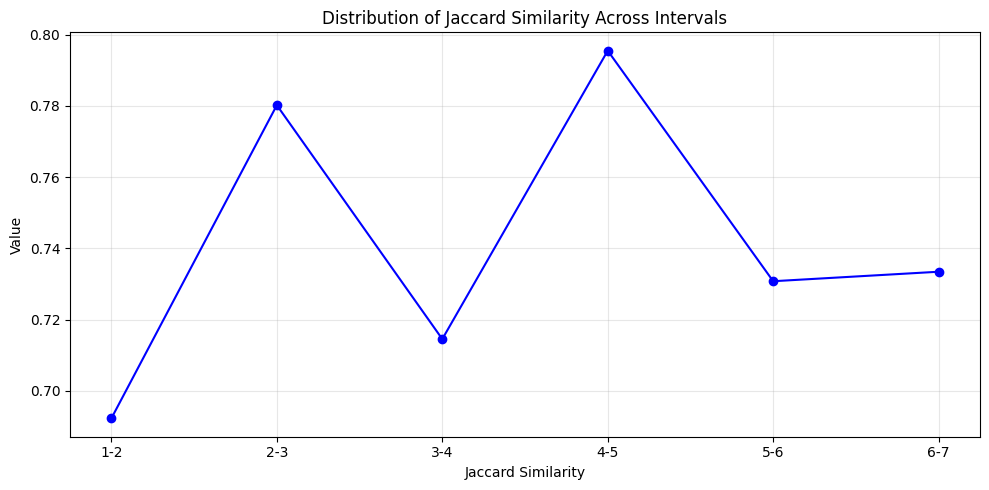

In [11]:
# jaccard similarity across intervals
plt.figure(figsize=(10, 5))
plt.plot(df_dyn['interval'], df_dyn['jaccard'], marker='o', color='blue')
plt.title("Distribution of Jaccard Similarity Across Intervals")
plt.xlabel("Jaccard Similarity")
plt.ylabel("Value")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### 3.4) Complexity-dynamics correlation

Do the complex words tend to be the more volatile?

In [ ]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

# =============================================================================
# ANALISI
# =============================================================================
results = []
print("--- ANALISI COMPLESSITÀ (BAR CHART) ---")

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not fpath.exists(): continue
        
    try:
        g = ig.Graph.Read_Pickle(str(fpath))
        
        if 'demauro_level' in g.vs.attributes():
            levels = g.vs['demauro_level']
        else:
            continue
            
        total_nodes = len(levels)
        count_simple = 0
        count_complex = 0
        
        for lvl in levels:
            # Livelli 0, 1, 2 -> Semplici (Vocabolario di Base)
            if lvl is not None and lvl <= 2:
                count_simple += 1
            # Livelli 3 o None -> Complesse / Altro
            else:
                count_complex += 1
        
        perc_simple = (count_simple / total_nodes) * 100
        perc_complex = (count_complex / total_nodes) * 100
        
        results.append({
            'Snapshot': snap,
            '% Fundamental (VdB)': perc_simple,
            '% Complex (Other)': perc_complex
        })
        
        print(f"Snap {snap}: {perc_simple:.1f}% Fundamental vs {perc_complex:.1f}% Complex")

    except Exception as e:
        print(f"Errore snap {snap}: {e}")

df_res = pd.DataFrame(results)


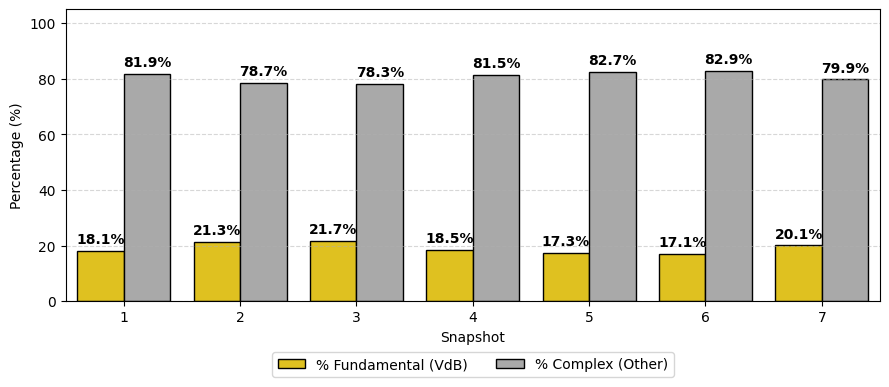

In [74]:

# =============================================================================
# VISUALIZZAZIONE (BAR PLOT)
# =============================================================================

# Trasformiamo i dati in formato "lungo" (Long Format) per Seaborn
df_melted = df_res.melt(id_vars=['Snapshot'], 
                        value_vars=['% Fundamental (VdB)', '% Complex (Other)'],
                        var_name='Categoria', value_name='Percentuale')

plt.figure(figsize=(9, 4))

# Creazione del Bar Plot
# hue='Categoria' crea le barre affiancate per ogni snapshot
ax = sns.barplot(data=df_melted, x='Snapshot', y='Percentuale', hue='Categoria',
                 palette=['#FFD700', '#A9A9A9'], # Oro per VdB, Grigio per Altro
                 edgecolor='black') 

# Decorazioni
#plt.title("Evolution of Vocabulary Composition\n(Fundamental Vocabulary vs. Extended Lexicon)", fontsize=15)
plt.ylabel("Percentage (%)")
plt.xlabel("Snapshot")
plt.xticks()
plt.yticks()
plt.ylim(0, 105) # Un po' di spazio sopra per le etichette
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title=None, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)

# Aggiunta delle etichette con i valori sopra ogni barra
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', padding=3, fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

In [20]:
# Configurazione
input_dir = Path("networks_hybrid_annotated") 
files = sorted([f for f in os.listdir(input_dir) if "snap" in f], 
               key=lambda x: int(x.split("_")[1].replace("snap", "")))

turnover_quality = []

print("Inizio analisi qualitativa del turnover...")

# Funzione helper per calcolare media attributi di un set di parole
def get_set_metrics(word_set, attribute_lookup_dict):
    """
    Calcola le medie di IDF, De Mauro e Lunghezza per un set di parole
    usando un dizionario di lookup {parola: {attr: val}}.
    """
    if not word_set:
        return 0, 0, 0
    
    idfs = []
    dms = [] # De Mauro (0=Semplice, 3=Complesso)
    lens = []
    syls = []
    
    for word in word_set:
        # Se per qualche motivo la parola non ha attributi (non dovrebbe succedere), saltiamo
        if word in attribute_lookup_dict:
            attrs = attribute_lookup_dict[word]
            idfs.append(attrs['idf'])
            dms.append(attrs['demauro_level'])
            lens.append(attrs['char_len'])
            syls.append(attrs['syll_len'])

    return np.mean(idfs), np.mean(dms), np.mean(lens), np.mean(syls)


# Ciclo sugli intervalli temporali
for i in range(len(files) - 1):
    file_t0 = files[i]
    file_t1 = files[i+1]
    
    t0 = int(file_t0.split("_")[1].replace("snap", ""))
    t1 = int(file_t1.split("_")[1].replace("snap", ""))
    
    print(f"Analisi intervallo {t0}-{t1}...", end="")
    
    # 1. Carichiamo i due grafi
    G0 = ig.Graph.Read_Pickle(str(input_dir / file_t0))
    G1 = ig.Graph.Read_Pickle(str(input_dir / file_t1))
    
    # 2. Creiamo dizionari di lookup veloci per gli attributi
    # Ci serve per non fare G.vs.find() dentro il ciclo (che è lento)
    # Nota: Usiamo 'name' o 'token' a seconda di come hai salvato
    attr_key = 'name' if 'name' in G0.vs.attributes() else 'token'
    
    # Lookup per il tempo T0 (serve per le parole STABILI e PERSE)
    lookup_t0 = {
        v[attr_key]: {
            'idf': v['idf'], 
            'demauro_level': v['demauro_level'], 
            'char_len': v['char_len'],
            'syll_len': v['syll_len']
        } for v in G0.vs
    }
    
    # Lookup per il tempo T1 (serve per le parole NUOVE)
    lookup_t1 = {
        v[attr_key]: {
            'idf': v['idf'], 
            'demauro_level': v['demauro_level'], 
            'char_len': v['char_len'],
            'syll_len': v['syll_len']
        } for v in G1.vs
    }
    
    # 3. Identifichiamo i Set
    set0 = set(lookup_t0.keys())
    set1 = set(lookup_t1.keys())
    
    stable_words = set0.intersection(set1) # Parole rimaste
    lost_words = set0 - set1               # Parole uscite
    new_words = set1 - set0                # Parole entrate
    
    # 4. Calcoliamo le metriche medie per ogni gruppo
    
    # A. Gruppo STABLE (Usiamo i valori di T0 come riferimento)
    stable_idf, stable_dm, stable_len, stable_syl = get_set_metrics(stable_words, lookup_t0)
    
    # B. Gruppo LOST (Usiamo i valori di T0, perché in T1 non esistono più)
    lost_idf, lost_dm, lost_len, lost_syl = get_set_metrics(lost_words, lookup_t0)
    
    # C. Gruppo NEW (Usiamo i valori di T1, perché in T0 non esistevano)
    new_idf, new_dm, new_len, new_syl = get_set_metrics(new_words, lookup_t1)
    
    turnover_quality.append({
        "interval": f"{t0}-{t1}",
        "year_start": t0,
        
        # IDF (Specificità)
        "idf_stable": stable_idf,
        "idf_lost": lost_idf,
        "idf_new": new_idf,
        
        # De Mauro (0=Semplice, 3=Complesso)
        "dm_stable": stable_dm,
        "dm_lost": lost_dm,
        "dm_new": new_dm,
        
        # Lunghezza (caratteri)
        "len_stable": stable_len,
        "len_lost": lost_len,
        "len_new": new_len,

        # Lunghezza (sillabe)
        "syl_stable": stable_syl,
        "syl_lost": lost_syl,
        "syl_new": new_syl,
        
        # Conteggi per contesto
        "count_lost": len(lost_words),
        "count_new": len(new_words)
    })
    
    print(" Fatto.")

df_qual = pd.DataFrame(turnover_quality)


Inizio analisi qualitativa del turnover...
Analisi intervallo 1-2... Fatto.
Analisi intervallo 2-3... Fatto.
Analisi intervallo 3-4... Fatto.
Analisi intervallo 4-5... Fatto.
Analisi intervallo 5-6... Fatto.
Analisi intervallo 6-7... Fatto.


In [21]:
# --- VISUALIZZAZIONE E INTERPRETAZIONE ---
print("\n--- ANALISI QUALITATIVA DEL TURNOVER ---")
print(df_qual[['interval', 'idf_stable', 'idf_lost', 'idf_new', 'dm_stable', 'dm_lost', 'dm_new', 'len_stable', 'len_lost', 'len_new', 'syl_stable', 'syl_lost', 'syl_new']])

# Calcoliamo il "Complexity Gap" medio (Lost - New)
# Se positivo, stiamo perdendo parole più complesse di quelle che entrano
df_qual['gap_idf'] = df_qual['idf_lost'] - df_qual['idf_new'] 
df_qual['gap_dm'] = df_qual['dm_lost'] - df_qual['dm_new']
df_qual['gap_len'] = df_qual['len_lost'] - df_qual['len_new']
df_qual['gap_syl'] = df_qual['syl_lost'] - df_qual['syl_new']

print(f"\nMedia Gap IDF (Lost - New): {df_qual['gap_idf'].median():.4f}")
print("(Se positivo: le parole perse erano più specifiche di quelle nuove)")

print(f"Media Gap De Mauro (Lost - New): {df_qual['gap_dm'].median():.4f}")
print("(Se positivo: le parole perse erano più 'difficili' di quelle nuove)")

print(f"Media Gap Lunghezza Caratteri (Lost - New): { (df_qual['gap_len']).median():.4f}")
print("(Se positivo: le parole perse erano più lunghe (in caratteri) di quelle nuove)")

print(f"Media Gap Lunghezza Sillabe (Lost - New): { (df_qual['gap_syl']).median():.4f}")
print("(Se positivo: le parole perse erano più lunghe (in sillabe) di quelle nuove)")


--- ANALISI QUALITATIVA DEL TURNOVER ---
  interval  idf_stable  idf_lost  idf_new  dm_stable  dm_lost   dm_new  len_stable  len_lost  len_new  syl_stable  syl_lost  syl_new
0      1-2   -0.045672  0.712887 0.565777   2.512113 2.952581 2.975672    8.056399  7.863255 8.862143    3.292046  3.206661 3.585147
1      2-3   -0.074200  0.571789 0.351346   2.491287 2.974530 2.930756    8.159108  7.872648 8.307559    3.333686  3.194790 3.355453
2      3-4   -0.073986  0.661231 0.528064   2.511986 2.983984 2.954291    8.172609  8.240741 7.772884    3.338071  3.314314 3.171051
3      4-5    0.010917  0.788517 0.789004   2.588872 2.978142 2.976124    8.064003  8.202914 8.083842    3.294357  3.331512 3.263742
4      5-6    0.012435  0.762610 0.936922   2.586122 2.982999 2.980157    8.176743  7.439863 8.518695    3.335171  3.031470 3.419810
5      6-7    0.006313  0.688010 1.008140   2.555525 2.968518 2.983590    8.192874  8.364545 7.856923    3.337728  3.386501 3.128205

Media Gap IDF (Lost - New)

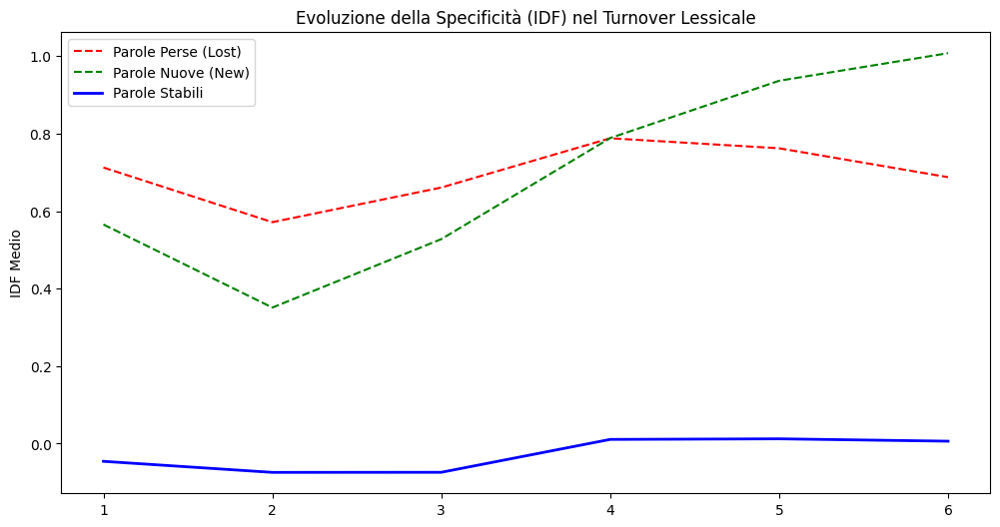

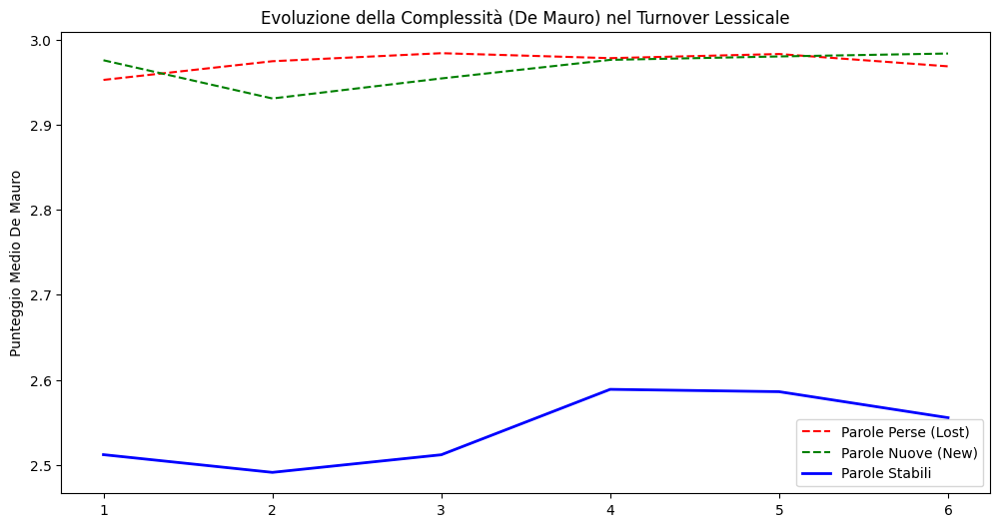

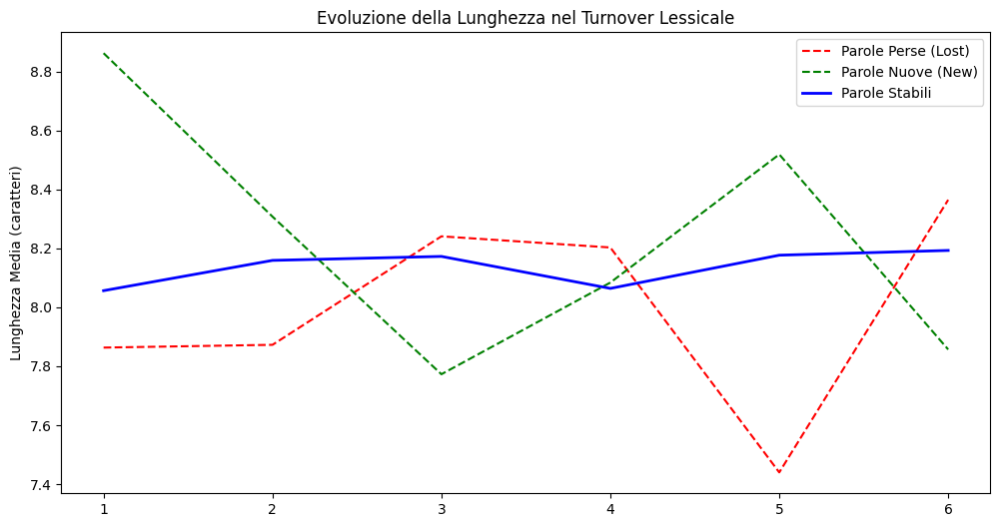

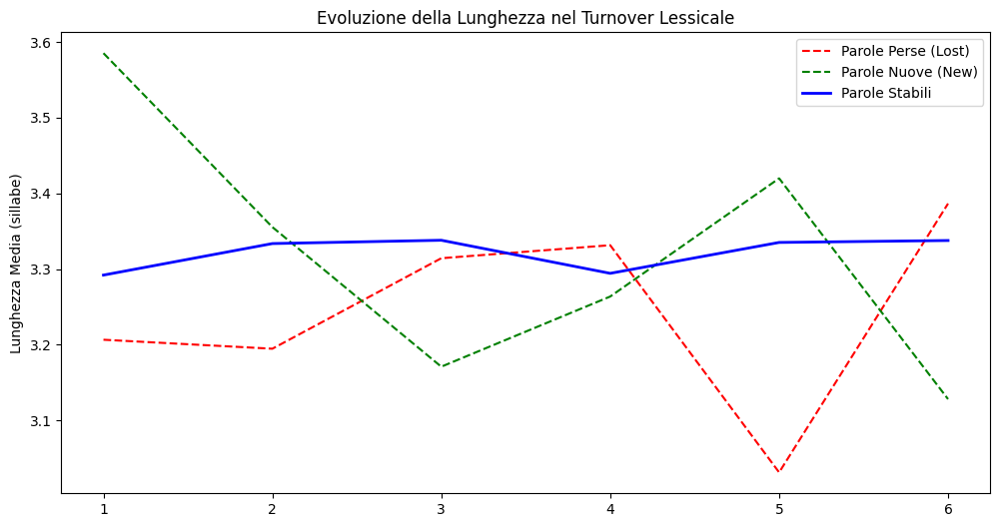

In [22]:
# plot IDF evolution

plt.figure(figsize=(12, 6))
plt.plot(df_qual['year_start'], df_qual['idf_lost'], label='Parole Perse (Lost)', color='red', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['idf_new'], label='Parole Nuove (New)', color='green', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['idf_stable'], label='Parole Stabili', color='blue', linewidth=2)

plt.title("Evoluzione della Specificità (IDF) nel Turnover Lessicale")
plt.ylabel("IDF Medio")
plt.legend()
plt.show()

# plot De Mauro evolution
plt.figure(figsize=(12, 6))
plt.plot(df_qual['year_start'], df_qual['dm_lost'], label='Parole Perse (Lost)', color='red', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['dm_new'], label='Parole Nuove (New)', color='green', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['dm_stable'], label='Parole Stabili', color='blue', linewidth=2)
plt.title("Evoluzione della Complessità (De Mauro) nel Turnover Lessicale")
plt.ylabel("Punteggio Medio De Mauro")
plt.legend()
plt.show()

# plot Length (in characters) evolution
plt.figure(figsize=(12, 6))
plt.plot(df_qual['year_start'], df_qual['len_lost'], label='Parole Perse (Lost)', color='red', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['len_new'], label='Parole Nuove (New)', color='green', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['len_stable'], label='Parole Stabili', color='blue', linewidth=2)
plt.title("Evoluzione della Lunghezza nel Turnover Lessicale")
plt.ylabel("Lunghezza Media (caratteri)")
plt.legend()
plt.show()

# plot Length (in syllables) evolution
plt.figure(figsize=(12, 6))
plt.plot(df_qual['year_start'], df_qual['syl_lost'], label='Parole Perse (Lost)', color='red', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['syl_new'], label='Parole Nuove (New)', color='green', linestyle='--')
plt.plot(df_qual['year_start'], df_qual['syl_stable'], label='Parole Stabili', color='blue', linewidth=2)
plt.title("Evoluzione della Lunghezza nel Turnover Lessicale")
plt.ylabel("Lunghezza Media (sillabe)")
plt.legend()
plt.show()

--- ANALISI COMPOSIZIONE CORE NETWORK ---
Dimensione Core (Parole presenti in tutti gli snap): 20113

--- DISTRIBUZIONE DE MAURO NEL CORE ---
category
Altro / Comune             14336
Alto Uso (AU)               2816
Fondamentale (FO)           1884
Alta Disponibilità (AD)     1077
Name: count, dtype: int64

--- PERCENTUALI ---
category
Altro / Comune            71.277283
Alto Uso (AU)             14.000895
Fondamentale (FO)          9.367076
Alta Disponibilità (AD)    5.354746
Name: proportion, dtype: float64

TOTALE PAROLE 'FONDAMENTALI' (FO+AU+AD) nel Core:
5777 su 20113 (28.72%)


C:\Users\leona\AppData\Local\Temp\ipykernel_2460\2295471766.py:113: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_core, x='category', order=order, palette='viridis')


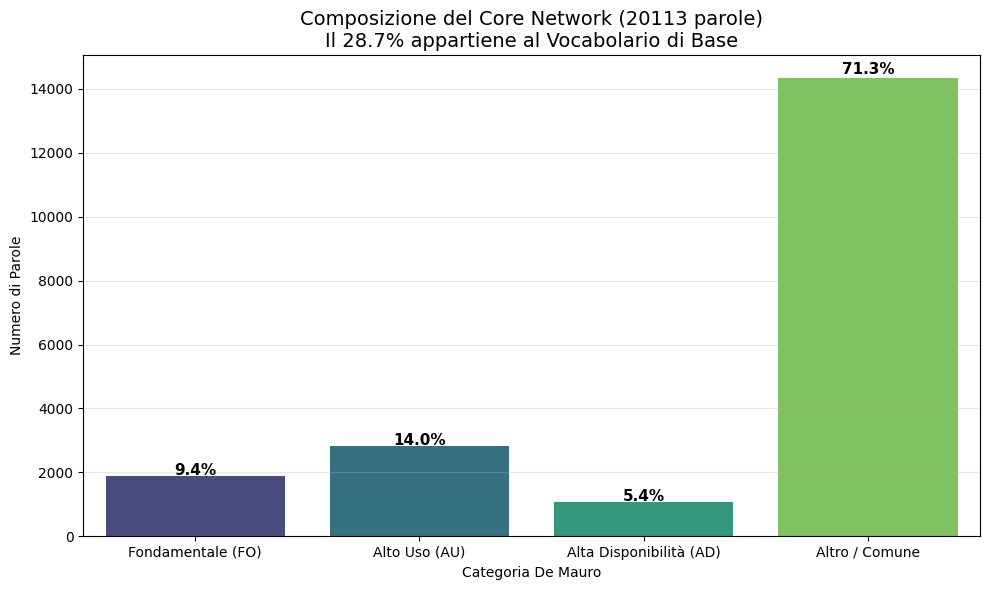

In [18]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

# Mappatura De Mauro (Assumiamo la codifica standard numerica)
# 0 = Fondamentale (FO)
# 1 = Alto Uso (AU)
# 2 = Alta Disponibilità (AD)
# 3 = Comune / Altro
demauro_labels = {
    0: 'Fondamentale (FO)',
    1: 'Alto Uso (AU)',
    2: 'Alta Disponibilità (AD)',
    3: 'Altro / Comune'
}

# =============================================================================
# 1. ESTRAZIONE DEL CORE (Parole Persistenti)
# =============================================================================
print("--- ANALISI COMPOSIZIONE CORE NETWORK ---")

common_nodes = None

# Ciclo per trovare l'intersezione
for snap in snapshots:
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    nodes = set(g.vs['token'])
    
    if common_nodes is None:
        common_nodes = nodes
    else:
        common_nodes = common_nodes.intersection(nodes)

print(f"Dimensione Core (Parole presenti in tutti gli snap): {len(common_nodes)}")

# =============================================================================
# 2. RECUPERO ATTRIBUTI (Dal primo grafo)
# =============================================================================
# Usiamo il grafo 1 per estrarre i livelli De Mauro (sono proprietà statiche)
g_ref = ig.Graph.Read_Pickle(str(input_dir / "graph_snap1_hybrid.igp"))

# Filtriamo solo i nodi del Core
g_core = g_ref.subgraph(g_ref.vs.select(token_in=common_nodes))

# Estraiamo i dati
data = []
for v in g_core.vs:
    lvl = v['demauro_level']
    
    # Gestione valori mancanti o None
    if lvl is None:
        category = "Unknown"
        is_fundamental = False
    else:
        lvl = int(lvl)
        category = demauro_labels.get(lvl, "Unknown")
        # Fondamentale = FO (0), AU (1), AD (2) -> Vocabolario di Base
        is_fundamental = (lvl <= 2)

    data.append({
        'token': v['token'],
        'demauro_level': lvl,
        'category': category,
        'is_fundamental': is_fundamental
    })

df_core = pd.DataFrame(data)

# =============================================================================
# 3. CALCOLO STATISTICHE
# =============================================================================

# Conteggi
counts = df_core['category'].value_counts()
perc = df_core['category'].value_counts(normalize=True) * 100

print("\n--- DISTRIBUZIONE DE MAURO NEL CORE ---")
print(counts)
print("\n--- PERCENTUALI ---")
print(perc)

# Focus sul "Vocabolario di Base" (0+1+2)
n_fundamental = df_core['is_fundamental'].sum()
perc_fundamental = (n_fundamental / len(df_core)) * 100

print(f"\nTOTALE PAROLE 'FONDAMENTALI' (FO+AU+AD) nel Core:")
print(f"{n_fundamental} su {len(df_core)} ({perc_fundamental:.2f}%)")

# =============================================================================
# 4. VISUALIZZAZIONE
# =============================================================================

plt.figure(figsize=(10, 6))

# Ordine personalizzato per il plot
order = ['Fondamentale (FO)', 'Alto Uso (AU)', 'Alta Disponibilità (AD)', 'Altro / Comune', 'Unknown']
# Filtra solo quelli presenti
order = [o for o in order if o in df_core['category'].unique()]

# Barplot
ax = sns.countplot(data=df_core, x='category', order=order, palette='viridis')

# Aggiungi etichette percentuali sopra le barre
total = len(df_core)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + (height * 0.01),
            f'{height/total:.1%}',
            ha="center", fontsize=11, fontweight='bold')

plt.title(f"Composizione del Core Network ({len(common_nodes)} parole)\nIl {perc_fundamental:.1f}% appartiene al Vocabolario di Base", fontsize=14)
plt.ylabel("Numero di Parole")
plt.xlabel("Categoria De Mauro")
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

# Mappatura De Mauro (Assumiamo la codifica standard numerica)
# 0 = Fondamentale (FO)
# 1 = Alto Uso (AU)
# 2 = Alta Disponibilità (AD)
# 3 = Comune / Altro
demauro_labels = {
    0: 'Fondamentale (FO)',
    1: 'Alto Uso (AU)',
    2: 'Alta Disponibilità (AD)',
    3: 'Altro / Comune'
}

# =============================================================================
# 1. ESTRAZIONE DEL CORE (Parole Persistenti)
# =============================================================================
print("--- ANALISI COMPOSIZIONE CORE NETWORK ---")

common_nodes = None

# Ciclo per trovare l'intersezione
for snap in snapshots:
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    nodes = set(g.vs['token'])
    
    if common_nodes is None:
        common_nodes = nodes
    else:
        common_nodes = common_nodes.intersection(nodes)

print(f"Dimensione Core (Parole presenti in tutti gli snap): {len(common_nodes)}")

# =============================================================================
# 2. RECUPERO ATTRIBUTI (Dal primo grafo)
# =============================================================================
# Usiamo il grafo 1 per estrarre i livelli De Mauro (sono proprietà statiche)
g_ref = ig.Graph.Read_Pickle(str(input_dir / "graph_snap1_hybrid.igp"))

# Filtriamo solo i nodi del Core
g_core = g_ref.subgraph(g_ref.vs.select(token_in=common_nodes))

# Estraiamo i dati
data = []
for v in g_core.vs:
    lvl = v['demauro_level']
    
    # Gestione valori mancanti o None
    if lvl is None:
        category = "Unknown"
        is_fundamental = False
    else:
        lvl = int(lvl)
        category = demauro_labels.get(lvl, "Unknown")
        # Fondamentale = FO (0), AU (1), AD (2) -> Vocabolario di Base
        is_fundamental = (lvl <= 2)

    data.append({
        'token': v['token'],
        'demauro_level': lvl,
        'category': category,
        'is_fundamental': is_fundamental
    })

df_core = pd.DataFrame(data)

# =============================================================================
# 3. CALCOLO STATISTICHE
# =============================================================================

# Conteggi
counts = df_core['category'].value_counts()
perc = df_core['category'].value_counts(normalize=True) * 100

print("\n--- DISTRIBUZIONE DE MAURO NEL CORE ---")
print(counts)
print("\n--- PERCENTUALI ---")
print(perc)

# Focus sul "Vocabolario di Base" (0+1+2)
n_fundamental = df_core['is_fundamental'].sum()
perc_fundamental = (n_fundamental / len(df_core)) * 100

print(f"\nTOTALE PAROLE 'FONDAMENTALI' (FO+AU+AD) nel Core:")
print(f"{n_fundamental} su {len(df_core)} ({perc_fundamental:.2f}%)")

# =============================================================================
# 4. VISUALIZZAZIONE
# =============================================================================

plt.figure(figsize=(10, 6))

# Ordine personalizzato per il plot
order = ['Fondamentale (FO)', 'Alto Uso (AU)', 'Alta Disponibilità (AD)', 'Altro / Comune', 'Unknown']
# Filtra solo quelli presenti
order = [o for o in order if o in df_core['category'].unique()]

# Barplot
ax = sns.countplot(data=df_core, x='category', order=order, palette='viridis')

# Aggiungi etichette percentuali sopra le barre
total = len(df_core)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + (height * 0.01),
            f'{height/total:.1%}',
            ha="center", fontsize=11, fontweight='bold')

plt.title(f"Composizione del Core Network ({len(common_nodes)} parole)\nIl {perc_fundamental:.1f}% appartiene al Vocabolario di Base", fontsize=14)
plt.ylabel("Numero di Parole")
plt.xlabel("Categoria De Mauro")
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

--- IDENTIFICAZIONE PAROLE TRANSIENTI (NON-PERSISTENTI) ---
Totale Parole Uniche (Union): 52366
Parole Core (Persistent): 20113
Parole Transient (Non-Persistent): 32253

Recupero attributi De Mauro per le parole transient...

--- DISTRIBUZIONE TRANSIENT ---
category
Altro / Comune            97.302577
Alta Disponibilità (AD)    2.250953
Alto Uso (AU)              0.403063
Fondamentale (FO)          0.043407
Name: proportion, dtype: float64

Parole Fondamentali nel Transient: 870 (2.7%)


C:\Users\leona\AppData\Local\Temp\ipykernel_2460\3152945583.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_transient, x='category', order=order, palette='magma')


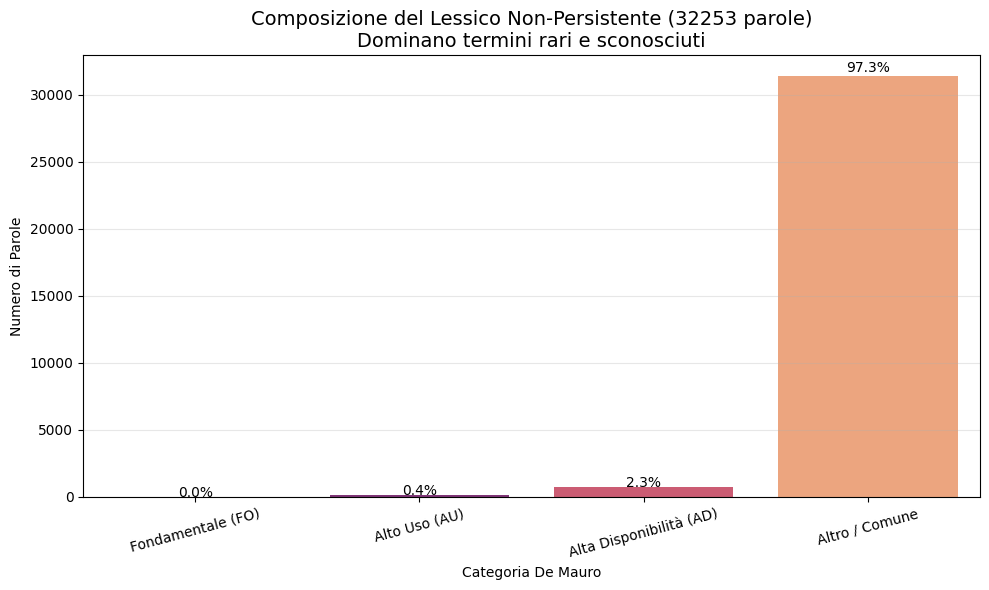

In [20]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

demauro_labels = {
    0: 'Fondamentale (FO)',
    1: 'Alto Uso (AU)',
    2: 'Alta Disponibilità (AD)',
    3: 'Altro / Comune'
}

# =============================================================================
# 1. IDENTIFICAZIONE CORE E TRANSIENT
# =============================================================================
print("--- IDENTIFICAZIONE PAROLE TRANSIENTI (NON-PERSISTENTI) ---")

core_nodes = None
all_nodes = set()

# Prima passata: identifichiamo chi è Core e chi è l'Unione totale
for snap in snapshots:
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    nodes = set(g.vs['token'])
    
    # Aggiorna unione
    all_nodes.update(nodes)
    
    # Aggiorna intersezione (Core)
    if core_nodes is None:
        core_nodes = nodes
    else:
        core_nodes = core_nodes.intersection(nodes)

# Definiamo le Transient: Tutto ciò che esiste ma NON è nel Core
transient_nodes = all_nodes - core_nodes

print(f"Totale Parole Uniche (Union): {len(all_nodes)}")
print(f"Parole Core (Persistent): {len(core_nodes)}")
print(f"Parole Transient (Non-Persistent): {len(transient_nodes)}")

# =============================================================================
# 2. RECUPERO ATTRIBUTI PER LE TRANSIENT
# =============================================================================
# Attenzione: Le parole transient non sono tutte nel grafo 1.
# Dobbiamo cercarle in tutti gli snapshot finché non troviamo il loro attributo.

node_data = {} # Dizionario {token: livello} per evitare duplicati

print("\nRecupero attributi De Mauro per le parole transient...")

for snap in snapshots:
    # Se abbiamo già trovato tutte le parole, ci fermiamo
    if len(node_data) == len(transient_nodes):
        break
        
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    
    # Per ogni nodo del grafo corrente
    for v in g.vs:
        token = v['token']
        
        # Se è una parola transient e non l'abbiamo ancora analizzata
        if token in transient_nodes and token not in node_data:
            lvl = v['demauro_level']
            node_data[token] = lvl

# Creazione DataFrame
data_list = []
for token, lvl in node_data.items():
    if lvl is None:
        category = "Unknown / Neologism"
        is_fundamental = False
    else:
        lvl = int(lvl)
        # Se il livello è fuori range standard (es. errori), lo mettiamo in Altro
        if lvl in demauro_labels:
            category = demauro_labels[lvl]
        else:
            category = "Altro / Comune" # Fallback per livelli > 3
            
        is_fundamental = (lvl <= 2) # 0, 1, 2

    data_list.append({
        'token': token,
        'category': category,
        'is_fundamental': is_fundamental
    })

df_transient = pd.DataFrame(data_list)

# =============================================================================
# 3. STATISTICHE E CONFRONTO
# =============================================================================

counts = df_transient['category'].value_counts()
perc = df_transient['category'].value_counts(normalize=True) * 100

print("\n--- DISTRIBUZIONE TRANSIENT ---")
print(perc)

n_fund = df_transient['is_fundamental'].sum()
print(f"\nParole Fondamentali nel Transient: {n_fund} ({n_fund/len(df_transient):.1%})")

# =============================================================================
# 4. VISUALIZZAZIONE
# =============================================================================

plt.figure(figsize=(10, 6))

order = ['Fondamentale (FO)', 'Alto Uso (AU)', 'Alta Disponibilità (AD)', 'Altro / Comune', 'Unknown / Neologism']
# Filtra per quelli presenti
order = [o for o in order if o in df_transient['category'].unique()]

ax = sns.countplot(data=df_transient, x='category', order=order, palette='magma')

total = len(df_transient)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + (height * 0.01),
            f'{height/total:.1%}',
            ha="center", fontsize=10)

plt.title(f"Composizione del Lessico Non-Persistente ({len(transient_nodes)} parole)\nDominano termini rari e sconosciuti", fontsize=14)
plt.xlabel("Categoria De Mauro")
plt.ylabel("Numero di Parole")
plt.xticks(rotation=15)
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
import igraph as ig
import matplotlib.pyplot as plt
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") # Cartella coi grafi annotati
snapshots = range(1, 8)

# =============================================================================
# 1. IDENTIFICAZIONE CORE E TRANSIENT
# =============================================================================
print("--- CLASSIFICAZIONE NODI (CORE vs TRANSIENT) ---")

core_nodes = None
all_nodes = set()

# Prima passata: Identifichiamo i set di nodi
for snap in snapshots:
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    nodes = set(g.vs['token'])
    
    all_nodes.update(nodes)
    
    if core_nodes is None:
        core_nodes = nodes
    else:
        core_nodes = core_nodes.intersection(nodes)

transient_nodes = all_nodes - core_nodes

print(f"Core (Persistenti): {len(core_nodes)}")
print(f"Transient (Non-Persistenti): {len(transient_nodes)}")

# =============================================================================
# 2. RECUPERO LIVELLI DE MAURO
# =============================================================================
print("Recupero attributi De Mauro...")

node_levels = {}

# Scansioniamo i grafi per trovare il livello De Mauro di ogni parola
for snap in snapshots:
    if len(node_levels) == len(all_nodes):
        break # Abbiamo trovato tutti
        
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not file_path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    
    for v in g.vs:
        token = v['token']
        if token not in node_levels:
            lvl = v['demauro_level']
            # Normalizziamo: se None diventa 3 (Non-VdB/Altro)
            if lvl is None:
                node_levels[token] = 3
            else:
                node_levels[token] = int(lvl)

# =============================================================================
# 3. CONTEGGI (VdB vs NON-VdB)
# =============================================================================

def is_vdb(level):
    # 0=FO, 1=AU, 2=AD -> Vocabolario di Base
    return level <= 2

# Contatori
counts = {
    'Core': {'VdB': 0, 'Non-VdB': 0},
    'Transient': {'VdB': 0, 'Non-VdB': 0}
}

# Riempimento Core
for token in core_nodes:
    lvl = node_levels.get(token, 3) # Default a 3 se mancante
    if is_vdb(lvl):
        counts['Core']['VdB'] += 1
    else:
        counts['Core']['Non-VdB'] += 1

# Riempimento Transient
for token in transient_nodes:
    lvl = node_levels.get(token, 3)
    if is_vdb(lvl):
        counts['Transient']['VdB'] += 1
    else:
        counts['Transient']['Non-VdB'] += 1


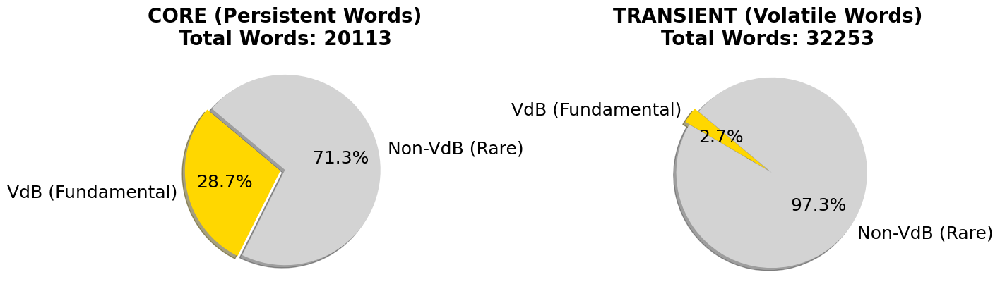


--- RISULTATI PERCENTUALI ---
Core VdB: 5777 (28.7%)
Transient VdB: 870 (2.7%)


In [42]:

# =============================================================================
# 4. VISUALIZZAZIONE (PIE CHARTS)
# =============================================================================

# Colori: Oro per il "Prezioso" VdB, Grigio per il resto
colors = ['#FFD700', '#D3D3D3'] # Gold, LightGray
labels = ['VdB (Fundamental)', 'Non-VdB (Rare)']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# --- PIE CHART 1: CORE ---
data_core = [counts['Core']['VdB'], counts['Core']['Non-VdB']]
ax1.pie(data_core, labels=labels, autopct='%1.1f%%', startangle=140, 
        colors=colors, explode=(0.05, 0), shadow=True, textprops={'fontsize': 18})
ax1.set_title(f"CORE (Persistent Words)\nTotal Words: {len(core_nodes)}", fontsize=20, fontweight='bold')

# --- PIE CHART 2: TRANSIENT ---
data_trans = [counts['Transient']['VdB'], counts['Transient']['Non-VdB']]
# Se nel transient il VdB è molto piccolo, explode sulla fetta piccola per evidenziarla
ax2.pie(data_trans, labels=labels, autopct='%1.1f%%', startangle=140, 
        colors=colors, explode=(0, 0.05), shadow=True, textprops={'fontsize': 18})
ax2.set_title(f"TRANSIENT (Volatile Words)\nTotal Words: {len(transient_nodes)}", fontsize=20, fontweight='bold')

# Titolo Generale
# plt.suptitle("DNA Lessicale: Chi sopravvive e chi passa?", fontsize=16)

plt.tight_layout()
plt.show()

# Stampa di controllo
print("\n--- RISULTATI PERCENTUALI ---")
print(f"Core VdB: {data_core[0]} ({data_core[0]/sum(data_core):.1%})")
print(f"Transient VdB: {data_trans[0]} ({data_trans[0]/sum(data_trans):.1%})")

In [75]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") # o 'networks_paradigmatic', usa la full network
snapshots = range(1, 8)

# Funzione per identificare il VdB (Livelli 0, 1, 2)
def is_vdb(lvl):
    return pd.notnull(lvl) and lvl <= 2

# =============================================================================
# 1. ESTRAZIONE PRESENZE
# =============================================================================
print("--- TRACCIAMENTO PRESENZE PAROLE ---")

# Dizionario: token -> lista di snapshot in cui appare
word_history = {}
# Dizionario: token -> livello demauro
word_levels = {}

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not fpath.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(fpath))
    
    for v in g.vs:
        token = v['token']
        lvl = v['demauro_level']
        
        if token not in word_history:
            word_history[token] = []
            word_levels[token] = lvl
            
        word_history[token].append(snap)

# =============================================================================
# 2. FILTRAGGIO E CLASSIFICAZIONE DELLE TRAIETTORIE
# =============================================================================
data = []

for token, snaps_present in word_history.items():
    lvl = word_levels[token]
    
    # FILTRO: Solo parole VdB e Solo Volatili (non presenti in tutti i 7 snap)
    if is_vdb(lvl) and len(snaps_present) < len(snapshots):
        
        # Creiamo la stringa binaria di presenza (es. '1110000')
        binary_presence = "".join(['1' if s in snaps_present else '0' for s in snapshots])
        n_appearances = len(snaps_present)
        
        # Classificazione Logica
        if n_appearances == 1:
            mechanism = "Single-Shot"
        elif re.fullmatch(r'^1+0+$', binary_presence):
            # Inizia con uno o più 1, finisce con uno o più 0 (Senza buchi)
            mechanism = "Lost"
        elif re.fullmatch(r'^0+1+$', binary_presence):
            # Inizia con uno o più 0, finisce con uno o più 1 (Senza buchi)
            mechanism = "Emergent (Acquired)"
        else:
            # Tutti gli altri casi (buchi in mezzo, es. 1010000 o 0110000)
            mechanism = "Intermittent (Flickering)"
            
        data.append({
            'token': token,
            'demauro_level': lvl,
            'presence_vector': binary_presence,
            'appearances': n_appearances,
            'mechanism': mechanism
        })

df_vdb_volatile = pd.DataFrame(data)


--- TRACCIAMENTO PRESENZE PAROLE ---



Parole VdB Volatili totali trovate: 870

Distribuzione Meccanismi:
mechanism
Intermittent (Flickering)    491
Emergent (Acquired)          166
Single-Shot                  137
Lost                          76
Name: count, dtype: int64


C:\Users\leona\AppData\Local\Temp\ipykernel_20776\144825550.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_vdb_volatile, x='mechanism',


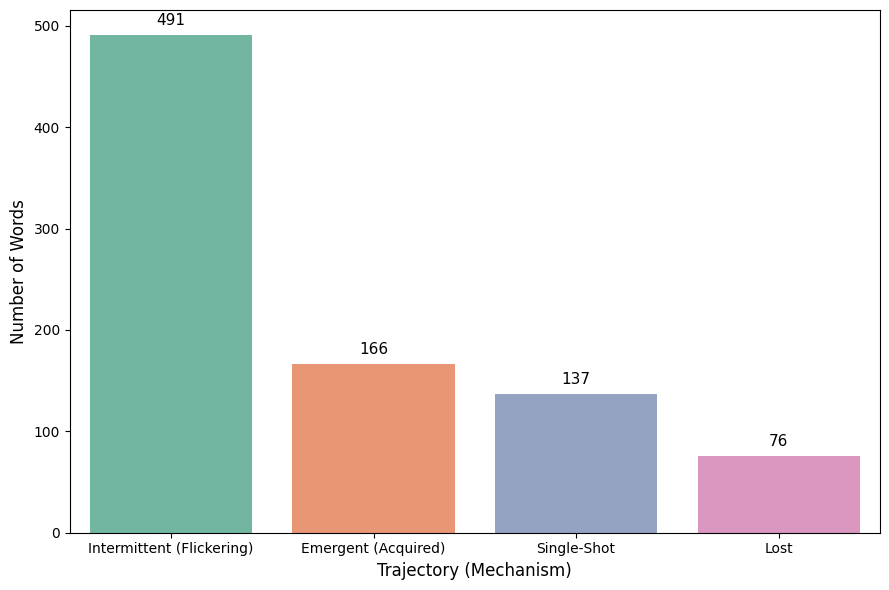


--- ESEMPI DI PAROLE PER OGNI MECCANISMO ---

[Intermittent (Flickering)] (Tot: 491):
fiatare, pastiglia, schiuma, cornacchia, fidanzamento, tazza, tarallo, anatra, cioccolato, gelateria

[Emergent (Acquired)] (Tot: 166):
interagire, goloso, seggiolino, dimagrante, traslocare, maleducazione, coglione, software, oliera, marmellata

[Single-Shot] (Tot: 137):
trapezio, sughero, spazzola, ammaccare, pannolino, grembiule, wafer, indigestione, sopracciglio, pieghevole

[Lost] (Tot: 76):
stereo, stuoia, selvaggina, colorante, motel, mammella, frumento, palombaro, schedario, calamaro


In [87]:

# =============================================================================
# 3. STATISTICHE E VISUALIZZAZIONE
# =============================================================================
print(f"\nParole VdB Volatili totali trovate: {len(df_vdb_volatile)}")

# Conteggi per categoria
counts = df_vdb_volatile['mechanism'].value_counts()
print("\nDistribuzione Meccanismi:")
print(counts)

# Visualizzazione
plt.figure(figsize=(9, 6))
ax = sns.countplot(data=df_vdb_volatile, x='mechanism', 
                   order=counts.index, palette='Set2')

# plt.title("Meccanismi di Volatilità nel Vocabolario di Base (VdB)", fontsize=14)
plt.ylabel("Number of Words", fontsize=12)
plt.xlabel("Trajectory (Mechanism)", fontsize=12)

# Aggiungi etichette sopra le barre
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', fontsize=11, color='black', xytext=(0, 5), 
                textcoords='offset points')

plt.tight_layout()
plt.savefig("vdb_volatility_mechanisms.png", dpi=300)
plt.show()

# =============================================================================
# 4. STAMPA ESEMPI PER LA TESI
# =============================================================================
print("\n--- ESEMPI DI PAROLE PER OGNI MECCANISMO ---")
for mech in counts.index:
    subset = df_vdb_volatile[df_vdb_volatile['mechanism'] == mech]
    # Prendiamo 10 parole a caso come esempio
    examples = subset['token'].sample(min(10, len(subset))).tolist()
    print(f"\n[{mech}] (Tot: {len(subset)}):")
    print(", ".join(examples))
    
    # Se vuoi vedere i vettori di presenza di questi esempi:
    # print(subset[['token', 'presence_vector']].head(10).to_string(index=False))

--- 1. CARICAMENTO GRAFI E IDENTIFICAZIONE CORE ASSOLUTO ---
Dimensione Absolute Core (presenti da Snap 1 a 7): 20113 parole

--- 2. RICERCA DELLE PAROLE ACQUISITE DAL CORE ---
Trovate 6432 parole acquisite stabilmente dal Core.

--- 3. GENERAZIONE GRAFICO ---


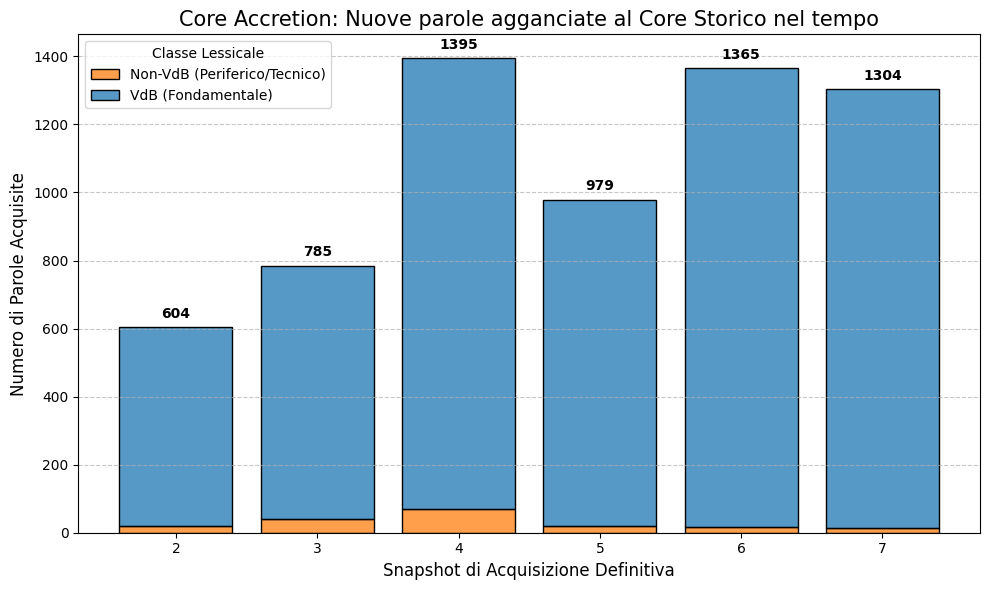


--- ESEMPI DI PAROLE ACQUISITE (Per la Discussione) ---

[Non-VdB (Periferico/Tecnico)] - Totale: 6254
  - vecchione (Snap: 2, Archi verso il Core: 805/1265)
  - contemplazione (Snap: 3, Archi verso il Core: 792/1152)
  - mariangela (Snap: 2, Archi verso il Core: 767/1092)
  - disincantare (Snap: 4, Archi verso il Core: 757/1320)
  - fiabesco (Snap: 3, Archi verso il Core: 708/1070)
  - fascinoso (Snap: 3, Archi verso il Core: 680/1049)
  - immaginifico (Snap: 4, Archi verso il Core: 660/1338)
  - fascinazione (Snap: 5, Archi verso il Core: 654/1331)
  - ammiccamento (Snap: 2, Archi verso il Core: 652/792)
  - cagliamone (Snap: 7, Archi verso il Core: 646/1071)
  - corbello (Snap: 2, Archi verso il Core: 646/974)
  - digressione (Snap: 3, Archi verso il Core: 644/953)
  - autoironia (Snap: 3, Archi verso il Core: 628/942)
  - paradigmatico (Snap: 4, Archi verso il Core: 624/1082)
  - pierfrancesco (Snap: 3, Archi verso il Core: 623/924)

[VdB (Fondamentale)] - Totale: 178
  - pennarel

In [3]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
# Sostituisci con la tua cartella corretta (assicurati che i grafi abbiano demauro_level)
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']

def is_vdb(lvl):
    """Restituisce True se il livello De Mauro indica il Vocabolario di Base (0, 1, 2)"""
    return pd.notnull(lvl) and lvl <= 2

# =============================================================================
# 1. CARICAMENTO E IDENTIFICAZIONE DELL'"ABSOLUTE CORE"
# =============================================================================
print("--- 1. CARICAMENTO GRAFI E IDENTIFICAZIONE CORE ASSOLUTO ---")
graphs = {}
word_presence = {}
word_metadata = {}

for snap in snapshots:
    path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(path))
    graphs[snap] = g
    
    for v in g.vs:
        token = v['token']
        # Inizializza dizionari se la parola è nuova
        if token not in word_presence:
            word_presence[token] = []
            # Salviamo i metadati della prima volta che la vediamo
            word_metadata[token] = {
                'demauro': v['demauro_level']
            }
        word_presence[token].append(snap)

# L'Absolute Core è l'insieme di parole presenti in TUTTI gli snapshot
absolute_core = set(t for t, snaps in word_presence.items() if len(snaps) == len(snapshots))
print(f"Dimensione Absolute Core (presenti da Snap 1 a {len(snapshots)}): {len(absolute_core)} parole")

# =============================================================================
# 2. IDENTIFICAZIONE DEI "NUOVI ACQUISITI" (ACCRETION) E CONNESSIONE AL CORE
# =============================================================================
print("\n--- 2. RICERCA DELLE PAROLE ACQUISITE DAL CORE ---")

acquired_data = []

for token, snaps in word_presence.items():
    # Saltiamo l'Absolute Core e le parole con POS non target
    if token in absolute_core: continue
    
    # Creiamo la stringa binaria di presenza (es. '0001111')
    presence_str = "".join(['1' if s in snaps else '0' for s in snapshots])
    
    # Cerchiamo il pattern "Emergente Persistente": inizia con zeri, poi tutti uno fino alla fine
    if re.fullmatch(r'^0+1+$', presence_str):
        # Troviamo lo snapshot in cui è apparsa per la prima volta e vi è rimasta
        arrival_snap_idx = presence_str.find('1')
        arrival_snap = list(snapshots)[arrival_snap_idx]
        
        # VERIFICA CONNESSIONE: Si è agganciata all'Absolute Core nel momento del suo arrivo?
        g_arrival = graphs[arrival_snap]
        try:
            node_idx = g_arrival.vs.find(token=token).index
            neighbors_idx = g_arrival.neighbors(node_idx)
            neighbors_tokens = [g_arrival.vs[ni]['token'] for ni in neighbors_idx]
            
            # Quanti dei suoi vicini appartengono all'Absolute Core?
            core_neighbors = [nt for nt in neighbors_tokens if nt in absolute_core]
            is_attached_to_core = len(core_neighbors) > 0
            
            if is_attached_to_core:
                lvl = word_metadata[token]['demauro']
                vdb_status = "VdB (Fondamentale)" if is_vdb(lvl) else "Non-VdB (Periferico/Tecnico)"
                
                acquired_data.append({
                    'token': token,
                    'arrival_snapshot': arrival_snap,
                    'vdb_status': vdb_status,
                    'core_connections': len(core_neighbors),
                    'total_degree': len(neighbors_tokens)
                })
        except ValueError:
            pass # Nodo non trovato (non dovrebbe succedere se i dizionari sono allineati)

df_acquired = pd.DataFrame(acquired_data)
print(f"Trovate {len(df_acquired)} parole acquisite stabilmente dal Core.")

# =============================================================================
# 3. VISUALIZZAZIONE DELLA CRESCITA DEL CORE
# =============================================================================
print("\n--- 3. GENERAZIONE GRAFICO ---")

# Raggruppiamo i dati per Snapshot di arrivo e status VdB
growth_stats = df_acquired.groupby(['arrival_snapshot', 'vdb_status']).size().reset_index(name='count')

plt.figure(figsize=(10, 6))

# Grafico a barre impilate (Stacked Bar Chart)
sns.histplot(
    data=df_acquired, 
    x='arrival_snapshot', 
    hue='vdb_status', 
    multiple='stack', 
    palette=['#1f77b4', '#ff7f0e'], # Colori distinti
    discrete=True,
    shrink=0.8
)

plt.title("Core Accretion: Nuove parole agganciate al Core Storico nel tempo", fontsize=15)
plt.xlabel("Snapshot di Acquisizione Definitiva", fontsize=12)
plt.ylabel("Numero di Parole Acquisite", fontsize=12)
plt.xticks(list(snapshots)[1:]) # Partiamo dal 2 perché l'1 è il punto di partenza
plt.legend(title='Classe Lessicale', labels=['Non-VdB (Periferico/Tecnico)', 'VdB (Fondamentale)'])
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Aggiungiamo i totali sopra ogni barra
totals = df_acquired['arrival_snapshot'].value_counts()
for snap, total in totals.items():
    plt.text(snap, total + max(totals)*0.02, str(total), ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

# =============================================================================
# 4. ESTRAZIONE ESEMPI PER LA TESI
# =============================================================================
print("\n--- ESEMPI DI PAROLE ACQUISITE (Per la Discussione) ---")
for vdb_class in df_acquired['vdb_status'].unique():
    subset = df_acquired[df_acquired['vdb_status'] == vdb_class]
    print(f"\n[{vdb_class}] - Totale: {len(subset)}")
    
    # Mostriamo le parole con il maggior numero di connessioni al Core al loro arrivo
    top_examples = subset.sort_values(by='core_connections', ascending=False).head(15)
    
    for _, row in top_examples.iterrows():
        print(f"  - {row['token']} (Snap: {row['arrival_snapshot']}, Archi verso il Core: {row['core_connections']}/{row['total_degree']})")

--- 1. CARICAMENTO GRAFI E IDENTIFICAZIONE CORE ASSOLUTO ---
Dimensione Absolute Core (presenti da Snap 1 a 7): 20113 parole

--- 2. RICERCA DELLE PAROLE ACQUISITE DAL CORE ---
Trovate 5841 parole target acquisite stabilmente dal Core.

--- 3. GENERAZIONE GRAFICO ---


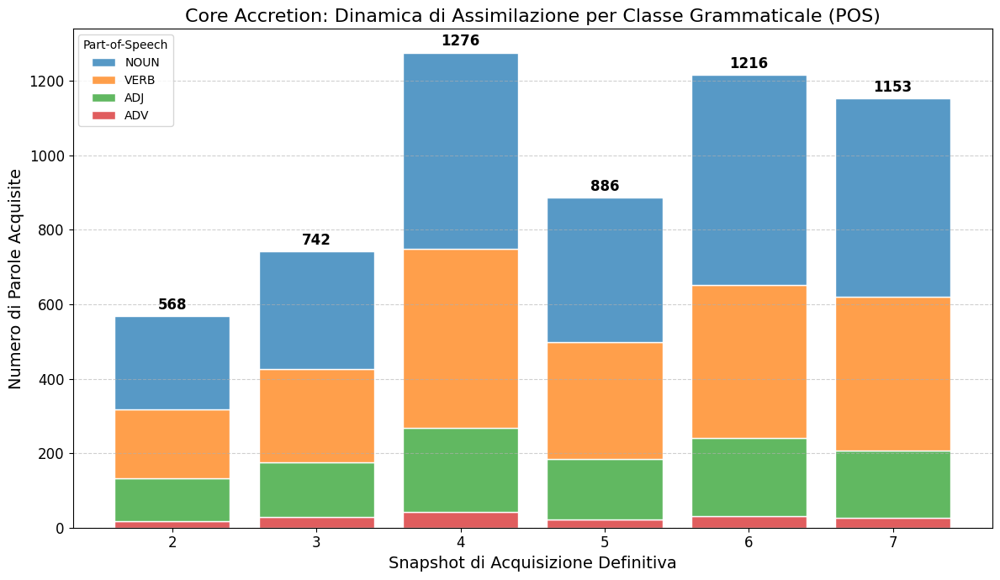


--- ANALISI QUALITATIVA: LE PAROLE PIÙ 'FORTI' PER OGNI POS ---

[NOUN] - Totale Nuove Acquisizioni: 2577
  - vecchione       (Arrivo: Snap 2, Link Core: 433/692 [63%])
  - fascinazione    (Arrivo: Snap 5, Link Core: 403/780 [52%])
  - contemplazione  (Arrivo: Snap 3, Link Core: 393/558 [70%])
  - mariangela      (Arrivo: Snap 2, Link Core: 373/540 [69%])
  - digressione     (Arrivo: Snap 3, Link Core: 355/505 [70%])
  - corbello        (Arrivo: Snap 2, Link Core: 345/529 [65%])
  - globalizzazione (Arrivo: Snap 5, Link Core: 332/525 [63%])
  - cagliamone      (Arrivo: Snap 7, Link Core: 327/555 [59%])
  - mercificazione  (Arrivo: Snap 4, Link Core: 327/579 [56%])
  - ammiccamento    (Arrivo: Snap 2, Link Core: 297/365 [81%])

[VERB] - Totale Nuove Acquisizioni: 2055
  - strapazzare     (Arrivo: Snap 4, Link Core: 385/648 [59%])
  - prenderselare   (Arrivo: Snap 4, Link Core: 384/578 [66%])
  - capiscere       (Arrivo: Snap 5, Link Core: 370/649 [57%])
  - sparpagliare    (Arrivo: Sna

In [ ]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_paradigmatic")  # Modificato per usare le reti paradigmatiche
snapshots = range(1, 8)
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']

# =============================================================================
# 1. CARICAMENTO E IDENTIFICAZIONE DELL'"ABSOLUTE CORE"
# =============================================================================
print("--- 1. CARICAMENTO GRAFI E IDENTIFICAZIONE CORE ASSOLUTO ---")
graphs = {}
word_presence = {}
word_metadata = {}

for snap in snapshots:
    path = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    if not path.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(path))
    graphs[snap] = g
    
    for v in g.vs:
        token = v['token']
        # Inizializza dizionari se la parola è nuova
        if token not in word_presence:
            word_presence[token] = []
            # Salviamo la POS della prima volta che la vediamo
            word_metadata[token] = {
                'pos': v['pos']
            }
        word_presence[token].append(snap)

# L'Absolute Core è l'insieme di parole presenti in TUTTI gli snapshot
absolute_core = set(t for t, snaps in word_presence.items() if len(snaps) == len(snapshots))
print(f"Dimensione Absolute Core (presenti da Snap 1 a {len(snapshots)}): {len(absolute_core)} parole")

# =============================================================================
# 2. IDENTIFICAZIONE DEI "NUOVI ACQUISITI" (ACCRETION) E CONNESSIONE AL CORE
# =============================================================================
print("\n--- 2. RICERCA DELLE PAROLE ACQUISITE DAL CORE ---")

acquired_data = []

for token, snaps in word_presence.items():
    # Saltiamo l'Absolute Core
    if token in absolute_core: continue
    
    pos = word_metadata[token]['pos']
    # Filtriamo solo per le POS che ci interessano
    if pos not in target_pos: continue
    
    # Creiamo la stringa binaria di presenza (es. '0001111')
    presence_str = "".join(['1' if s in snaps else '0' for s in snapshots])
    
    # Cerchiamo il pattern "Emergente Persistente": inizia con zeri, poi tutti uno fino alla fine
    if re.fullmatch(r'^0+1+$', presence_str):
        # Troviamo lo snapshot in cui è apparsa per la prima volta e vi è rimasta
        arrival_snap_idx = presence_str.find('1')
        arrival_snap = list(snapshots)[arrival_snap_idx]
        
        # VERIFICA CONNESSIONE: Si è agganciata all'Absolute Core nel momento del suo arrivo?
        g_arrival = graphs[arrival_snap]
        try:
            node_idx = g_arrival.vs.find(token=token).index
            neighbors_idx = g_arrival.neighbors(node_idx)
            neighbors_tokens = [g_arrival.vs[ni]['token'] for ni in neighbors_idx]
            
            # Quanti dei suoi vicini appartengono all'Absolute Core?
            core_neighbors = [nt for nt in neighbors_tokens if nt in absolute_core]
            is_attached_to_core = len(core_neighbors) > 0
            
            if is_attached_to_core:
                acquired_data.append({
                    'token': token,
                    'pos': pos,
                    'arrival_snapshot': arrival_snap,
                    'core_connections': len(core_neighbors),
                    'total_degree': len(neighbors_tokens)
                })
        except ValueError:
            pass # Nodo non trovato

df_acquired = pd.DataFrame(acquired_data)
print(f"Trovate {len(df_acquired)} parole target acquisite stabilmente dal Core.")

# =============================================================================
# 3. VISUALIZZAZIONE DELLA CRESCITA DEL CORE PER POS
# =============================================================================
print("\n--- 3. GENERAZIONE GRAFICO ---")

plt.figure(figsize=(12, 7))

# Colori per mantenere coerenza visiva con le classiche palette POS
pos_colors = {'NOUN': '#1f77b4', 'VERB': '#ff7f0e', 'ADJ': '#2ca02c', 'ADV': '#d62728'}

# Grafico a barre impilate (Stacked Bar Chart)
ax = sns.histplot(
    data=df_acquired, 
    x='arrival_snapshot', 
    hue='pos', 
    multiple='stack', 
    palette=pos_colors,
    hue_order=target_pos,
    discrete=True,
    shrink=0.8,
    edgecolor="white"
)

plt.title("Core Accretion: Dinamica di Assimilazione per Classe Grammaticale (POS)", fontsize=16)
plt.xlabel("Snapshot di Acquisizione Definitiva", fontsize=14)
plt.ylabel("Numero di Parole Acquisite", fontsize=14)
plt.xticks(list(snapshots)[1:], fontsize=12) # Partiamo dal 2
plt.yticks(fontsize=12)

# Aggiungiamo i totali sopra ogni barra
totals = df_acquired['arrival_snapshot'].value_counts()
for snap, total in totals.items():
    plt.text(snap, total + max(totals)*0.015, str(total), ha='center', fontweight='bold', fontsize=12)

# Sistemiamo la legenda
sns.move_legend(ax, "upper left", title='Part-of-Speech', frameon=True)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

# =============================================================================
# 4. ESTRAZIONE ESEMPI PER LA TESI
# =============================================================================
print("\n--- ANALISI QUALITATIVA: LE PAROLE PIÙ 'FORTI' PER OGNI POS ---")

for pos in target_pos:
    subset = df_acquired[df_acquired['pos'] == pos]
    print(f"\n[{pos}] - Totale Nuove Acquisizioni: {len(subset)}")
    
    if len(subset) == 0:
        continue
        
    # Mostriamo le parole con il maggior numero di connessioni al Core al loro arrivo
    # (Quelle che sono entrate subito "pesantemente" nella struttura semantica)
    top_examples = subset.sort_values(by='core_connections', ascending=False).head(10)
    
    for _, row in top_examples.iterrows():
        # Calcoliamo anche la percentuale di attacco al Core (quanti dei suoi link totali vanno al Core)
        pct_core = (row['core_connections'] / row['total_degree']) * 100 if row['total_degree'] > 0 else 0
        print(f"  - {row['token']:<15} (Arrivo: Snap {row['arrival_snapshot']}, Link Core: {row['core_connections']}/{row['total_degree']} [{pct_core:.0f}%])")

--- 1. CARICAMENTO E IDENTIFICAZIONE DINAMICHE ---
Absolute Core: 20113 nodi. Newcomers target: 5958 nodi.

--- 2. CALCOLO METRICHE DI CONNESSIONE AL CORE ---

--- 3. GENERAZIONE GRAFICI ---


C:\Users\leona\AppData\Local\Temp\ipykernel_13384\1446319485.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_conn, x='pos', y='pai', palette='Set2', ax=axes[0], showfliers=False)


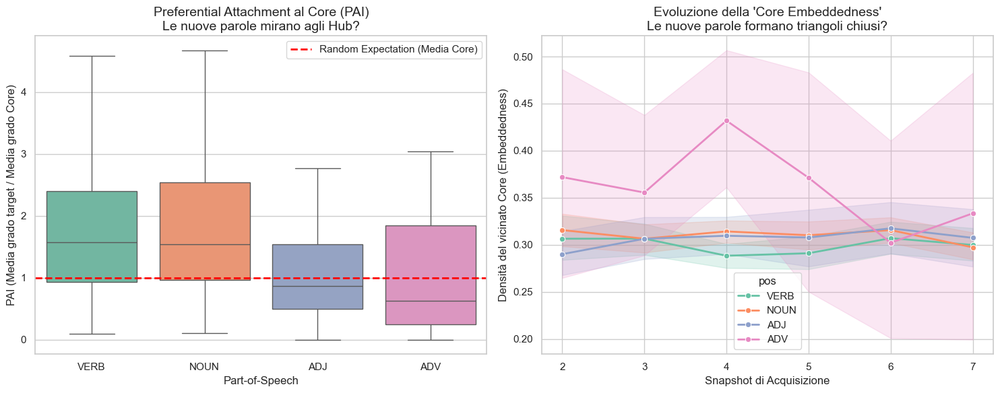


--- RISULTATI QUALITATIVI PER LA TESI ---
Media Globale PAI: 1.61 (Se > 1, c'è Preferential Attachment forte)

Top 5 Parole che si sono attaccate ai più grandi Hub del Core (Alta centralizzazione):
  - litania (POS: NOUN, Arrivo: Snap 3, PAI:  7.03x la media)
  - perla (POS: VERB, Arrivo: Snap 3, PAI:  6.50x la media)
  - figuriamoci (POS: VERB, Arrivo: Snap 5, PAI:  5.10x la media)
  - formicone (POS: NOUN, Arrivo: Snap 3, PAI:  5.03x la media)
  - seppia (POS: NOUN, Arrivo: Snap 3, PAI:  4.67x la media)

Top 5 Parole più 'Embedded' (Entrate in comunità del core molto dense):
  - minimizza (POS: NOUN, Arrivo: Snap 4, Embeddedness: 1.00)
  - diplomazie (POS: ADJ, Arrivo: Snap 6, Embeddedness: 1.00)
  - hobsbawm (POS: VERB, Arrivo: Snap 5, Embeddedness: 1.00)
  - antieroe (POS: NOUN, Arrivo: Snap 4, Embeddedness: 1.00)
  - diminuì (POS: VERB, Arrivo: Snap 6, Embeddedness: 1.00)


In [9]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_paradigmatic")
snapshots = range(1, 8)
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']

# =============================================================================
# 1. CARICAMENTO E IDENTIFICAZIONE CORE & NEWCOMERS
# =============================================================================
print("--- 1. CARICAMENTO E IDENTIFICAZIONE DINAMICHE ---")
graphs = {}
word_presence = {}
word_pos = {}

for snap in snapshots:
    path = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    if not path.exists(): continue
    g = ig.Graph.Read_Pickle(str(path))
    graphs[snap] = g
    for v in g.vs:
        token = v['token']
        if token not in word_presence:
            word_presence[token] = []
            word_pos[token] = v['pos']
        word_presence[token].append(snap)

# Identificazione Absolute Core
absolute_core = set(t for t, snaps in word_presence.items() if len(snaps) == len(snapshots))

# Identificazione Newcomers (Parole acquisite stabilmente)
newcomers = {} # token -> arrival_snapshot
for token, snaps in word_presence.items():
    if token in absolute_core or word_pos[token] not in target_pos: continue
    presence_str = "".join(['1' if s in snaps else '0' for s in snapshots])
    if re.fullmatch(r'^0+1+$', presence_str):
        arrival_snap = list(snapshots)[presence_str.find('1')]
        newcomers[token] = arrival_snap

print(f"Absolute Core: {len(absolute_core)} nodi. Newcomers target: {len(newcomers)} nodi.")

# =============================================================================
# 2. ANALISI CONNETTIVITÀ AL MOMENTO DELL'INGRESSO
# =============================================================================
print("\n--- 2. CALCOLO METRICHE DI CONNESSIONE AL CORE ---")

# Pre-calcoliamo i sottografi del Core per ogni snapshot per velocizzare
core_subgraphs = {}
for snap in snapshots:
    if snap not in graphs: continue
    g = graphs[snap]
    core_nodes_in_g = [v.index for v in g.vs if v['token'] in absolute_core]
    core_subgraphs[snap] = g.subgraph(core_nodes_in_g)

connectivity_data = []

for token, arrival_snap in newcomers.items():
    g_arr = graphs[arrival_snap]
    g_core = core_subgraphs[arrival_snap]
    
    try:
        idx_in_arr = g_arr.vs.find(token=token).index
        neighbors_idx = g_arr.neighbors(idx_in_arr)
        
        # Filtriamo solo i vicini che appartengono all'Absolute Core
        core_neighbors_tokens = [g_arr.vs[ni]['token'] for ni in neighbors_idx if g_arr.vs[ni]['token'] in absolute_core]
        
        if len(core_neighbors_tokens) > 0:
            # A. PREFERENTIAL ATTACHMENT INDEX (PAI)
            # Grado medio di tutti i nodi nel Core allo snapshot corrente
            mean_core_degree = np.mean(g_core.degree())
            
            # Grado medio (all'interno del core) dei nodi a cui il newcomer si è attaccato
            target_nodes_idx = [g_core.vs.find(token=t).index for t in core_neighbors_tokens]
            mean_target_degree = np.mean(g_core.degree(target_nodes_idx))
            
            # PAI > 1: Si attacca a nodi più famosi della media (Preferential Attachment)
            pai = mean_target_degree / mean_core_degree if mean_core_degree > 0 else 0
            
            # B. CORE EMBEDDEDNESS (Local Clustering sui soli nodi del core)
            # Quanti triangoli chiude il newcomer con le parole storiche?
            if len(target_nodes_idx) > 1:
                sub_target = g_core.subgraph(target_nodes_idx)
                actual_edges = sub_target.ecount()
                possible_edges = len(target_nodes_idx) * (len(target_nodes_idx) - 1) / 2
                embeddedness = actual_edges / possible_edges if possible_edges > 0 else 0
            else:
                embeddedness = 0.0 # Se ha un solo vicino nel core, non può chiudere triangoli
            
            connectivity_data.append({
                'token': token,
                'pos': word_pos[token],
                'arrival_snapshot': arrival_snap,
                'core_degree': len(core_neighbors_tokens),
                'pai': pai,
                'embeddedness': embeddedness
            })
    except ValueError:
        pass # Nodo non trovato per qualche disallineamento

df_conn = pd.DataFrame(connectivity_data)
# Rimuoviamo chi si collega a 1 solo nodo core (non fa statistica per l'embeddedness)
df_conn = df_conn[df_conn['core_degree'] > 1]

# =============================================================================
# 3. VISUALIZZAZIONE
# =============================================================================
print("\n--- 3. GENERAZIONE GRAFICI ---")
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# GRAFICO A: Preferential Attachment (Boxplot per POS)
sns.boxplot(data=df_conn, x='pos', y='pai', palette='Set2', ax=axes[0], showfliers=False)
axes[0].axhline(1.0, color='red', linestyle='--', linewidth=2, label="Random Expectation (Media Core)")
axes[0].set_title("Preferential Attachment al Core (PAI)\nLe nuove parole mirano agli Hub?", fontsize=14)
axes[0].set_ylabel("PAI (Media grado target / Media grado Core)", fontsize=12)
axes[0].set_xlabel("Part-of-Speech", fontsize=12)
axes[0].legend()

# GRAFICO B: Core Embeddedness nel tempo
# Raggruppiamo l'embeddedness media per snapshot di arrivo
sns.lineplot(data=df_conn, x='arrival_snapshot', y='embeddedness', hue='pos', 
             marker='o', palette='Set2', linewidth=2, ax=axes[1])
axes[1].set_title("Evoluzione della 'Core Embeddedness'\nLe nuove parole formano triangoli chiusi?", fontsize=14)
axes[1].set_ylabel("Densità del vicinato Core (Embeddedness)", fontsize=12)
axes[1].set_xlabel("Snapshot di Acquisizione", fontsize=12)

plt.tight_layout()
plt.savefig("core_connectivity_arrival.png", dpi=300)
plt.show()

# =============================================================================
# 4. STATISTICHE PER LA TESI
# =============================================================================
print("\n--- RISULTATI QUALITATIVI PER LA TESI ---")
print(f"Media Globale PAI: {df_conn['pai'].mean():.2f} (Se > 1, c'è Preferential Attachment forte)")

# Esempi di parole entrate puntando direttamente ai massimi HUB (PAI altissimo)
print("\nTop 5 Parole che si sono attaccate ai più grandi Hub del Core (Alta centralizzazione):")
top_pai = df_conn.sort_values(by='pai', ascending=False).head(5)
for _, row in top_pai.iterrows():
    print(f"  - {row['token']} (POS: {row['pos']}, Arrivo: Snap {row['arrival_snapshot']}, PAI: {row['pai']: .2f}x la media)")

# Esempi di parole altamente 'Embedded' (Entrate in nicchie molto coese)
print("\nTop 5 Parole più 'Embedded' (Entrate in comunità del core molto dense):")
top_emb = df_conn.sort_values(by='embeddedness', ascending=False).head(5)
for _, row in top_emb.iterrows():
    print(f"  - {row['token']} (POS: {row['pos']}, Arrivo: Snap {row['arrival_snapshot']}, Embeddedness: {row['embeddedness']:.2f})")


### 3.5) Analyzing simple words' centrality across time

In [ ]:
from scipy.stats import spearmanr

# Configurazione
input_dir = Path("networks_hybrid_annotated") # Cartella coi grafi annotati
files = sorted([f for f in os.listdir(input_dir) if "snap" in f])

results = []

print("Inizio analisi correlazione Complessità-Centralità...")

for file in files:
    # 1. Estrazione anno
    try:
        year = int(file.split("_")[1].replace("snap", ""))
    except:
        continue
        
    # 2. Caricamento Grafo
    path = input_dir / file
    G = ig.Graph.Read_Pickle(str(path))
    num_nodes = G.vcount()
    
    if num_nodes == 0: continue

    # 3. Estrazione Metriche di Centralità
    # Strength = Weighted Degree (Somma dei pesi degli archi incidenti)
    strength = np.array(G.strength())
    
    # Normalizziamo la strength per rendere confrontabili anni con n. nodi diversi
    # (diviso N-1)
    norm_strength = strength / (num_nodes - 1)
    # importanza locale (degree) è più veloce da calcolare, ma PageRank ci dà un'idea di importanza globale nel flusso informativo del grafo, considerando anche i vicini dei vicini. Vale la pena testare entrambi e vedere se le correlazioni con la complessità cambiano.

    # PageRank (Importanza globale nel flusso informativo)
    pagerank = np.array(G.pagerank())

    # Betweenness (Importanza come ponte tra comunità)
    #betweenness = np.array(G.betweenness(cutoff=4))


    # 4. Estrazione Attributi di Complessità (già calcolati prima)
    # Recuperiamo le liste dagli attributi del grafo
    demauro_vals = np.array(G.vs['demauro_level']) # 0=FO, 1=AU, 2=AD, 3=Altro
    idf_vals = np.array(G.vs['idf'])               # Basso=Generico, Alto=Specifico
    char_len_vals = np.array(G.vs['char_len']) # Alto=Complesso, Basso=Semplice
    
    # --- ANALISI A: CORRELAZIONI (Spearman) ---
    # Usiamo Spearman perché le variabili non sono necessariamente distribuite normalmente
    
    # Ipotesi: Più alto DeMauro (3=Complesso), più bassa Centralità -> Corr Negativa

    
    # Ipotesi: Più alto IDF (Specifico), più bassa Centralità -> Corr Negativa
    corr_idf_deg, _ = spearmanr(idf_vals, norm_strength)

    # Ipotesi: Più lunga la parola (in caratteri), più bassa Centralità -> Corr Negativa
    corr_len_deg, _ = spearmanr(char_len_vals, norm_strength)

    # Ipotesi: Più lunga la parola (in sillabe), più bassa Centralità -> Corr Negativa
    syl_len_vals = np.array(G.vs['syll_len']) # Alto=Complesso, Basso=Semplice
    corr_syl_deg, _ = spearmanr(syl_len_vals, norm_strength)
    
    # --- ANALISI B: MEDIE PER GRUPPO (Il Gap) ---
    # Creiamo una maschera per parole "Semplici" (Fondamentali - 0) vs "Complesse" (Altro - 3)
    mask_simple = (demauro_vals == 0) | (demauro_vals == 1) | (demauro_vals == 2) # FO
    mask_complex = (demauro_vals == 3) # Altro/Non in dizionario
    
    avg_cent_simple = np.mean(norm_strength[mask_simple]) if np.any(mask_simple) else 0
    avg_cent_complex = np.mean(norm_strength[mask_complex]) if np.any(mask_complex) else 0
    
    # Calcoliamo il ratio (quanto le semplici sono più centrali delle complesse)
    ratio_simple_complex = avg_cent_simple / avg_cent_complex if avg_cent_complex > 0 else 0

    results.append({
        "year": year
        "corr_idf_centrality": corr_idf_deg,
        "avg_centrality_simple": avg_cent_simple, # Quanto in media le parole "semplici" sono centrali
        "avg_centrality_complex": avg_cent_complex, # Quanto in media le parole "complesse" (Altro) sono centrali
        "dominance_ratio": ratio_simple_complex, # Se >1, le parole semplici sono più centrali; se <1, le parole complesse sono più centrali
        "corr_length_centrality": corr_len_deg, # Correlazione tra lunghezza in caratteri e centralità
        "corr_syllable_length_centrality": corr_syl_deg # Correlazione tra lunghezza in sillabe e centralità
    })


Inizio analisi correlazione Complessità-Centralità...


In [3]:
df_trends = pd.DataFrame(results).sort_values("year")

print("\n--- RISULTATI ANALISI ---")
print(df_trends)



--- RISULTATI ANALISI ---
   year  corr_demauro_centrality  corr_idf_centrality  avg_centrality_simple  \
0     1                 0.077032             0.010516               0.003883   
1     2                 0.048099             0.004127               0.004412   
2     3                 0.045278             0.045078               0.004357   
3     4                -0.006538            -0.000778               0.004982   
4     5                 0.003191             0.010777               0.004889   
5     6                 0.043582             0.082757               0.004393   
6     7                 0.044528             0.050208               0.004384   

   avg_centrality_complex  dominance_ratio  corr_length_centrality  \
0                0.005279         0.735537                0.219715   
1                0.005235         0.842800                0.261078   
2                0.005071         0.859234                0.293144   
3                0.005103         0.976337          

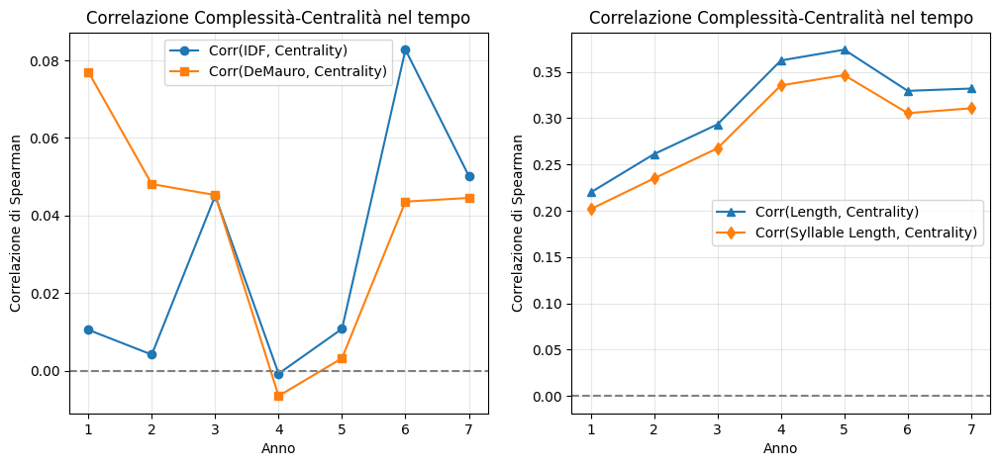

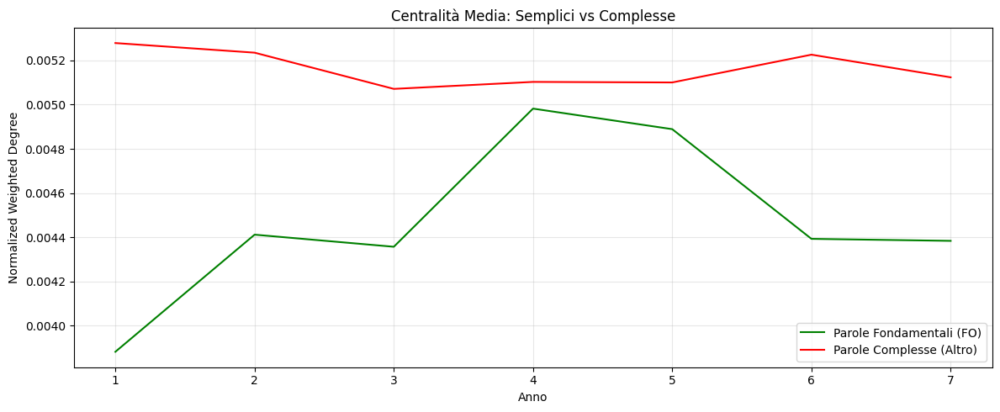

In [ ]:
# --- VISUALIZZAZIONE ---
plt.figure(figsize=(12, 5))

# Plot 1: Evoluzione delle Correlazioni
plt.subplot(1, 2, 1)
plt.plot(df_trends['year'], df_trends['corr_idf_centrality'], marker='o', label="Corr(IDF, Centrality)")
plt.title("Correlazione Complessità-Centralità nel tempo")
plt.xlabel("Anno")
plt.ylabel("Correlazione di Spearman")
plt.axhline(0, color='grey', linestyle='--')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Gap Semplici vs Complesse
plt.subplot(1, 2, 2)
plt.plot(df_trends['year'], df_trends['corr_length_centrality'], marker='^', label="Corr(Length, Centrality)")
plt.plot(df_trends['year'], df_trends['corr_syllable_length_centrality'], marker='d', label="Corr(Syllable Length, Centrality)")
plt.title("Correlazione Complessità-Centralità nel tempo")
plt.xlabel("Anno")
plt.ylabel("Correlazione di Spearman")
plt.axhline(0, color='grey', linestyle='--')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 3: Il Gap Semplici vs Complesse
plt.figure(figsize=(12, 5))
plt.plot(df_trends['year'], df_trends['avg_centrality_simple'], color='green', label="Parole Fondamentali (FO)")
plt.plot(df_trends['year'], df_trends['avg_centrality_complex'], color='red', label="Parole Complesse (Altro)")
plt.title("Centralità Media: Semplici vs Complesse")
plt.xlabel("Anno")
plt.ylabel("Normalized Weighted Degree")
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Salva dati
df_trends.to_csv("centrality_complexity_trends.csv", index=False)

In [13]:
# centralità media per parole semplici vs complesse


# Convertiamo i risultati in un DataFrame per analisi più comode
df_results = pd.DataFrame(results)

# Visualizziamo le medie di centralità per gruppi semplici e complessi
print("Medie di PageRank per gruppi:")
print(df_results['avg_centrality_simple'].mean())
print(df_results['avg_centrality_complex'].mean())

Medie di PageRank per gruppi:
2.9030030055639392e-05
3.1115580227049034e-05


In [ ]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

# Mappatura De Mauro
def get_category(lvl):
    if lvl is None: return "Altro/Unknown"
    if lvl <= 2: return "Vocabolario di Base (VdB)"
    return "Altro/Avanzato"

# --- Funzione helper per la Betweenness ---
def calc_weighted_betweenness(g, cutoff=2):
    """
    Calcola la betweenness considerando i pesi come 'forza' semantica.
    Poiché igraph intende i pesi come 'distanza/costo', dobbiamo invertirli:
    Distance = 1 / Weight.
    """
    if 'weight' in g.es.attributes():
        # Invertiamo i pesi.
        # Se peso è 0 o molto piccolo, la distanza è "infinita" (o molto grande).
        # Qui gestiamo w > 0.
        dists = [1.0/w if w > 1e-9 else 0 for w in g.es['weight']]
        return g.betweenness(weights=dists, cutoff=cutoff)
    else:
        # Fallback se non ci sono pesi
        return g.betweenness(cutoff=cutoff)

# Metriche da calcolare
metrics_config = {
    'Weighted Degree': lambda g: g.strength(weights='weight'),
    'PageRank': lambda g: g.pagerank(weights='weight'),
    # Aggiunta Betweenness con cutoff e pesi invertiti
    'Betweenness': lambda g: calc_weighted_betweenness(g, cutoff=2)
}


In [7]:

# =============================================================================
# CALCOLO CENTRALITÀ E ESTRAZIONE TOP 10
# =============================================================================
results = []
print("--- ANALISI TOP 50 CENTRALITÀ ---")

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not fpath.exists(): continue
    
    # Caricamento grafo
    g = ig.Graph.Read_Pickle(str(fpath))
    names = g.vs['token']
    dm_levels = g.vs['demauro_level']
    
    print(f"Snap {snap}: Calcolo metriche...")
    
    for metric_name, metric_func in metrics_config.items():
        # 1. Calcola valori
        try:
            values = metric_func(g)
        except Exception as e:
            print(f"Errore calcolo {metric_name} su snap {snap}: {e}")
            continue
        
        # 2. Trova indici Top 50
        # argsort ordina crescente, prendiamo gli ultimi 50 e invertiamo
        top_indices = np.argsort(values)[-50:][::-1]
        
        # 3. Analizza composizione
        for rank, idx in enumerate(top_indices, 1):
            token = names[idx]
            lvl = dm_levels[idx]
            cat = get_category(lvl)
            val = values[idx]
            
            results.append({
                'snapshot': snap,
                'metric': metric_name,
                'rank': rank,
                'token': token,
                'demauro_category': cat,
                'raw_level': lvl
            })

df_top = pd.DataFrame(results)


--- ANALISI TOP 50 CENTRALITÀ ---
Snap 1: Calcolo metriche...
Snap 2: Calcolo metriche...
Snap 3: Calcolo metriche...
Snap 4: Calcolo metriche...
Snap 5: Calcolo metriche...
Snap 6: Calcolo metriche...
Snap 7: Calcolo metriche...


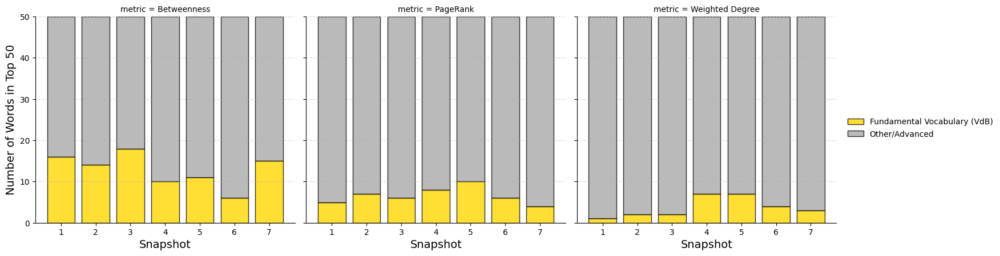


--- ESEMPIO: TOP 5 PAROLE PER BETWEENNESS (SNAP 1 vs SNAP 7) ---

Snapshot 1:
  1. ninna (Altro/Avanzato)
  2. tenuta (Vocabolario di Base (VdB))
  3. scibile (Altro/Avanzato)
  4. lince (Altro/Avanzato)
  5. giosuè (Altro/Avanzato)
  6. immaturo (Vocabolario di Base (VdB))
  7. personalità (Vocabolario di Base (VdB))
  8. pazzesco (Vocabolario di Base (VdB))
  9. arvier (Altro/Avanzato)
  10. bernini (Altro/Avanzato)
  11. lita (Altro/Avanzato)
  12. incantare (Vocabolario di Base (VdB))
  13. regressione (Altro/Avanzato)
  14. martinello (Altro/Avanzato)
  15. reare (Altro/Avanzato)
  16. tentorio (Altro/Avanzato)
  17. elegia (Altro/Avanzato)
  18. confitta (Altro/Avanzato)
  19. intercorrente (Altro/Avanzato)
  20. involucro (Altro/Avanzato)

Snapshot 7:
  1. omogeneo (Altro/Avanzato)
  2. word (Altro/Avanzato)
  3. matere (Altro/Avanzato)
  4. nerazzurra (Altro/Avanzato)
  5. oscene (Altro/Avanzato)
  6. strappo (Altro/Avanzato)
  7. pcr (Altro/Avanzato)
  8. affollare (Vocabolar

In [54]:

# =============================================================================
# VISUALIZZAZIONE COMPOSIZIONE (STACKED BAR)
# =============================================================================

if not df_top.empty:
    # Aggreghiamo: Per ogni Snap e Metrica, contiamo quanti VdB vs Altro
    df_agg = df_top.groupby(['snapshot', 'metric', 'demauro_category']).size().reset_index(name='count')

    # Pivot per il plotting
    df_pivot = df_agg.pivot_table(index=['snapshot', 'metric'], 
                                  columns='demauro_category', 
                                  values='count', fill_value=0).reset_index()

    # Assicuriamoci che le colonne esistano per evitare errori nel plot
    if "Vocabolario di Base (VdB)" not in df_pivot.columns: df_pivot["Vocabolario di Base (VdB)"] = 0
    if "Altro/Avanzato" not in df_pivot.columns: df_pivot["Altro/Avanzato"] = 0

    # Setup Plot
    g = sns.FacetGrid(df_pivot, col="metric", height=5, aspect=1)


    def stacked_plot(data, **kws):
        ax = plt.gca()
        snapshots = data['snapshot'].unique()
        
        # Dati
        vdb = data["Vocabolario di Base (VdB)"]
        other = data["Altro/Avanzato"]
        # percentuali sopra le due diverse barre
        total = vdb + other
        vdb_perc = (vdb / total) * 100
        other_perc = (other / total) * 100

        # Barre VdB (Sotto)
        ax.bar(snapshots, vdb, label="Fundamental Vocabulary (VdB)", color="#FFD700", edgecolor='black', alpha=0.8)
        
        ax.bar(snapshots, other, bottom=vdb, label="Other/Advanced", color="#A9A9A9", edgecolor='black', alpha=0.8)
        
        
        
        ax.set_ylim(0, 50) # Fisso a 10 perché sono Top 10
        ax.set_ylabel("Number of Words in Top 50", fontsize=14)
        ax.set_xlabel("Snapshot", fontsize=14)
        ax.grid(axis='y', linestyle='--', alpha=0.5)

    g.map_dataframe(stacked_plot)
    g.add_legend()
    # Titolo corretto
    plt.subplots_adjust(top=0.85)
    # g.figure.suptitle("Evolution of Semantic Composition in Top 50 Words", fontsize=16)

    plt.show()

    # =============================================================================
    # STAMPA LE PAROLE TOP PER CURIOSITÀ
    # =============================================================================
    print("\n--- ESEMPIO: TOP 5 PAROLE PER BETWEENNESS (SNAP 1 vs SNAP 7) ---")
    if 'Betweenness' in df_top['metric'].unique():
        for snap in [1, 7]:
            print(f"\nSnapshot {snap}:")
            subset = df_top[(df_top['snapshot'] == snap) & (df_top['metric'] == 'Betweenness')].head(20)
            for _, row in subset.iterrows():
                print(f"  {row['rank']}. {row['token']} ({row['demauro_category']})")
else:
    print("Nessun risultato trovato. Verifica i percorsi dei file.")

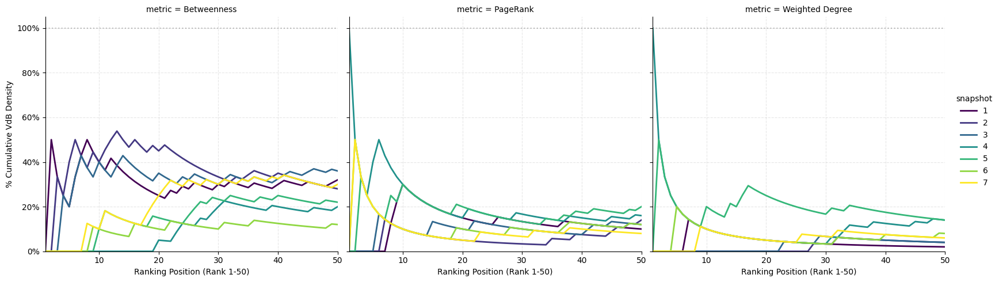


--- ANALISI DENSITÀ VdB NELLA TOP 10 vs TOP 50 ---
                          Density @ Top 10  Density @ Top 50
metric          snapshot                                    
Betweenness     1                      0.4              0.32
                2                      0.4              0.28
                3                      0.4              0.36
                4                      0.0              0.20
                5                      0.1              0.22
                6                      0.1              0.12
                7                      0.1              0.30
PageRank        1                      0.3              0.10
                2                      0.1              0.14
                3                      0.1              0.12
                4                      0.3              0.16
                5                      0.3              0.20
                6                      0.1              0.12
                7                

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# =============================================================================
# 1. PREPARAZIONE DATI (Lavoriamo su df_top esistente)
# =============================================================================

# Definiamo chi è VdB (Livelli 0, 1, 2)
# Gestiamo eventuali NaN con fillna o check esplicito
df_top['is_vdb'] = df_top['raw_level'].apply(lambda x: 1 if (pd.notnull(x) and x <= 2) else 0)

# Ordiniamo per sicurezza (Snapshot -> Metrica -> Rank)
df_top = df_top.sort_values(by=['snapshot', 'metric', 'rank'])

# Calcolo della Cumulata per gruppo
# Raggruppiamo per Snapshot e Metrica e calcoliamo la somma cumulativa della colonna 'is_vdb'
df_top['cumulative_vdb_count'] = df_top.groupby(['snapshot', 'metric'])['is_vdb'].cumsum()

# Calcolo della Densità al Rango K (Lift)
# Esempio: Al rango 10, se ho trovato 8 parole VdB, la densità è 0.8 (80%)
df_top['vdb_density_at_k'] = df_top['cumulative_vdb_count'] / df_top['rank']

# =============================================================================
# 2. VISUALIZZAZIONE (FacetGrid)
# =============================================================================

# Usiamo "relplot" che è ottimo per creare griglie di grafici a linee
g = sns.relplot(
    data=df_top,
    x="rank", 
    y="vdb_density_at_k",
    hue="snapshot",      # Colore diverso per ogni periodo
    col="metric",        # Una colonna per ogni metrica (Degree, PageRank, Betweenness)
    kind="line",         # Grafico a linee
    palette="viridis",   # Palette sequenziale (dal blu al giallo)
    linewidth=2,
    height=5, 
    aspect=1.1
)

# =============================================================================
# 3. RIFINITURE ESTETICHE
# =============================================================================

# Linea di riferimento al 100% (Se tutte fossero VdB)
for ax in g.axes.flat:
    ax.axhline(1.0, color='gray', linestyle=':', alpha=0.5)
    ax.set_ylim(0, 1.05) # Asse Y da 0% a 100%
    ax.set_xlim(1, 50)   # Asse X da Rank 1 a 50
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # Formattazione asse Y in percentuale
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0%}'))

# Titoli e Etichette
g.set_axis_labels("Ranking Position (Rank 1-50)", "% Cumulative VdB Density")
#g.fig.suptitle("Cumulative VdB Density Across Snapshots and Metrics", y=1.05, fontsize=16)

plt.show()

# =============================================================================
# 4. ANALISI PUNTUALE (Esempio numerico per il testo)
# =============================================================================
print("\n--- ANALISI DENSITÀ VdB NELLA TOP 10 vs TOP 50 ---")
summary = df_top[df_top['rank'].isin([10, 50])].pivot_table(
    index=['metric', 'snapshot'], 
    columns='rank', 
    values='vdb_density_at_k'
)
# Rinomina colonne per chiarezza
summary.columns = ['Density @ Top 10', 'Density @ Top 50']
print(summary)

In [ ]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") # Cartella coi grafi annotati
snapshots = range(1, 8)

# =============================================================================
# 1. CARICAMENTO GRAFI E IDENTIFICAZIONE CORE NODES
# =============================================================================
print("--- 1. CARICAMENTO E IDENTIFICAZIONE CORE ---")
graphs = {}
for snap in snapshots:
    path = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not path.exists():
        raise FileNotFoundError(f"File {path} non trovato.")
    graphs[snap] = ig.Graph.Read_Pickle(str(path))

# Identificazione Nodi Persistenti (Core)
core_nodes = set(graphs[1].vs['token'])
for snap in range(2, 8):
    core_nodes &= set(graphs[snap].vs['token'])

print(f"Nodi nel Core Persistente: {len(core_nodes)}")

# =============================================================================
# 2. CALCOLO EDGE BETWEENNESS E CONCENTRAZIONE
# =============================================================================
print("\n--- 2. CALCOLO TRAFFICO SUI CAMMINI MINIMI (Edge Betweenness) ---")
print("Nota: Il calcolo della Edge Betweenness può richiedere qualche minuto per snapshot.")

results = []

for snap in snapshots:
    g = graphs[snap]
    tokens = g.vs['token']
    
    print(f" Elaborazione Snapshot {snap}...")
    
    # Calcolo Edge Betweenness su tutto il grafo (pesata se hai i pesi, altrimenti topologica)
    # Se la tua rete ha pesi che indicano distanza, usa weights='weight'
    # Se i pesi indicano forza/somiglianza, devi invertirli (es. 1/weight) o non usarli.
    # Assumiamo topologica per misurare i salti netti:
    dists = [1.0/w if w > 1e-9 else 0 for w in g.es['weight']]
    eb = g.edge_betweenness(weights=dists, cutoff=4) # Consideriamo solo cammini minimi fino a lunghezza 2 per focalizzarci su traffico locale
    
    total_eb = sum(eb)
    total_edges = g.ecount()
    
    core_eb_sum = 0
    core_edges_count = 0
    
    # Iteriamo su tutti gli archi per vedere se appartengono al Core
    for edge in g.es:
        source_token = tokens[edge.source]
        target_token = tokens[edge.target]
        
        # Un arco è "Core" se ENTRAMBI i nodi che collega sono nel Core
        if source_token in core_nodes and target_token in core_nodes:
            core_eb_sum += eb[edge.index]
            core_edges_count += 1
            
    # Calcolo Percentuali
    pct_core_eb = (core_eb_sum / total_eb) * 100 if total_eb > 0 else 0
    pct_core_edges = (core_edges_count / total_edges) * 100 if total_edges > 0 else 0
    
    # "Lift" strutturale: Quanto il core over-performa rispetto alle sue dimensioni?
    # Se ha il 10% degli archi ma il 50% del traffico, il Lift è 5.0.
    lift = pct_core_eb / pct_core_edges if pct_core_edges > 0 else 0
    
    results.append({
        'Snapshot': snap,
        'Pct_Core_Edges': pct_core_edges,
        'Pct_Core_Betweenness': pct_core_eb,
        'Structural_Lift': lift
    })

df_res = pd.DataFrame(results)


--- 1. CARICAMENTO E IDENTIFICAZIONE CORE ---



--- 3. GENERAZIONE GRAFICI ---


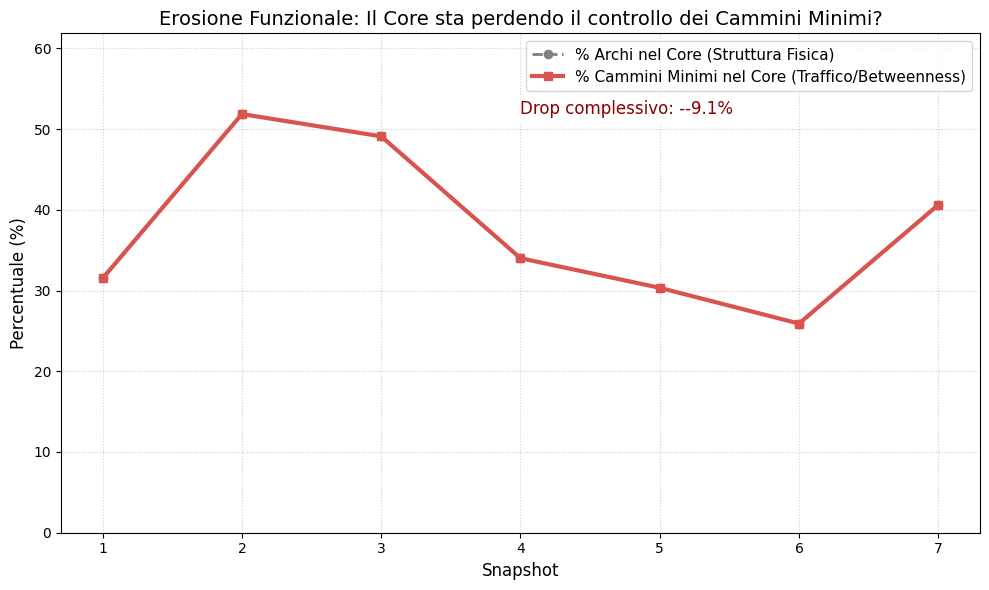


--- DATI PER TABELLA TESI ---
 Snapshot  Pct_Core_Edges  Pct_Core_Betweenness  Structural_Lift
        1           31.52                 31.52              1.0
        2           51.85                 51.85              1.0
        3           49.10                 49.10              1.0
        4           34.00                 34.00              1.0
        5           30.34                 30.34              1.0
        6           25.90                 25.90              1.0
        7           40.60                 40.60              1.0


In [2]:

# =============================================================================
# 3. VISUALIZZAZIONE
# =============================================================================
print("\n--- 3. GENERAZIONE GRAFICI ---")

plt.figure(figsize=(10, 6))

# Plot della percentuale di Archi nel Core (Baseline Demografica)
plt.plot(df_res['Snapshot'], df_res['Pct_Core_Edges'], 
         label='% Archi nel Core (Struttura Fisica)', 
         color='gray', linestyle='--', marker='o', linewidth=2)

# Plot della percentuale di Betweenness nel Core (Traffico Funzionale)
plt.plot(df_res['Snapshot'], df_res['Pct_Core_Betweenness'], 
         label='% Cammini Minimi nel Core (Traffico/Betweenness)', 
         color='#D9534F', marker='s', linewidth=3)

# Formattazione
plt.title("Erosione Funzionale: Il Core sta perdendo il controllo dei Cammini Minimi?", fontsize=14)
plt.xlabel("Snapshot", fontsize=12)
plt.ylabel("Percentuale (%)", fontsize=12)
plt.ylim(0, max(df_res['Pct_Core_Betweenness'].max(), df_res['Pct_Core_Edges'].max()) + 10)
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend(fontsize=11)

# Annotiamo il grafico con la perdita percentuale tra Snap 1 e 7
drop = df_res.iloc[0]['Pct_Core_Betweenness'] - df_res.iloc[-1]['Pct_Core_Betweenness']
plt.text(df_res['Snapshot'].mean(), df_res['Pct_Core_Betweenness'].max(), 
         f"Drop complessivo: -{drop:.1f}%", 
         color='darkred', fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

plt.tight_layout()
plt.savefig("core_betweenness_erosion.png", dpi=300)
plt.show()

# Stampa i dati precisi per la tesi
print("\n--- DATI PER TABELLA TESI ---")
print(df_res.round(2).to_string(index=False))

In [66]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

# =============================================================================
# 1. IDENTIFICAZIONE CORE (PERSISTENTI)
# =============================================================================
print("--- IDENTIFICAZIONE PAROLE PERSISTENTI ---")
core_nodes = None

# Prima passata per trovare l'intersezione (Core)
for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not fpath.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(fpath))
    nodes = set(g.vs['token'])
    
    if core_nodes is None:
        core_nodes = nodes
    else:
        core_nodes = core_nodes.intersection(nodes)

print(f"Parole Core (Persistenti): {len(core_nodes)}")

# =============================================================================
# 2. ESTRAZIONE FREQUENZE
# =============================================================================
results = []
print("--- ESTRAZIONE FREQUENZE MEDIE ---")

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_hybrid.igp"
    if not fpath.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(fpath))
    
    # Controlla se l'attributo 'freq' esiste
    if 'freq' not in g.vs.attributes():
        print(f"Snap {snap}: Attributo 'freq' mancante!")
        continue
    
    # Liste per accumulare le frequenze
    freqs_core = []
    freqs_dynamic = []
    
    for v in g.vs:
        token = v['token']
        freq = v['freq']
        
        # Filtro sicurezza: a volte freq può essere None o stringa
        if freq is None: continue
        try:
            freq = float(freq)
        except:
            continue
            
        if token in core_nodes:
            freqs_core.append(freq)
        else:
            freqs_dynamic.append(freq)
    
    # Calcolo Medie
    # Nota: Le frequenze spesso seguono una legge di potenza (Zipf). 
    # La media aritmetica può essere distorta dagli outlier altissimi (le, di, il).
    # Calcoliamo sia Media che Mediana per robustezza.
    
    if freqs_core:
        avg_core = np.mean(freqs_core)
        med_core = np.median(freqs_core)
    else:
        avg_core, med_core = 0, 0
        
    if freqs_dynamic:
        avg_dynamic = np.mean(freqs_dynamic)
        med_dynamic = np.median(freqs_dynamic)
    else:
        avg_dynamic, med_dynamic = 0, 0
        
    results.append({
        'Snapshot': snap,
        'Avg_Freq_Core': avg_core,
        'Median_Freq_Core': med_core,
        'Avg_Freq_Dynamic': avg_dynamic,
        'Median_Freq_Dynamic': med_dynamic,
        'Standard_Deviation_Core': np.std(freqs_core) if freqs_core else 0,
        'Standard_Deviation_Dynamic': np.std(freqs_dynamic) if freqs_dynamic else 0
    })
    
    print(f"Snap {snap}: Core Avg={avg_core:.1f} | Dynamic Avg={avg_dynamic:.1f}")

df_res = pd.DataFrame(results)


--- IDENTIFICAZIONE PAROLE PERSISTENTI ---
Parole Core (Persistenti): 20113
--- ESTRAZIONE FREQUENZE MEDIE ---
Snap 1: Core Avg=1537.7 | Dynamic Avg=90.9
Snap 2: Core Avg=1509.9 | Dynamic Avg=100.0
Snap 3: Core Avg=1478.6 | Dynamic Avg=95.4
Snap 4: Core Avg=1476.6 | Dynamic Avg=92.3
Snap 5: Core Avg=1444.7 | Dynamic Avg=93.1
Snap 6: Core Avg=1532.5 | Dynamic Avg=91.2
Snap 7: Core Avg=1452.9 | Dynamic Avg=125.1


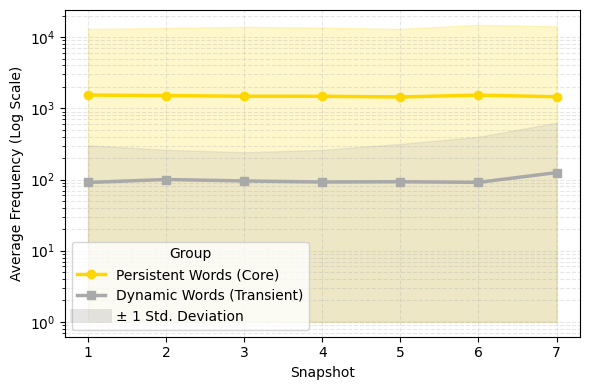


--- RISULTATI MEDI E DISPERSIONE ---
   Snapshot  Avg_Freq_Core  Standard_Deviation_Core  Avg_Freq_Dynamic  \
0         1    1537.651519             11525.183560         90.896165   
1         2    1509.942773             11962.533984         99.991017   
2         3    1478.569085             12500.499276         95.414150   
3         4    1476.580421             12135.730490         92.266797   
4         5    1444.653856             11627.702617         93.082646   
5         6    1532.492915             13350.233234         91.168652   
6         7    1452.919803             12769.025723        125.138973   

   Standard_Deviation_Dynamic  
0                  211.320821  
1                  161.642381  
2                  146.221178  
3                  168.927953  
4                  223.446162  
5                  307.446262  
6                  502.716431  


In [68]:
import matplotlib.pyplot as plt
import numpy as np

# =============================================================================
# 3. VISUALIZZAZIONE CON DEVIAZIONE STANDARD (Bande Ombreggiate)
# =============================================================================

plt.figure(figsize=(6, 4))

# --- 1. PLOT PERSISTENT WORDS (CORE) ---
# Linea della media
plt.plot(df_res['Snapshot'], df_res['Avg_Freq_Core'], 
         label='Persistent Words (Core)', color='#FFD700', marker='o', linewidth=2.5)

# Banda della Deviazione Standard
# Usiamo np.maximum(..., 1) per evitare che Mean - Std diventi <= 0 (che rompe la scala Log)
core_lower = np.maximum(df_res['Avg_Freq_Core'] - df_res['Standard_Deviation_Core'], 1)
core_upper = df_res['Avg_Freq_Core'] + df_res['Standard_Deviation_Core']

plt.fill_between(df_res['Snapshot'], core_lower, core_upper, 
                 color='#FFD700', alpha=0.2) # Alpha a 0.2 rende il colore semitrasparente

# --- 2. PLOT DYNAMIC WORDS (TRANSIENT) ---
# Linea della media
plt.plot(df_res['Snapshot'], df_res['Avg_Freq_Dynamic'], 
         label='Dynamic Words (Transient)', color='#A9A9A9', marker='s', linewidth=2.5)

# Banda della Deviazione Standard
dyn_lower = np.maximum(df_res['Avg_Freq_Dynamic'] - df_res['Standard_Deviation_Dynamic'], 1)
dyn_upper = df_res['Avg_Freq_Dynamic'] + df_res['Standard_Deviation_Dynamic']

plt.fill_between(df_res['Snapshot'], dyn_lower, dyn_upper, 
                 color='#A9A9A9', alpha=0.2)

# --- 3. FORMATTAZIONE DEL GRAFICO ---
plt.ylabel("Average Frequency (Log Scale)")
plt.xlabel("Snapshot")

# Aggiungiamo un trick per la legenda per spiegare le bande
plt.plot([], [], color='gray', alpha=0.2, linewidth=10, label='± 1 Std. Deviation')
plt.legend(title="Group")

# Scala Logaritmica
plt.yscale('log') 
plt.grid(True, which="both", ls="--", alpha=0.3)

plt.tight_layout()
plt.show()

# Stampa tabella
print("\n--- RISULTATI MEDI E DISPERSIONE ---")
print(df_res[['Snapshot', 'Avg_Freq_Core', 'Standard_Deviation_Core', 'Avg_Freq_Dynamic', 'Standard_Deviation_Dynamic']])

## Further network analyses

--- INIZIO ANALISI K vs S (Legge di Potenza) ---
Snap 1: Alpha = 0.993 (R2 = 1.00)
Snap 2: Alpha = 0.999 (R2 = 1.00)
Snap 3: Alpha = 0.999 (R2 = 1.00)
Snap 4: Alpha = 1.000 (R2 = 1.00)
Snap 5: Alpha = 1.000 (R2 = 1.00)
Snap 6: Alpha = 0.998 (R2 = 1.00)
Snap 7: Alpha = 0.998 (R2 = 1.00)


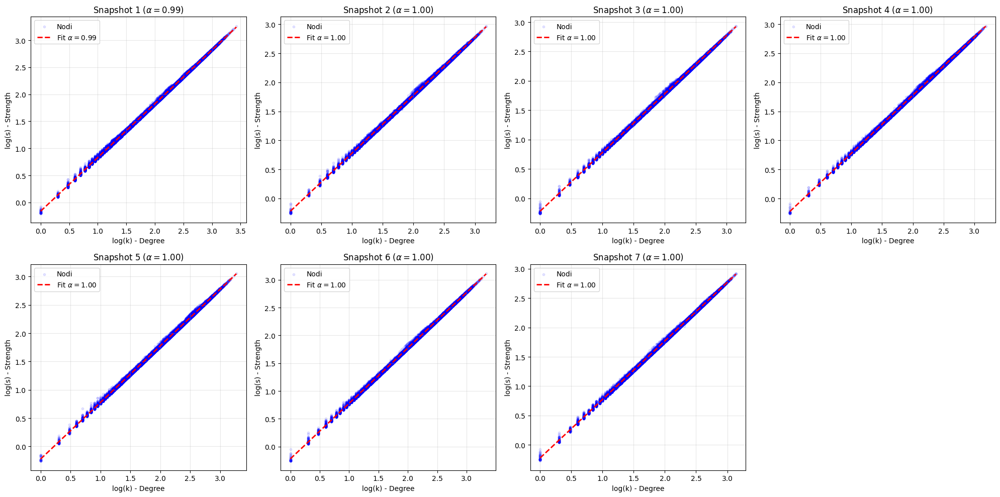

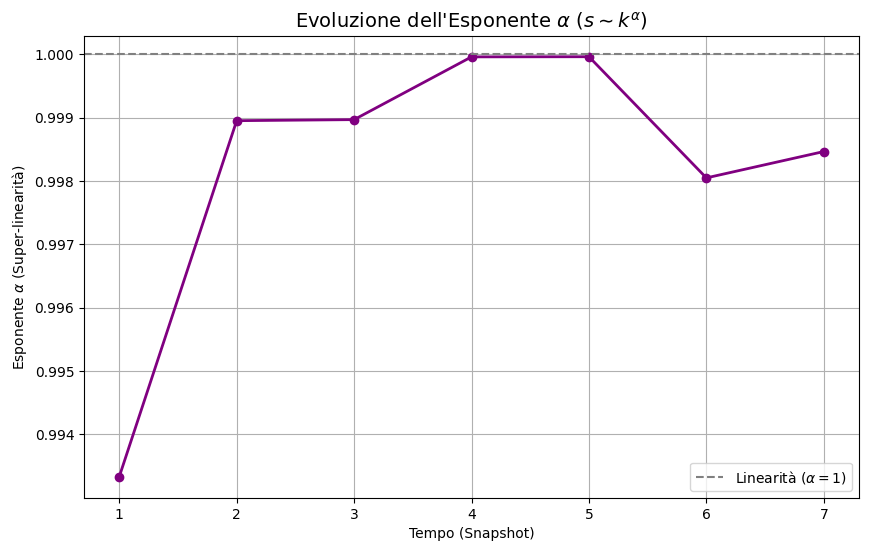

In [ ]:
import numpy as np
import igraph as ig
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
from pathlib import Path

# Questo script calcola α per ogni snapshot, genera i grafici di dispersione (scatter plot) 
# log-log e traccia l'evoluzione di α nel tempo (se α > 1, super-linearità -> impoverimento).

# =============================================================================
# CONFIGURAZIONE
# =============================================================================

# Cartella coi grafi (o edge list se preferisci ricaricarli da lì)
input_graphs_dir = Path("networks_hybrid_annotated") 
snapshots = range(1, 8)

# Output
# output_alpha_csv = Path("alpha_evolution.csv")

# Liste per salvare i risultati
alpha_values = []
r_squared_values = []
snapshot_labels = []

# Setup Grafico Griglia (opzionale, per vedere tutti gli scatter insieme)
fig, axes = plt.subplots(2, 4, figsize=(20, 10)) # Adatta grid in base a n. snapshot
axes = axes.flatten()

print("--- INIZIO ANALISI K vs S (Legge di Potenza) ---")

for i, snap in enumerate(snapshots):
    graph_path = input_graphs_dir / f"graph_snap{snap}_hybrid.igp"
    
    if not graph_path.exists():
        print(f"[SKIP] Snap {snap}: File non trovato.")
        continue
    
    # 1. Carica Grafo
    try:
        g = ig.Graph.Read_Pickle(graph_path)
    except:
        # Fallback se non è GML (es. Pickle)
        # g = ig.Graph.Read_Pickle(graph_path)
        print(f"Errore lettura snap {snap}")
        continue
        
    # 2. Estrai Degree (k) e Strength (s)
    # Strength richiede un attributo peso. Assumiamo si chiami 'weight'
    if "weight" not in g.es.attributes():
        print(f"Warning Snap {snap}: Archi senza peso. s = k (alpha sarà 1).")
        # Assegna peso 1 se manca per evitare crash
        g.es["weight"] = 1.0
        
    k = np.array(g.degree())
    s = np.array(g.strength(weights="weight"))
    
    # 3. Filtro Logaritmico (Rimuoviamo k=0 o s=0 per evitare log(0)=-inf)
    valid_mask = (k > 0) & (s > 0)
    k_log = np.log10(k[valid_mask])
    s_log = np.log10(s[valid_mask])
    
    if len(k_log) < 10:
        print(f"Snap {snap}: Troppi pochi nodi per regressione.")
        continue
        
    # 4. Regressione Lineare (Calcolo di Alpha)
    # Slope = Alpha
    slope, intercept, r_value, p_value, std_err = linregress(k_log, s_log)
    
    alpha_values.append(slope)
    r_squared_values.append(r_value**2)
    snapshot_labels.append(snap)
    
    print(f"Snap {snap}: Alpha = {slope:.3f} (R2 = {r_value**2:.2f})")
    
    # 5. Plot Scatter Log-Log per questo snapshot
    ax = axes[i]
    ax.scatter(k_log, s_log, alpha=0.1, s=10, color='blue', label='Nodi')
    
    # Linea di fit
    x_fit = np.linspace(min(k_log), max(k_log), 100)
    y_fit = slope * x_fit + intercept
    ax.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Fit $\\alpha={slope:.2f}$')
    
    ax.set_title(f"Snapshot {snap} ($\\alpha={slope:.2f}$)")
    ax.set_xlabel("log(k) - Degree")
    ax.set_ylabel("log(s) - Strength")
    ax.legend()
    ax.grid(True, alpha=0.3)

# Rimuovi assi vuoti se ci sono
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# =============================================================================
# 6. ANALISI TREND TEMPORALE DI ALPHA
# =============================================================================
'''
# Salvataggio CSV
df_alpha = pd.DataFrame({
    "snapshot": snapshot_labels,
    "alpha": alpha_values,
    "r_squared": r_squared_values
})
df_alpha.to_csv(output_alpha_csv, index=False)'''

# Plot Evoluzione Alpha
plt.figure(figsize=(10, 6))
plt.plot(snapshot_labels, alpha_values, marker='o', linestyle='-', color='purple', linewidth=2)

# Linea di riferimento (Linearità)
plt.axhline(1.0, color='gray', linestyle='--', label="Linearità ($\\alpha=1$)")

plt.title("Evoluzione dell'Esponente $\\alpha$ ($s \\sim k^\\alpha$)", fontsize=14)
plt.xlabel("Tempo (Snapshot)")
plt.ylabel("Esponente $\\alpha$ (Super-linearità)")
plt.legend()
plt.grid(True)
plt.show() 

# print(f"[DONE] Analisi completata. Dati salvati in {output_alpha_csv}")

## Paradigmatic Core Network

In [34]:
import igraph as ig
import pandas as pd
from pathlib import Path
from tqdm import tqdm
import random

# =============================================================================
# CONFIGURAZIONE
# =============================================================================

input_dir = Path("networks_hybrid_annotated")
output_dir = Path("networks_paradigmatic") # Nuova cartella per i grafi filtrati
output_dir.mkdir(exist_ok=True)

snapshots = range(1, 8)

# Parola test per vedere l'effetto del filtro (scegli un verbo o nome comune)
test_token = "fare" 

# =============================================================================
# FUNZIONE DI FILTRAGGIO
# =============================================================================

def filter_by_pos(g):
    """
    Mantiene solo gli archi tra nodi con lo stesso POS tag.
    Restituisce un nuovo grafo filtrato.
    """
    # Facciamo una copia per non rovinare l'originale in memoria
    g_syn = g.copy()
    
    # Recuperiamo i POS di tutti i nodi in una lista rapida
    # (Assumiamo che l'attributo 'pos' esista dal passaggio precedente)
    pos_list = g_syn.vs['pos']
    
    edges_to_delete = []
    
    # Iteriamo sugli archi
    for e in g_syn.es:
        source_idx = e.source
        target_idx = e.target
        
        pos_s = pos_list[source_idx]
        pos_t = pos_list[target_idx]
        
        # Se i POS sono diversi o sono sconosciuti (X/UNK), segna per cancellazione
        if pos_s != pos_t or pos_s in ['X', 'UNK', 'PUNCT']:
            edges_to_delete.append(e.index)
            
    # Cancellazione in blocco (molto veloce)
    g_syn.delete_edges(edges_to_delete)
    
    # Rimuoviamo anche i nodi che sono rimasti isolati (grado 0) dopo il filtro?
    # Spesso è utile per pulire la visualizzazione, ma per le statistiche meglio tenerli.
    # Qui li teniamo per coerenza con gli indici.
    
    return g_syn, len(edges_to_delete)

# =============================================================================
# ESECUZIONE
# =============================================================================

print("--- CREAZIONE RETE PARADIGMATICA (SAME-POS) ---")

for snap in snapshots:
    file_path = input_dir / f"graph_snap{snap}_hybrid.igp"
    
    if not file_path.exists():
        continue
        
    try:
        # Carica grafo originale
        g = ig.Graph.Read_Pickle(str(file_path))
        n_edges_orig = g.ecount()
        
        # Filtra
        g_syn, deleted_count = filter_by_pos(g)
        n_edges_new = g_syn.ecount()
        
        # Salva
        out_path = output_dir / f"graph_snap{snap}_paradigmatic.igp"
        g_syn.write_pickle(str(out_path))
        
        print(f"Snap {snap}: Archi originali {n_edges_orig} -> Rimasti {n_edges_new} (Rimossi {deleted_count})")
        
        # --- ISPEZIONE QUALITATIVA (Solo sull'ultimo snap o su richiesta) ---
        if snap == 7: # Controlliamo l'ultimo snapshot
            print(f"\n--- ESEMPIO ISPEZIONE: '{test_token}' in Snap {snap} ---")
            
            try:
                # Trova indice nodo
                v_orig = g.vs.find(name=test_token)
                v_syn = g_syn.vs.find(name=test_token)
                
                # Vicini Originali (Top 5 per peso se possibile, qui prendiamo a caso)
                neigh_orig = g.vs[g.neighbors(v_orig)][:10]['name']
                
                # Vicini Paradigmatici
                neigh_syn = g_syn.vs[g_syn.neighbors(v_syn)][:10]['name']
                
                print(f"POS del token: {v_orig['pos']}")
                print(f"Vicini PRIMA (Misti): {neigh_orig}")
                print(f"Vicini DOPO (Solo {v_orig['pos']}): {neigh_syn}")
                
            except ValueError:
                print(f"Parola '{test_token}' non trovata nel grafo.")

    except Exception as e:
        print(f"Errore su {file_path}: {e}")

print(f"\n[DONE] Grafi salvati in {output_dir}")

--- CREAZIONE RETE PARADIGMATICA (SAME-POS) ---
Snap 1: Archi originali 3033079 -> Rimasti 1299107 (Rimossi 1733972)
Snap 2: Archi originali 1985640 -> Rimasti 793325 (Rimossi 1192315)
Snap 3: Archi originali 1930980 -> Rimasti 787405 (Rimossi 1143575)
Snap 4: Archi originali 3011365 -> Rimasti 1232094 (Rimossi 1779271)
Snap 5: Archi originali 3482725 -> Rimasti 1442056 (Rimossi 2040669)
Snap 6: Archi originali 3604324 -> Rimasti 1489185 (Rimossi 2115139)
Snap 7: Archi originali 2390413 -> Rimasti 984950 (Rimossi 1405463)

--- ESEMPIO ISPEZIONE: 'fare' in Snap 7 ---
Parola 'fare' non trovata nel grafo.

[DONE] Grafi salvati in networks_paradigmatic


--- COSTRUZIONE CORE COMUNE ---
Core Comune: 20113 parole.
--- CALCOLO METRICHE GLOBALI ---
Snap 1 completato.
Snap 2 completato.
Snap 3 completato.
Snap 4 completato.
Snap 5 completato.
Snap 6 completato.
Snap 7 completato.


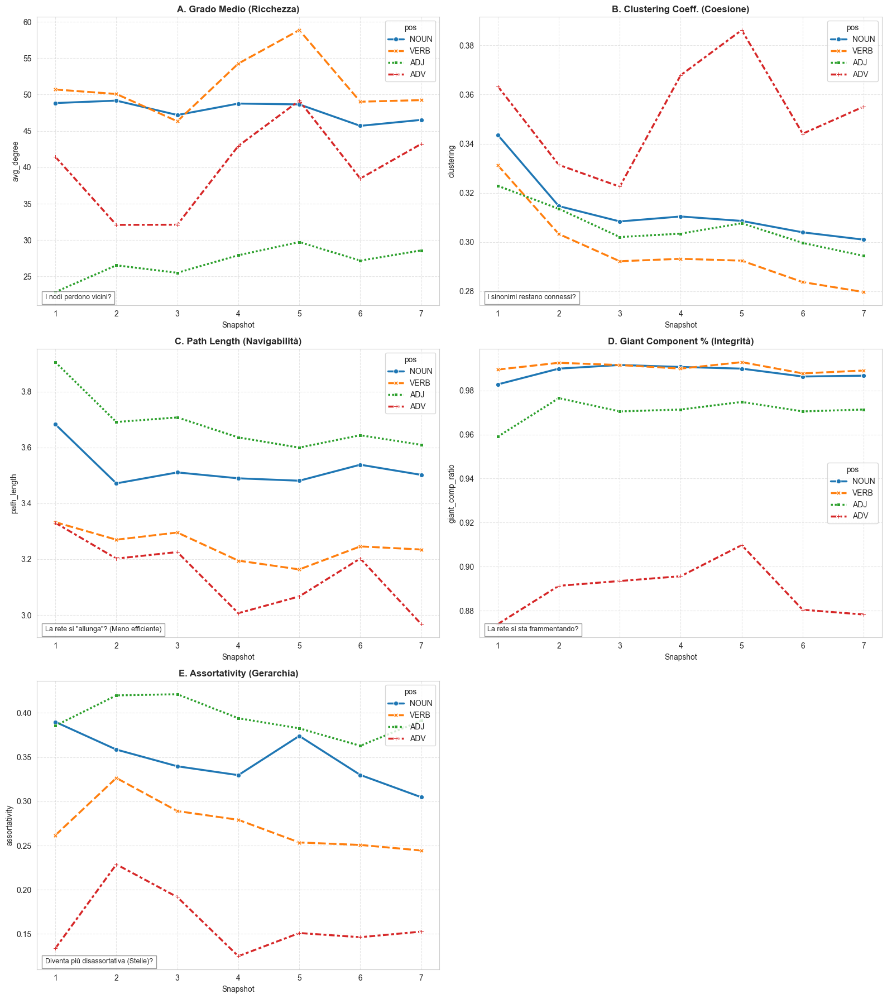


--- REPORT VARIAZIONI (Snap 1 -> Snap 7) ---

Categoria: NOUN
  - avg_degree: 48.836 -> 46.524 (-4.7%)
  - clustering: 0.344 -> 0.301 (-12.4%)
  - path_length: 3.683 -> 3.502 (-4.9%)
  - giant_comp_ratio: 0.983 -> 0.987 (+0.4%)
  - assortativity: 0.390 -> 0.305 (-21.8%)

Categoria: VERB
  - avg_degree: 50.697 -> 49.239 (-2.9%)
  - clustering: 0.331 -> 0.280 (-15.6%)
  - path_length: 3.332 -> 3.235 (-2.9%)
  - giant_comp_ratio: 0.989 -> 0.989 (-0.0%)
  - assortativity: 0.262 -> 0.244 (-6.6%)

Categoria: ADJ
  - avg_degree: 22.861 -> 28.585 (+25.0%)
  - clustering: 0.323 -> 0.294 (-8.8%)
  - path_length: 3.905 -> 3.609 (-7.6%)
  - giant_comp_ratio: 0.959 -> 0.971 (+1.3%)
  - assortativity: 0.386 -> 0.391 (+1.5%)

Categoria: ADV
  - avg_degree: 41.441 -> 43.222 (+4.3%)
  - clustering: 0.363 -> 0.355 (-2.3%)
  - path_length: 3.330 -> 2.968 (-10.9%)
  - giant_comp_ratio: 0.874 -> 0.878 (+0.5%)
  - assortativity: 0.134 -> 0.153 (+14.1%)


In [ ]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_paradigmatic")
snapshots = range(1, 8)
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']

# =============================================================================
# 1. IDENTIFICAZIONE CORE COMUNE (CRUCIALE)
# =============================================================================
print("--- COSTRUZIONE CORE COMUNE ---")
common_nodes = None

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    if not fpath.exists(): continue
    
    g = ig.Graph.Read_Pickle(str(fpath))
    nodes = set(g.vs['token'])
    
    if common_nodes is None:
        common_nodes = nodes
    else:
        common_nodes = common_nodes.intersection(nodes)

print(f"Core Comune: {len(common_nodes)} parole.")

# =============================================================================
# 2. CALCOLO METRICHE AVANZATE
# =============================================================================
results = []

print("--- CALCOLO METRICHE GLOBALI ---")

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    if not fpath.exists(): continue
    
    g_full = ig.Graph.Read_Pickle(str(fpath))
    
    # Restringiamo al Core (per evitare distorsioni date dall'aumento del vocabolario)
    g_core = g_full.subgraph(g_full.vs.select(token_in=common_nodes))
    
    if 'pos' not in g_core.vs.attributes(): continue
    
    for pos in target_pos:
        # Sottografo POS
        g_sub = g_core.subgraph(g_core.vs.select(pos=pos))
        
        n = g_sub.vcount()
        if n < 10: continue # Ignora reti troppo piccole
        
        # --- A. METRICHE BASE ---
        # Grado Medio
        avg_k = np.mean(g_sub.degree())
        # Clustering (Globale o Average Local)
        # Transitivity avg local è meglio per reti linguistiche
        clust = g_sub.transitivity_avglocal_undirected(mode="zero")
        # "quantità" di sinonimi nel tempo
        
        # --- B. FRAMMENTAZIONE (Giant Component) ---
        components = g_sub.components()
        gc = components.giant()
        gc_size_ratio = gc.vcount() / n # % di nodi nel continente principale

        # Se S diminuisce, è gravissimo. 
        # Significa che intere aree semantiche si stanno staccando dal corpo principale. 
        # Le parole diventano isole isolate, incapaci di connettersi al resto del discorso.
        
        # --- C. EFFICIENZA (Path Length) ---
        # Calcolata SOLO sulla Giant Component per evitare infinito
        # avg_path_length restituisce la media delle distanze
        path_len = gc.average_path_length(directed=False, unconn=False)
        # Se la rete si sfilaccia, L aumenta. Ovvero:
        # Le scorciatoie semantiche (le sfumature) spariscono e 
        # per collegare due concetti devi fare un giro più lungo. 
        # La mappa semantica diventa meno efficiente.
        
        # --- D. GERARCHIA (Assortativity) ---
        # Se la rete non ha archi, assortativity è nan
        if g_sub.ecount() > 0:
            assort = g_sub.assortativity_degree(directed=False) 
            # r>0 (Assortativa): parole con tanto sinonimi si legano a parole con tanti sinonimi (Club dei sinonimi colti).
            # r<0 (Disassortativa): parole con tanti sinonimi si legano con parole con pochi sinonimi (Struttura a Stella/Hub & Spoke).
        else:
            assort = np.nan
        
        
        results.append({
            'snapshot': snap,
            'pos': pos,
            'avg_degree': avg_k,         # Quantità
            'clustering': clust,         # Coesione
            'path_length': path_len,     # Efficienza (Small World)
            'giant_comp_ratio': gc_size_ratio, # Integrità
            'assortativity': assort      # Gerarchia
        })
        
    print(f"Snap {snap} completato.")

df_res = pd.DataFrame(results)

# =============================================================================
# 3. VISUALIZZAZIONE "DASHBOARD"
# =============================================================================
fig, axes = plt.subplots(3, 2, figsize=(16, 18))
axes = axes.flatten()

metrics = [
    ('avg_degree', 'A. Grado Medio (Ricchezza)', 'I nodi perdono vicini?'),
    ('clustering', 'B. Clustering Coeff. (Coesione)', 'I sinonimi restano connessi?'),
    ('path_length', 'C. Path Length (Navigabilità)', 'La rete si "allunga"? (Meno efficiente)'),
    ('giant_comp_ratio', 'D. Giant Component % (Integrità)', 'La rete si sta frammentando?'),
    ('assortativity', 'E. Assortativity (Gerarchia)', 'Diventa più disassortativa (Stelle)?')
]

for i, (metric, title, desc) in enumerate(metrics):
    sns.lineplot(data=df_res, x='snapshot', y=metric, hue='pos', 
                 style='pos', markers=True, linewidth=2.5, ax=axes[i])
    axes[i].set_title(title, fontsize=12, fontweight='bold')
    axes[i].set_xlabel("Snapshot")
    axes[i].grid(True, linestyle='--', alpha=0.5)
    
    # Annotazione descrittiva
    axes[i].text(0.02, 0.02, desc, transform=axes[i].transAxes, 
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'), fontsize=9)

# Rimuovi l'ultimo asse vuoto (abbiamo 5 metriche su 6 spazi)
fig.delaxes(axes[5])

plt.tight_layout()
plt.savefig("advanced_core_metrics.png", dpi=300)
plt.show()

# =============================================================================
# 4. TABELLA SINTETICA (VARIAZIONI)
# =============================================================================
print("\n--- REPORT VARIAZIONI (Snap 1 -> Snap 7) ---")
pivoted = df_res.pivot(index='snapshot', columns='pos')

for pos in target_pos:
    print(f"\nCategoria: {pos}")
    for metric, _, _ in metrics:
        try:
            val_start = pivoted[metric][pos].iloc[0]
            val_end = pivoted[metric][pos].iloc[-1]
            delta = ((val_end - val_start) / abs(val_start)) * 100
            print(f"  - {metric}: {val_start:.3f} -> {val_end:.3f} ({delta:+.1f}%)")
        except:
            pass

--- ANALISI ASSORTATIVITÀ PER POS (Core & Periphery Mixing) ---
Snap 1 completato.
Snap 2 completato.
Snap 3 completato.
Snap 4 completato.
Snap 5 completato.
Snap 6 completato.
Snap 7 completato.


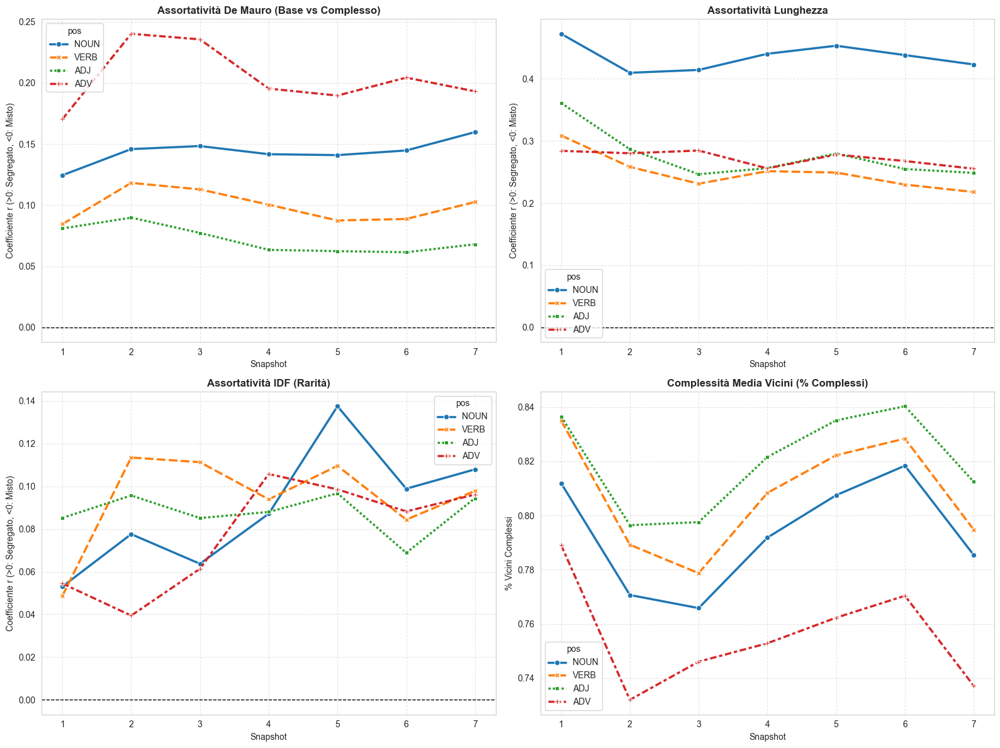


--- VARIAZIONE ASSORTATIVITÀ (Snap 1 -> Snap 7) ---

[NOUN]
  Assort. De Mauro: 0.124 -> 0.160 (Delta: +0.035)
  Neigh. Complexity: 0.812 -> 0.785 (Delta: -0.026)

[VERB]
  Assort. De Mauro: 0.085 -> 0.103 (Delta: +0.018)
  Neigh. Complexity: 0.835 -> 0.795 (Delta: -0.040)

[ADJ]
  Assort. De Mauro: 0.081 -> 0.068 (Delta: -0.013)
  Neigh. Complexity: 0.837 -> 0.812 (Delta: -0.024)

[ADV]
  Assort. De Mauro: 0.170 -> 0.193 (Delta: +0.023)
  Neigh. Complexity: 0.789 -> 0.737 (Delta: -0.052)


In [ ]:
# assortatività per POS (rete completa filtrata per POS)

import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_paradigmatic")
snapshots = range(1, 8)
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']

# =============================================================================
# CALCOLO METRICHE DI ASSORTATIVITÀ PER POS
# =============================================================================

results = []

print("--- ANALISI ASSORTATIVITÀ PER POS (Core & Periphery Mixing) ---")

for snap in snapshots:
    fpath = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    if not fpath.exists(): continue
    
    try:
        g_full = ig.Graph.Read_Pickle(str(fpath))
        
        # Verifica attributi
        if not all(attr in g_full.vs.attributes() for attr in ['char_len', 'demauro_level', 'idf', 'pos']):
            print(f"Snap {snap}: Attributi mancanti.")
            continue
            
        # Analisi per ogni POS
        for pos in target_pos:
            # Sottografo indotto per quel POS
            nodes_of_interest = g_full.vs.select(pos=pos)
            if len(nodes_of_interest) < 10: continue
            
            g_sub = g_full.subgraph(nodes_of_interest)
            
            # --- PREPARAZIONE DATI ---
            # 1. Lunghezza
            vals_len = [v if v is not None else 0 for v in g_sub.vs['char_len']]
            
            # 2. De Mauro Binario (0=Base/AltoUso/AltaDisp, 1=Complesso/Altro)
            # Nota: nel tuo codice precedente avevi mappato < 3 -> 1, else -> 2.
            # Qui usiamo 0 (Semplice) e 1 (Complesso) per chiarezza nel calcolo nominale.
            # NVdB categories: 0=FO, 1=AU, 2=AD, 3=Altro
            # Binario: Base (0,1,2) vs Complesso (3)
            vals_dm_bin = [0 if (v is not None and v < 3) else 1 for v in g_sub.vs['demauro_level']]
            
            # 3. IDF
            vals_idf = [v if v is not None else 0 for v in g_sub.vs['idf']]
            
            # --- CALCOLO ASSORTATIVITÀ ---
            
            # A. Assortatività Lunghezza
            r_len = g_sub.assortativity(vals_len, directed=False)
            
            # B. Assortatività De Mauro (Nominale)
            # Richiede che ci siano nodi di entrambe le classi, altrimenti crasha o dà nan
            if len(set(vals_dm_bin)) > 1:
                r_dm = g_sub.assortativity_nominal(vals_dm_bin, directed=False)
            else:
                r_dm = np.nan
            
            # C. Assortatività IDF
            r_idf = g_sub.assortativity(vals_idf, directed=False)
            
            # --- CALCOLO VICINATO MEDIO (Neighbor Complexity) ---
            # Quanto sono complessi i vicini di un nodo medio di questo POS?
            # Usiamo De Mauro Binario come proxy di complessità (0=Semplice, 1=Complesso)
            # Se la media sale, i vicini sono più complessi.
            
            adj = g_sub.get_adjacency_sparse()
            degrees = np.array(g_sub.degree())
            complexity_array = np.array(vals_dm_bin)
            
            # Somma complessità vicini
            sum_neigh_comp = adj.dot(complexity_array)
            
            with np.errstate(divide='ignore', invalid='ignore'):
                avg_neigh_comp_per_node = sum_neigh_comp / degrees
                avg_neigh_comp_per_node[degrees == 0] = 0
            
            # Media globale
            # Nota: questa è la % media di vicini "Complessi" che un nodo ha
            global_neigh_complexity = np.mean(avg_neigh_comp_per_node[degrees > 0])
            
            results.append({
                'snapshot': snap,
                'pos': pos,
                'assort_len': r_len,
                'assort_dm': r_dm,
                'assort_idf': r_idf,
                'neigh_complexity': global_neigh_complexity
            })
            
        print(f"Snap {snap} completato.")

    except Exception as e:
        print(f"Errore snap {snap}: {e}")

df_res = pd.DataFrame(results)

# =============================================================================
# VISUALIZZAZIONE COMPARATIVA (GRID PLOT)
# =============================================================================

# Creiamo una figura con 4 righe (una per metrica) e colonne pari ai POS?
# Meglio: Una figura per metrica, con linee diverse per POS.

metrics_to_plot = [
    ('assort_dm', 'Assortatività De Mauro (Base vs Complesso)', 'I colti stanno coi colti?'),
    ('assort_len', 'Assortatività Lunghezza', 'I lunghi stanno coi lunghi?'),
    ('assort_idf', 'Assortatività IDF (Rarità)', 'I rari stanno coi rari?'),
    ('neigh_complexity', 'Complessità Media Vicini (% Complessi)', 'Quanti sinonimi colti ha una parola media?')
]

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, (metric, title, desc) in enumerate(metrics_to_plot):
    ax = axes[i]
    
    # Lineplot con hue=POS
    sns.lineplot(data=df_res, x='snapshot', y=metric, hue='pos', style='pos', 
                 markers=True, linewidth=2.5, ax=ax)
    
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel("Snapshot")
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Linea zero per assortatività
    if 'assort' in metric:
        ax.axhline(0, color='black', linestyle='--', linewidth=1)
        ax.set_ylabel("Coefficiente r (>0: Segregato, <0: Misto)")
    else:
        ax.set_ylabel("% Vicini Complessi")

plt.tight_layout()
plt.show()

# =============================================================================
# ANALISI DELTA (Variazione Temporale)
# =============================================================================

print("\n--- VARIAZIONE ASSORTATIVITÀ (Snap 1 -> Snap 7) ---")

pivoted = df_res.pivot(index='snapshot', columns='pos')

for pos in target_pos:
    print(f"\n[{pos}]")
    try:
        # De Mauro
        dm_start = pivoted['assort_dm'][pos].iloc[0]
        dm_end = pivoted['assort_dm'][pos].iloc[-1]
        print(f"  Assort. De Mauro: {dm_start:.3f} -> {dm_end:.3f} (Delta: {dm_end-dm_start:+.3f})")
        
        # Neighbor Complexity
        nc_start = pivoted['neigh_complexity'][pos].iloc[0]
        nc_end = pivoted['neigh_complexity'][pos].iloc[-1]
        print(f"  Neigh. Complexity: {nc_start:.3f} -> {nc_end:.3f} (Delta: {nc_end-nc_start:+.3f})")
        
    except:
        print("  Dati insufficienti.")

--- ANALISI DIFFERENZIALE (Snap 1 -> 7) ---
Nodi nel Core Comune: 23840
Parole analizzate: 21305


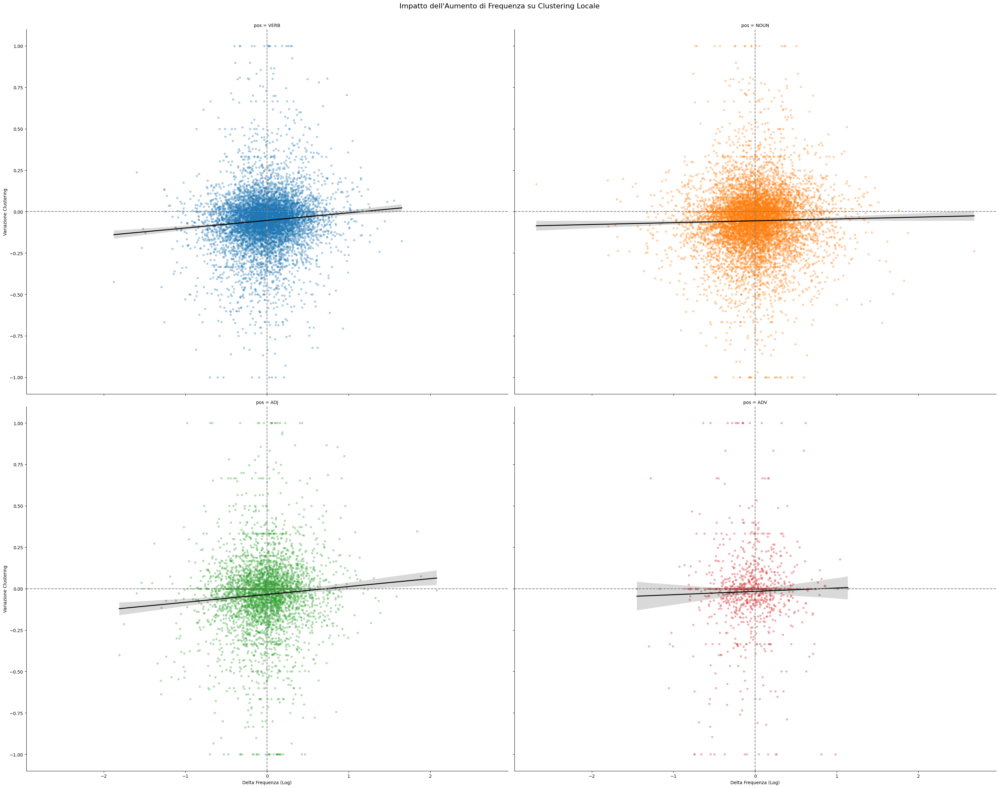

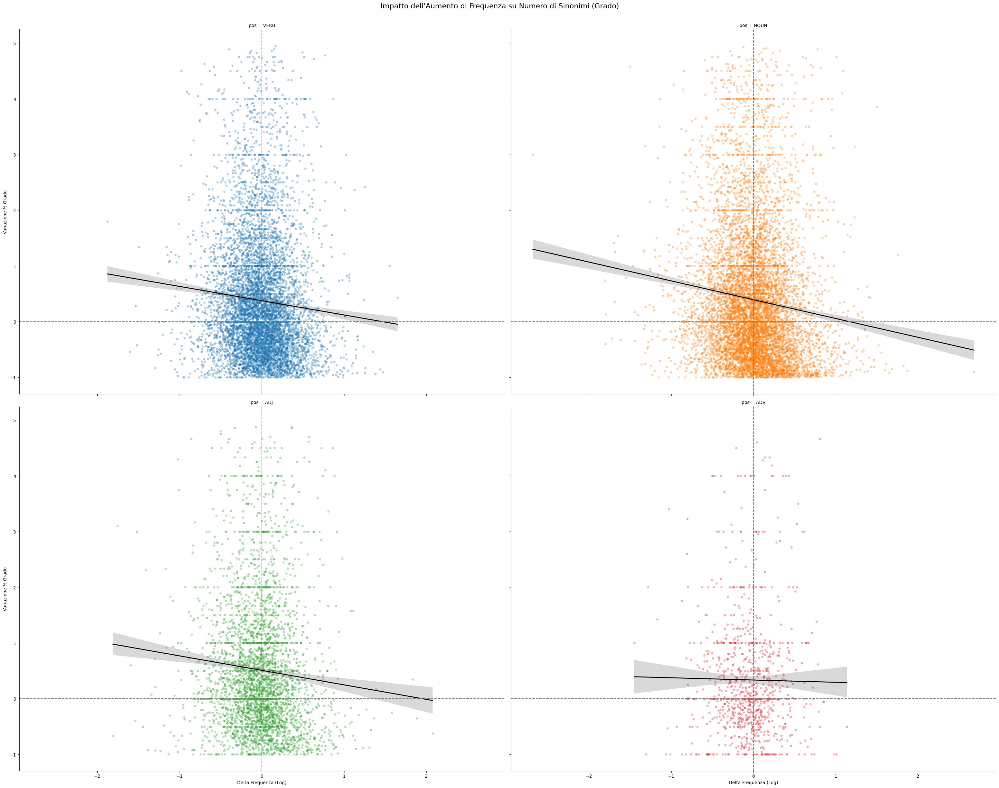

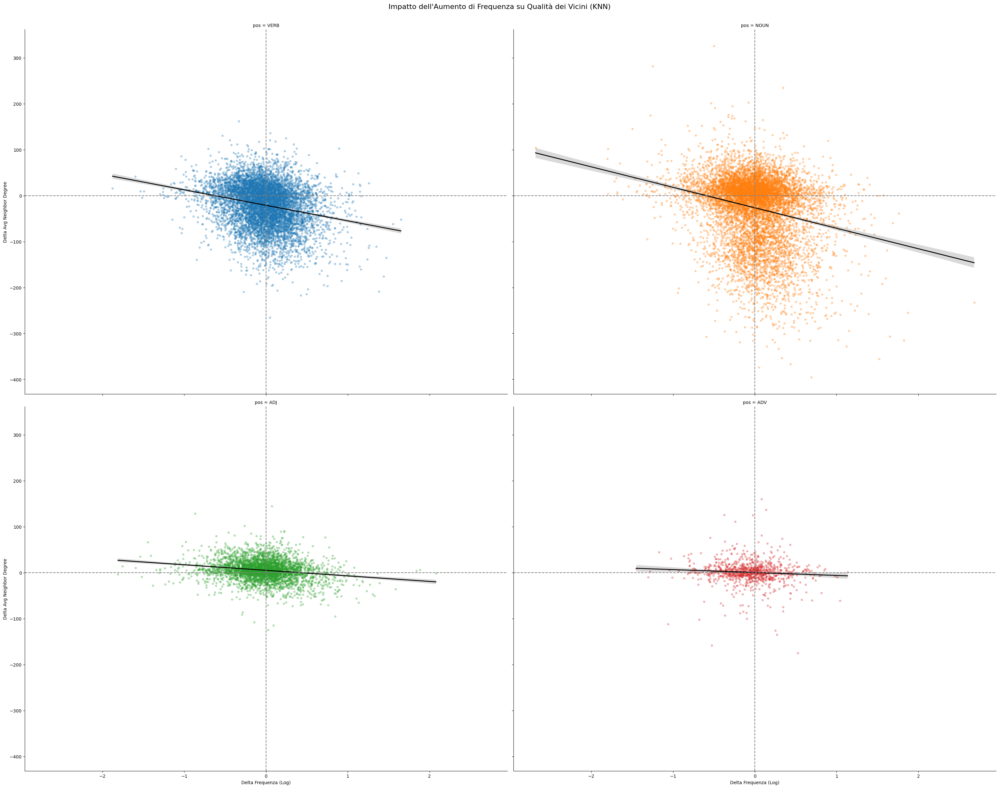


--- CHI GUIDA IL CAMBIAMENTO? (Top 10% vs Resto) ---

Categoria: NOUN
  Soglia d_freq (Top 10%): > 0.46
  Delta Clustering Medio: Top 10% [-0.058] vs Resto [-0.055]
  Delta Grado Medio:      Top 10% [+14.9%] vs Resto [+42.0%]
  Delta Vicini (KNN):     Top 10% [-58.76] vs Resto [-23.02]

Categoria: VERB
  Soglia d_freq (Top 10%): > 0.38
  Delta Clustering Medio: Top 10% [-0.030] vs Resto [-0.056]
  Delta Grado Medio:      Top 10% [+17.3%] vs Resto [+40.2%]
  Delta Vicini (KNN):     Top 10% [-41.17] vs Resto [-18.34]

Categoria: ADJ
  Soglia d_freq (Top 10%): > 0.39
  Delta Clustering Medio: Top 10% [-0.003] vs Resto [-0.040]
  Delta Grado Medio:      Top 10% [+21.2%] vs Resto [+54.7%]
  Delta Vicini (KNN):     Top 10% [-7.23] vs Resto [6.71]

Categoria: ADV
  Soglia d_freq (Top 10%): > 0.34
  Delta Clustering Medio: Top 10% [-0.037] vs Resto [-0.015]
  Delta Grado Medio:      Top 10% [+39.4%] vs Resto [+33.0%]
  Delta Vicini (KNN):     Top 10% [-7.74] vs Resto [1.52]


In [1]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from scipy.stats import pearsonr

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_paradigmatic")
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']

# Confrontiamo Inizio (Snap 1) vs Fine (Snap 7)
snap_start = 1
snap_end = 7

# =============================================================================
# 1. CARICAMENTO E ALLINEAMENTO (CORE COMUNE)
# =============================================================================
print(f"--- ANALISI DIFFERENZIALE (Snap {snap_start} -> {snap_end}) ---")

path_start = input_dir / f"graph_snap{snap_start}_paradigmatic.igp"
path_end = input_dir / f"graph_snap{snap_end}_paradigmatic.igp"

if not path_start.exists() or not path_end.exists():
    raise FileNotFoundError("File grafi non trovati.")

g1 = ig.Graph.Read_Pickle(str(path_start))
g2 = ig.Graph.Read_Pickle(str(path_end))

# Troviamo i nodi comuni (Core Fisso)
nodes1 = set(g1.vs['token'])
nodes2 = set(g2.vs['token'])
core_nodes = list(nodes1.intersection(nodes2))

print(f"Nodi nel Core Comune: {len(core_nodes)}")

# Creiamo sottografi solo col core per confronti puliti
g1_core = g1.subgraph(g1.vs.select(token_in=core_nodes))
g2_core = g2.subgraph(g2.vs.select(token_in=core_nodes))

# Mappe per accesso rapido ai dati
# Dizionari: {nome: indice_nel_sottografo}
idx1 = {v['token']: v.index for v in g1_core.vs}
idx2 = {v['token']: v.index for v in g2_core.vs}

# Pre-calcolo metriche vettoriali
# A. Clustering Locale
cc1 = np.array(g1_core.transitivity_local_undirected(mode="zero"))
cc2 = np.array(g2_core.transitivity_local_undirected(mode="zero"))

# B. Grado (Degree)
k1 = np.array(g1_core.degree())
k2 = np.array(g2_core.degree())

# C. Average Neighbor Degree (knn) - Proxy per Assortatività Locale
# (Se knn scende mentre k sale, sto diventando un hub che parla con la plebe -> Disassortativo)
knn1 = np.array(g1_core.knn()[0]) # igraph.knn restituisce (knn, knnk), prendiamo il primo
knn2 = np.array(g2_core.knn()[0])
# Gestione NaNs (nodi isolati)
knn1 = np.nan_to_num(knn1)
knn2 = np.nan_to_num(knn2)

# D. Frequenza
freq1 = np.array(g1_core.vs['freq'])
freq2 = np.array(g2_core.vs['freq'])

# E. POS (dal grafo 1, assumendo non cambi)
if 'pos' in g1_core.vs.attributes():
    pos_map = {v['token']: v['pos'] for v in g1_core.vs}
else:
    pos_map = {name: 'UNK' for name in core_nodes}

# =============================================================================
# 2. CALCOLO DEI DELTA
# =============================================================================
data = []

for name in core_nodes:
    i1 = idx1[name]
    i2 = idx2[name]
    
    pos = pos_map[name]
    if pos not in target_pos: continue
    
    # Delta Frequenza (Log difference è meglio per la skewness)
    # Aggiungiamo 1 per evitare log(0)
    d_freq = np.log10(freq2[i2] + 1) - np.log10(freq1[i1] + 1)
    
    # Delta Clustering (Assoluto)
    d_cc = cc2[i2] - cc1[i1]
    
    # Delta Degree (Relativo %)
    # Se partiva da 0, mettiamo variazione assoluta o max
    if k1[i1] > 0:
        d_k = (k2[i2] - k1[i1]) / k1[i1]
    else:
        d_k = k2[i2] # Caso raro nel core
        
    # Delta KNN (Vicini)
    d_knn = knn2[i2] - knn1[i1]
    
    data.append({
        'token': name,
        'pos': pos,
        'd_freq': d_freq,   # Quanto è diventata più popolare?
        'd_cc': d_cc,       # Quanto ha perso coesione?
        'd_k': d_k,         # Quanti sinonimi ha guadagnato?
        'd_knn': d_knn,     # I suoi vicini sono diventati più poveri?
        'final_freq': freq2[i2] # Per size nei plot
    })

df = pd.DataFrame(data)

# Filtriamo outlier estremi per visualizzazione pulita
df = df[df['d_k'] < 5] # Rimuoviamo chi ha fatto +500% di grado (spesso errori/rumore)

print(f"Parole analizzate: {len(df)}")

# =============================================================================
# 3. VISUALIZZAZIONE: I COLPEVOLI
# =============================================================================

# Definiamo una funzione per plottare le regressioni
def plot_impact(x_col, y_col, y_label, title_suffix, filename):
    g = sns.lmplot(
        data=df, x=x_col, y=y_col, col="pos", hue="pos",
        col_wrap=2, height=12, aspect=1.3,
        scatter_kws={'alpha': 0.3, 's': 15},
        line_kws={'color': 'black', 'linewidth': 2}
    )
    
    # Linee di zero
    for ax in g.axes.flatten():
        ax.axhline(0, color='gray', linestyle='--')
        ax.axvline(0, color='gray', linestyle='--')
        
    g.figure.suptitle(f"Impatto dell'Aumento di Frequenza su {title_suffix}", y=1.02, fontsize=16)
    g.set_axis_labels("Delta Frequenza (Log)", y_label)
    plt.show()

# --- GRAFICO A: Frequenza vs Clustering (Il Crollo Coesione) ---
# Ci aspettiamo slope negativa per tutti (più freq = meno clustering)
plot_impact('d_freq', 'd_cc', 'Variazione Clustering', "Clustering Locale", "impact_clustering.png")

# --- GRAFICO B: Frequenza vs Grado (L'Inflazione degli Aggettivi) ---
# Per ADJ ci aspettiamo slope molto positiva (più freq = più sinonimi)
plot_impact('d_freq', 'd_k', 'Variazione % Grado', "Numero di Sinonimi (Grado)", "impact_degree.png")

# --- GRAFICO C: Frequenza vs KNN (Il Crollo Assortatività NOUN) ---
# Se Assortatività crolla, i nodi ricchi si collegano a nodi poveri.
# Quindi ci aspettiamo: Più Freq -> KNN scende (vicini più poveri)
plot_impact('d_freq', 'd_knn', 'Delta Avg Neighbor Degree', "Qualità dei Vicini (KNN)", "impact_assortativity.png")


# =============================================================================
# 4. ANALISI STATISTICA: POCHI COLPEVOLI? (Pareto Principle)
# =============================================================================

print("\n--- CHI GUIDA IL CAMBIAMENTO? (Top 10% vs Resto) ---")

for pos in target_pos:
    subset = df[df['pos'] == pos]
    if len(subset) < 10: continue
    
    # Identifichiamo le "Rising Stars" (Top 10% per aumento frequenza)
    threshold = subset['d_freq'].quantile(0.90)
    top_risers = subset[subset['d_freq'] >= threshold]
    others = subset[subset['d_freq'] < threshold]
    
    print(f"\nCategoria: {pos}")
    print(f"  Soglia d_freq (Top 10%): > {threshold:.2f}")
    
    # Confronto Clustering
    cc_impact_top = top_risers['d_cc'].mean()
    cc_impact_rest = others['d_cc'].mean()
    print(f"  Delta Clustering Medio: Top 10% [{cc_impact_top:.3f}] vs Resto [{cc_impact_rest:.3f}]")
    
    # Confronto Grado (per ADJ)
    k_impact_top = top_risers['d_k'].mean()
    k_impact_rest = others['d_k'].mean()
    print(f"  Delta Grado Medio:      Top 10% [{k_impact_top:+.1%}] vs Resto [{k_impact_rest:+.1%}]")
    
    # Confronto KNN (per NOUN - Assortatività)
    knn_impact_top = top_risers['d_knn'].mean()
    knn_impact_rest = others['d_knn'].mean()
    print(f"  Delta Vicini (KNN):     Top 10% [{knn_impact_top:.2f}] vs Resto [{knn_impact_rest:.2f}]")


--- IDENTIFICAZIONE TOP 10 VERBI (EFFETTO PASSE-PARTOUT) ---
             token    d_freq       d_knn       d_k
12936     appiglio  0.048305 -265.234043 -0.978723
7698       boccata  0.423494 -217.283898 -0.932203
20006       lemare  0.497325 -214.679167 -0.981250
15518      beffare  1.378942 -208.702020 -0.939394
18197     papavero  0.137462 -206.309524 -1.000000
...            ...       ...         ...       ...
2953    epistolare  0.196295 -133.300000 -0.571429
3295        calare  0.255793 -133.241144 -0.658065
19303     accudire  0.294191 -133.142857 -0.785714
18560  francescano  0.778151 -133.084682 -0.884393
11570      nascare  0.424971 -132.945815 -0.918239

[100 rows x 4 columns]


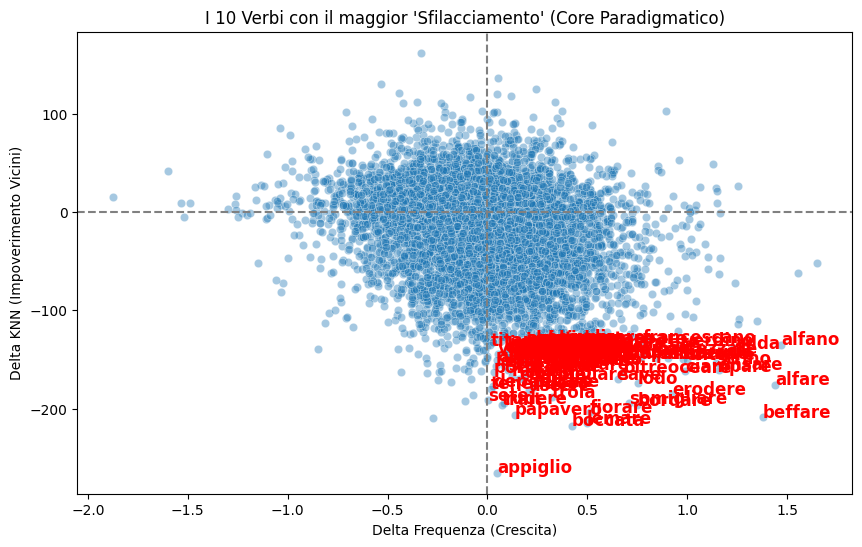

In [2]:
# =============================================================================
# 5. I TOP 10 VERBI PASSE-PARTOUT (ALTA CRESCITA + CROLLO KNN)
# =============================================================================

print("\n--- IDENTIFICAZIONE TOP 10 VERBI (EFFETTO PASSE-PARTOUT) ---")

# Filtriamo solo i verbi
verbs_df = df[df['pos'] == 'VERB'].copy()

# Per essere un "passe-partout" cerchiamo verbi che:
# 1. Sono cresciuti molto in frequenza (d_freq alto)
# 2. Hanno subito un forte calo del grado dei vicini (d_knn molto negativo)

# Ordiniamo per d_knn crescente (i più negativi in cima) 
# limitandoci a quelli che hanno avuto una crescita di frequenza positiva
top_passepartout_verbs = verbs_df[verbs_df['d_freq'] > 0].sort_values(by='d_knn', ascending=True).head(100)

print(top_passepartout_verbs[['token', 'd_freq', 'd_knn', 'd_k']])

# Visualizzazione opzionale dei nomi nel grafico
plt.figure(figsize=(10, 6))
sns.scatterplot(data=verbs_df, x='d_freq', y='d_knn', alpha=0.4)
for i in range(len(top_passepartout_verbs)):
    plt.text(top_passepartout_verbs.iloc[i]['d_freq'], 
             top_passepartout_verbs.iloc[i]['d_knn'], 
             top_passepartout_verbs.iloc[i]['token'],
             fontsize=12, fontweight='bold', color='red')

plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.title("I 10 Verbi con il maggior 'Sfilacciamento' (Core Paradigmatico)")
plt.xlabel("Delta Frequenza (Crescita)")
plt.ylabel("Delta KNN (Impoverimento Vicini)")
plt.show()

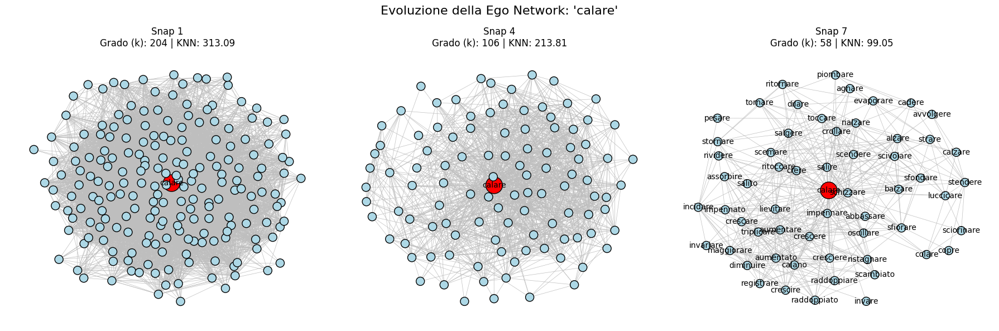

In [4]:
import igraph as ig
import matplotlib.pyplot as plt
from pathlib import Path

# Configurazione
input_dir = Path("networks_paradigmatic")
token_target = "calare"
snapshots = [1, 4, 7] # Scegliamo inizio, metà e fine per vedere il cambiamento

fig, axes = plt.subplots(1, len(snapshots), figsize=(18, 6))
fig.suptitle(f"Evoluzione della Ego Network: '{token_target}'", fontsize=16)

for ax, snap in zip(axes, snapshots):
    file_path = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    
    if not file_path.exists():
        ax.set_title(f"Snap {snap} non trovato")
        continue
    
    g = ig.Graph.Read_Pickle(str(file_path))
    
    try:
        # 1. Trova il nodo ego
        ego_idx = g.vs.find(token=token_target).index
        
        # 2. Estrai vicini e crea il sottografo indotto (ego network)
        neighbors = g.neighbors(ego_idx)
        all_nodes = neighbors + [ego_idx]
        ego_net = g.subgraph(all_nodes)
        
        # 3. Colori e dimensioni per evidenziare il centro
        # Il target sarà l'ultimo nella lista del sottografo di solito, 
        # ma lo cerchiamo per sicurezza
        colors = ["red" if v['token'] == token_target else "lightblue" for v in ego_net.vs]
        sizes = [30 if v['token'] == token_target else 15 for v in ego_net.vs]
        labels = [v['token'] if v['token'] == token_target or snap == 7 else "" for v in ego_net.vs]

        # 4. Calcolo metriche locali per il titolo del subplot
        k = ego_net.degree(ego_net.vs.find(token=token_target).index)
        # knn nel grafo originale per coerenza con l'analisi
        knn_val = g.knn()[0][ego_idx] 
        
        # 5. Plot
        ig.plot(
            ego_net,
            target=ax,
            layout="kk", # Kamada-Kawai per evidenziare i cluster
            vertex_color=colors,
            vertex_size=sizes,
            vertex_label=labels,
            vertex_label_size=10,
            edge_width=0.5,
            edge_color="gray"
        )
        ax.set_title(f"Snap {snap}\nGrado (k): {k} | KNN: {knn_val:.2f}")
        
    except ValueError:
        ax.set_title(f"'{token_target}' non presente in Snap {snap}")

plt.tight_layout()
plt.show()


--- AVVIO VALIDAZIONE STATISTICA (1000 Permutazioni) ---

Analisi POS: NOUN (n=8615, top10%_size=862)
  > Clustering: Diff Osservata = -0.0034 | Z-Score = -0.42 | p = 0.6444 
  > Grado (%): Diff Osservata = -0.2708 | Z-Score = -6.31 | p = 0.0010 ***
  > Assortatività (KNN): Diff Osservata = -35.7457 | Z-Score = -13.17 | p = 0.0010 ***

Analisi POS: VERB (n=7882, top10%_size=789)
  > Clustering: Diff Osservata = 0.0260 | Z-Score = 3.86 | p = 0.0010 ***
  > Grado (%): Diff Osservata = -0.2298 | Z-Score = -5.54 | p = 0.0010 ***
  > Assortatività (KNN): Diff Osservata = -22.8357 | Z-Score = -13.22 | p = 0.0010 ***

Analisi POS: ADJ (n=3821, top10%_size=383)
  > Clustering: Diff Osservata = 0.0366 | Z-Score = 2.74 | p = 0.0070 **
  > Grado (%): Diff Osservata = -0.3347 | Z-Score = -5.16 | p = 0.0010 ***
  > Assortatività (KNN): Diff Osservata = -13.9459 | Z-Score = -11.50 | p = 0.0010 ***

Analisi POS: ADV (n=987, top10%_size=99)
  > Clustering: Diff Osservata = -0.0218 | Z-Score = -0.78 |

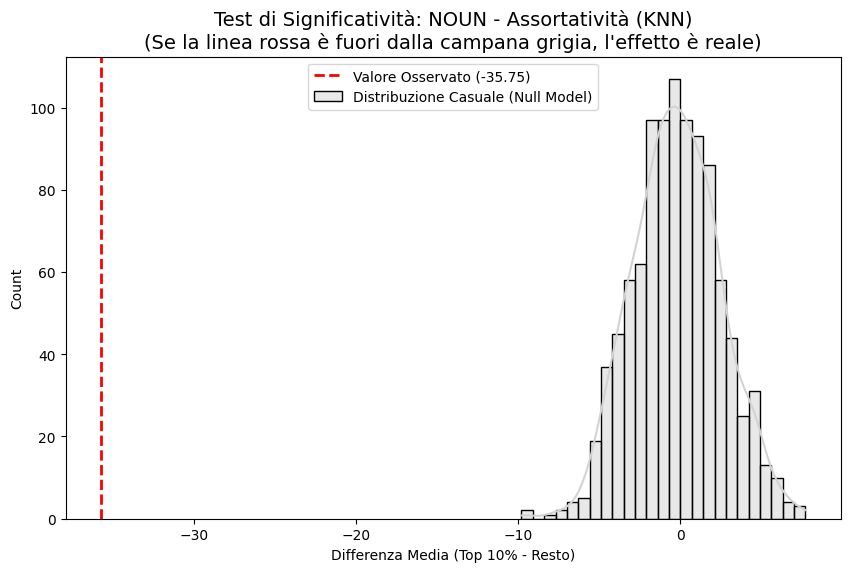

In [65]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# =============================================================================
# 5. VALIDAZIONE STATISTICA (PERMUTATION TEST / NULL MODEL)
# =============================================================================

# Configurazione del test
N_PERMUTATIONS = 1000  # Numero di simulazioni casuali (standard scientifico >= 1000)
metrics_to_test = {
    'd_cc': 'Clustering',
    'd_k': 'Grado (%)',
    'd_knn': 'Assortatività (KNN)'
}

results_stats = []

print(f"\n--- AVVIO VALIDAZIONE STATISTICA ({N_PERMUTATIONS} Permutazioni) ---")

# Iteriamo per ogni POS
for pos in target_pos:
    subset = df[df['pos'] == pos].copy()
    n_samples = len(subset)
    
    if n_samples < 20: 
        print(f"Skipping {pos}: troppo pochi dati ({n_samples})")
        continue

    # 1. Calcoliamo la soglia reale e identifichiamo la dimensione del gruppo Top 10%
    threshold_real = subset['d_freq'].quantile(0.90)
    # Creiamo una maschera booleana reale: True se è nel Top 10%, False altrimenti
    is_top_real = subset['d_freq'] >= threshold_real
    n_top = is_top_real.sum() # Quante parole sono nel Top 10%?
    
    print(f"\nAnalisi POS: {pos} (n={n_samples}, top10%_size={n_top})")

    # Iteriamo per ogni metrica strutturale (Clustering, Grado, KNN)
    for metric_col, metric_name in metrics_to_test.items():
        
        # --- A. VALORE OSSERVATO (REALE) ---
        # Calcoliamo la differenza media reale: Media(Top10) - Media(Resto)
        mean_top_obs = subset.loc[is_top_real, metric_col].mean()
        mean_rest_obs = subset.loc[~is_top_real, metric_col].mean()
        diff_obs = mean_top_obs - mean_rest_obs
        
        # --- B. NULL MODEL (PERMUTAZIONI) ---
        null_diffs = []
        values = subset[metric_col].values # Array numpy per velocità
        
        for _ in range(N_PERMUTATIONS):
            # SHUFFLE: Mescoliamo solo le etichette "Top 10%"
            # Tecnicamente: estraiamo n_top indici a caso da considerare come "Finto Top 10%"
            shuffled_indices = np.random.choice(n_samples, n_top, replace=False)
            
            # Creiamo maschera per il gruppo random
            mask_random = np.zeros(n_samples, dtype=bool)
            mask_random[shuffled_indices] = True
            
            # Calcoliamo la differenza media nel mondo casuale
            mean_top_null = values[mask_random].mean()
            mean_rest_null = values[~mask_random].mean()
            null_diffs.append(mean_top_null - mean_rest_null)
        
        null_diffs = np.array(null_diffs)
        
        # --- C. STATISTICHE (Z-SCORE & P-VALUE) ---
        mean_null = np.mean(null_diffs)
        std_null = np.std(null_diffs)
        
        # Z-Score: Quante deviazioni standard dista il dato reale dalla media casuale?
        # Z > 1.96 o Z < -1.96 indica significatività al 95%
        if std_null == 0:
            z_score = 0
        else:
            z_score = (diff_obs - mean_null) / std_null
        
        # P-Value (Two-tailed): Probabilità di ottenere un risultato così estremo per caso
        # Calcoliamo quanti valori nulli sono più estremi (in valore assoluto) del valore osservato
        n_extreme = np.sum(np.abs(null_diffs) >= np.abs(diff_obs))
        p_value = (n_extreme + 1) / (N_PERMUTATIONS + 1) # +1 per correzione continuità
        
        # Formattazione asterischi significatività
        sig = ""
        if p_value < 0.001: sig = "***"
        elif p_value < 0.01: sig = "**"
        elif p_value < 0.05: sig = "*"
        
        results_stats.append({
            'POS': pos,
            'Metric': metric_name,
            'Observed_Diff': diff_obs,
            'Null_Mean': mean_null,
            'Z_Score': z_score,
            'p_value': p_value,
            'Significance': sig
        })
        
        print(f"  > {metric_name}: Diff Osservata = {diff_obs:.4f} | Z-Score = {z_score:.2f} | p = {p_value:.4f} {sig}")

# =============================================================================
# 6. VISUALIZZAZIONE RISULTATI DEL NULL MODEL
# =============================================================================
df_stats = pd.DataFrame(results_stats)

# Creiamo una tabella pulita per la tesi
print("\n--- TABELLA FINALE Z-SCORES ---")
print(df_stats[['POS', 'Metric', 'Observed_Diff', 'Z_Score', 'p_value', 'Significance']])

# Esempio grafico: Distribuzione Nulla per una metrica specifica (es. NOUN - KNN)
# Scegliamo il caso più significativo da mostrare
target_metric = 'd_knn'
target_pos_plot = 'NOUN' # Cambia questo se vuoi vedere altre categorie

# Rieseguiamo una volta sola la permutazione per il plot specifico (per avere i dati da plottare)
# (In un codice di produzione salveremmo `null_diffs` nel loop sopra, qui lo rifaccio al volo per brevità)
subset_plot = df[df['pos'] == target_pos_plot]
if not subset_plot.empty:
    vals = subset_plot[target_metric].values
    n_top_plot = int(len(subset_plot) * 0.10) # Stima approssimata top 10%
    
    null_dist_plot = []
    for _ in range(1000):
        idx = np.random.choice(len(vals), n_top_plot, replace=False)
        mask = np.zeros(len(vals), dtype=bool); mask[idx] = True
        null_dist_plot.append(vals[mask].mean() - vals[~mask].mean())
    
    # Recuperiamo il valore osservato dalla tabella stats
    obs_val = df_stats[(df_stats['POS'] == target_pos_plot) & (df_stats['Metric'] == 'Assortatività (KNN)')]['Observed_Diff'].values[0]

    plt.figure(figsize=(10, 6))
    sns.histplot(null_dist_plot, kde=True, color="lightgray", label="Distribuzione Casuale (Null Model)")
    plt.axvline(obs_val, color='red', linestyle='--', linewidth=2, label=f"Valore Osservato ({obs_val:.2f})")
    
    plt.title(f"Test di Significatività: {target_pos_plot} - {metrics_to_test[target_metric]}\n(Se la linea rossa è fuori dalla campana grigia, l'effetto è reale)", fontsize=14)
    plt.xlabel("Differenza Media (Top 10% - Resto)")
    plt.legend()
    plt.savefig("null_model_validation.png")
    plt.show()

--- CARICAMENTO GRAFI E IDENTIFICAZIONE CORE ---
Nodi nel Core Persistente (tutti i 7 snap): 20113
--- CALCOLO DELLE SLOPE (REGRESSIONE LINEARE) ---


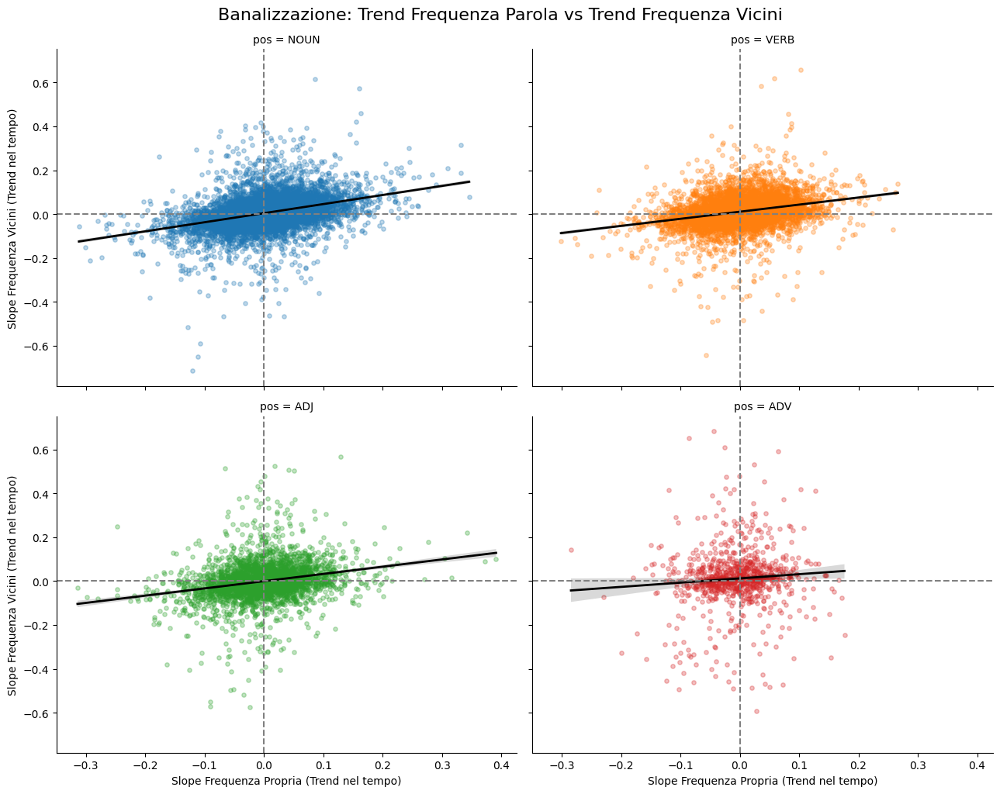


--- ANALISI CORRELAZIONE (PEARSON SULLE SLOPE) ---
Correlazione NEGATIVA: Chi ha un trend positivo, attira vicini con trend negativo (Banalizzazione)
    POS  Correlation        P-Value Significance
0  NOUN     0.357666  6.571901e-235          ***
1  VERB     0.275307  1.923749e-119          ***
2   ADJ     0.240006   6.493345e-47          ***
3   ADV     0.079696   1.561174e-02            *

--- EFFETTO SUI VICINI PER IL TOP 10% (Maggior Trend Positivo) ---
NOUN (Soglia Slope > 0.042):
  Trend Vicini per il Top 10%: +0.0386
  Trend Vicini per il Resto:   -0.0044

VERB (Soglia Slope > 0.035):
  Trend Vicini per il Top 10%: +0.0344
  Trend Vicini per il Resto:   +0.0037

ADJ (Soglia Slope > 0.037):
  Trend Vicini per il Top 10%: +0.0223
  Trend Vicini per il Resto:   -0.0082

ADV (Soglia Slope > 0.028):
  Trend Vicini per il Top 10%: +0.0100
  Trend Vicini per il Resto:   +0.0113



In [1]:
import igraph as ig
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from scipy.stats import pearsonr, linregress

# =============================================================================
# CONFIGURAZIONE
# =============================================================================
input_dir = Path("networks_paradigmatic")
target_pos = ['NOUN', 'VERB', 'ADJ', 'ADV']
snapshots = range(1, 8)  # Consideriamo tutti gli snapshot da 1 a 7

# =============================================================================
# FUNZIONE HELPER: Calcolo Frequenza Media Vicini
# =============================================================================
def get_avg_neighbor_freq(graph, node_index):
    """Calcola la frequenza media dei vicini di un nodo."""
    neighbors_indices = graph.neighbors(node_index)
    if not neighbors_indices:
        return 0.0
    
    # Assumiamo che l'attributo 'freq' esista e lo filtriamo dai None
    neigh_freqs = [graph.vs[ni]['freq'] for ni in neighbors_indices if graph.vs[ni]['freq'] is not None]
    
    return np.mean(neigh_freqs) if neigh_freqs else 0.0

# =============================================================================
# 1. CARICAMENTO DATI E INTERSEZIONE (CORE ASSOLUTO)
# =============================================================================
print("--- CARICAMENTO GRAFI E IDENTIFICAZIONE CORE ---")
graphs = {}
idx_maps = {}

# Carichiamo tutti i grafi in memoria (se non sono enormi, altrimenti ottimizziamo)
for snap in snapshots:
    path = input_dir / f"graph_snap{snap}_paradigmatic.igp"
    if not path.exists():
        raise FileNotFoundError(f"File {path} non trovato.")
    
    g = ig.Graph.Read_Pickle(str(path))
    graphs[snap] = g
    idx_maps[snap] = {v['token']: v.index for v in g.vs}

# Troviamo il Core persistente su TUTTI gli snapshot
core_nodes = set(graphs[1].vs['token'])
for snap in range(2, 8):
    core_nodes = core_nodes.intersection(set(graphs[snap].vs['token']))
core_nodes = list(core_nodes)

print(f"Nodi nel Core Persistente (tutti i 7 snap): {len(core_nodes)}")

# Estraiamo le POS dal primo grafo
pos_map = {v['token']: v['pos'] for v in graphs[1].vs if v['token'] in core_nodes}

# =============================================================================
# 2. ESTRAZIONE TRAIETTORIE E CALCOLO SLOPE
# =============================================================================
print("--- CALCOLO DELLE SLOPE (REGRESSIONE LINEARE) ---")
data = []

# Asse X per la regressione lineare (es. tempo 1, 2, 3, 4, 5, 6, 7)
x_time = np.array(list(snapshots))

for name in core_nodes:
    pos = pos_map.get(name, 'UNK')
    if pos not in target_pos: continue
    
    # Raccoglieremo le frequenze nei 7 periodi
    log_freqs_self = []
    log_freqs_neigh = []
    
    for snap in snapshots:
        g = graphs[snap]
        idx = idx_maps[snap][name]
        
        f_self = g.vs[idx]['freq']
        f_neigh = get_avg_neighbor_freq(g, idx)
        
        # Trasformazione logaritmica log10(x + 1)
        # Se f_self è None per errori di annotazione, consideriamo 0
        val_self = f_self if f_self is not None else 0
        
        log_freqs_self.append(np.log10(val_self + 1))
        log_freqs_neigh.append(np.log10(f_neigh + 1))
    
    # Calcolo Slope tramite scipy.stats.linregress
    # linregress restituisce: slope, intercept, rvalue, pvalue, stderr
    slope_self, _, _, _, _ = linregress(x_time, log_freqs_self)
    slope_neigh, _, _, _, _ = linregress(x_time, log_freqs_neigh)
    
    data.append({
        'token': name,
        'pos': pos,
        'slope_self': slope_self,   # Trend della parola (>0 cresce, <0 cala)
        'slope_neigh': slope_neigh  # Trend dei vicini (>0 ricchi, <0 poveri)
    })

df = pd.DataFrame(data)

# =============================================================================
# 3. VISUALIZZAZIONE
# =============================================================================
g = sns.lmplot(
    data=df, 
    x='slope_self', 
    y='slope_neigh', 
    col='pos', hue='pos',
    col_wrap=2, height=5, aspect=1.3,
    scatter_kws={'alpha': 0.3, 's': 15},
    line_kws={'color': 'black', 'linewidth': 2}
)

for ax in g.axes.flatten():
    ax.axhline(0, color='gray', linestyle='--', linewidth=1.5)
    ax.axvline(0, color='gray', linestyle='--', linewidth=1.5)

g.figure.suptitle("Banalizzazione: Trend Frequenza Parola vs Trend Frequenza Vicini", y=1.02, fontsize=16)
g.set_axis_labels("Slope Frequenza Propria (Trend nel tempo)", "Slope Frequenza Vicini (Trend nel tempo)")
plt.show()

# =============================================================================
# 4. CORRELAZIONI (PEARSON SULLE SLOPE)
# =============================================================================
print("\n--- ANALISI CORRELAZIONE (PEARSON SULLE SLOPE) ---")
print("Correlazione NEGATIVA: Chi ha un trend positivo, attira vicini con trend negativo (Banalizzazione)")

stats_res = []
for pos in target_pos:
    subset = df[df['pos'] == pos]
    if len(subset) < 20: continue
    
    corr, p_val = pearsonr(subset['slope_self'], subset['slope_neigh'])
    
    sig = ""
    if p_val < 0.001: sig = "***"
    elif p_val < 0.01: sig = "**"
    elif p_val < 0.05: sig = "*"
    
    stats_res.append({
        'POS': pos,
        'Correlation': corr,
        'P-Value': p_val,
        'Significance': sig
    })

print(pd.DataFrame(stats_res))

# =============================================================================
# 5. FOCUS TOP 10% (Booming Words secondo il Trend)
# =============================================================================
print("\n--- EFFETTO SUI VICINI PER IL TOP 10% (Maggior Trend Positivo) ---")
for pos in target_pos:
    subset = df[df['pos'] == pos]
    if len(subset) < 10: continue
    
    # Il Top 25% ora è definito da chi ha la 'slope' più ripida verso l'alto
    threshold = subset['slope_self'].quantile(0.75)
    top_10 = subset[subset['slope_self'] >= threshold]
    rest = subset[subset['slope_self'] < threshold]
    
    avg_neigh_slope_top = top_10['slope_neigh'].mean()
    avg_neigh_slope_rest = rest['slope_neigh'].mean()
    
    print(f"{pos} (Soglia Slope > {threshold:.3f}):")
    print(f"  Trend Vicini per il Top 10%: {avg_neigh_slope_top:+.4f}")
    print(f"  Trend Vicini per il Resto:   {avg_neigh_slope_rest:+.4f}\n")

--- DISTRIBUZIONE PERCENTUALE DEI NODI NEI QUADRANTI ---
Quadrant Lose-Lose (Domain Decline) Lose-Win (Substitution)  \
pos                                                           
ADJ                          30.54%                  19.97%   
ADV                          24.62%                  29.63%   
NOUN                         28.87%                  17.72%   
VERB                         26.19%                  23.93%   

Quadrant Win-Lose (Impoverishment) Win-Win (Co-expansion)  
pos                                                        
ADJ                         20.97%                 28.51%  
ADV                         16.45%                  29.3%  
NOUN                        17.67%                 35.74%  
VERB                        14.93%                 34.95%  

--- FOCUS SULLE PAROLE IN CRESCITA (Slope Self > 0) ---
Tra le parole che crescono, quante trascinano i vicini (Win-Win) e quante li affossano (Win-Lose)?
Quadrant Win-Win (Co-expansion) Win-Lose (Impove

<Figure size 1000x600 with 0 Axes>

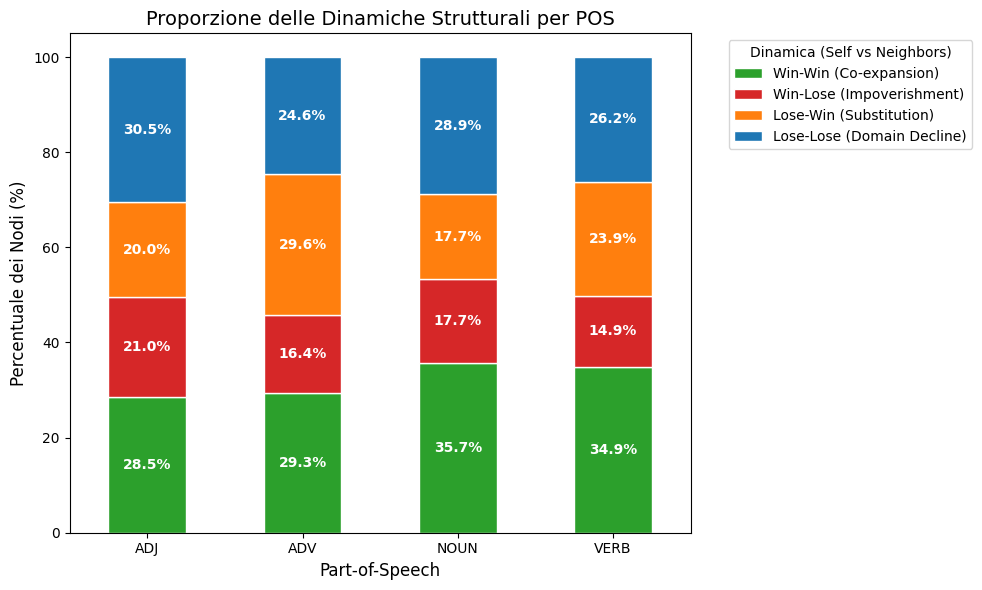

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# ASSUNZIONE: Assumo che tu abbia già il tuo DataFrame 'df' con le colonne:
# 'pos', 'slope_self' e 'slope_neighbors'.
# Sostituisci i nomi delle colonne se nel tuo codice si chiamano diversamente 
# (es. 'slope_freq' per self e 'slope_knn' per neighbors).

# =============================================================================
# 1. CLASSIFICAZIONE NEI 4 QUADRANTI
# =============================================================================

def classify_quadrant(row):
    s_self = row['slope_self']
    s_neigh = row['slope_neigh']
    
    if s_self > 0 and s_neigh > 0:
        return 'Win-Win (Co-expansion)'
    elif s_self > 0 and s_neigh < 0:
        return 'Win-Lose (Impoverishment)'
    elif s_self < 0 and s_neigh > 0:
        return 'Lose-Win (Substitution)'
    elif s_self < 0 and s_neigh < 0:
        return 'Lose-Lose (Domain Decline)'
    else:
        return 'Neutral / Zero'

# Applichiamo la classificazione
df['Quadrant'] = df.apply(classify_quadrant, axis=1)

# Rimuoviamo eventuali nodi esattamente a zero (molto rari con le regressioni)
df_valid = df[df['Quadrant'] != 'Neutral / Zero']

# =============================================================================
# 2. CALCOLO PERCENTUALI E TABELLA
# =============================================================================

# Calcoliamo i conteggi per POS e Quadrante
counts = df_valid.groupby(['pos', 'Quadrant']).size().unstack(fill_value=0)

# Convertiamo in percentuali (riga per riga)
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

print("--- DISTRIBUZIONE PERCENTUALE DEI NODI NEI QUADRANTI ---")
print(percentages.round(2).astype(str) + '%')

# Se vuoi isolare solo la dicotomia per i "Dominant Expanders" (chi ha Slope Self > 0):
df_growing = df_valid[df_valid['slope_self'] > 0]
grow_counts = df_growing.groupby(['pos', 'Quadrant']).size().unstack(fill_value=0)
grow_pct = grow_counts.div(grow_counts.sum(axis=1), axis=0) * 100

print("\n--- FOCUS SULLE PAROLE IN CRESCITA (Slope Self > 0) ---")
print("Tra le parole che crescono, quante trascinano i vicini (Win-Win) e quante li affossano (Win-Lose)?")
print(grow_pct[['Win-Win (Co-expansion)', 'Win-Lose (Impoverishment)']].round(2).astype(str) + '%')

# =============================================================================
# 3. VISUALIZZAZIONE
# =============================================================================

plt.figure(figsize=(10, 6))

# Colori per i 4 quadranti
colors = {
    'Win-Win (Co-expansion)': '#2ca02c',       # Verde
    'Win-Lose (Impoverishment)': '#d62728',    # Rosso
    'Lose-Win (Substitution)': '#ff7f0e',      # Arancione
    'Lose-Lose (Domain Decline)': '#1f77b4'    # Blu
}

# Ordiniamo le colonne per averle fisse nel plot
cols_order = ['Win-Win (Co-expansion)', 'Win-Lose (Impoverishment)', 
              'Lose-Win (Substitution)', 'Lose-Lose (Domain Decline)']
percentages = percentages.reindex(columns=cols_order)

# Plot stacked bar chart
ax = percentages.plot(kind='bar', stacked=True, color=[colors[c] for c in cols_order], 
                      figsize=(10, 6), edgecolor='white')

plt.title('Proporzione delle Dinamiche Strutturali per POS', fontsize=14)
plt.ylabel('Percentuale dei Nodi (%)', fontsize=12)
plt.xlabel('Part-of-Speech', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Dinamica (Self vs Neighbors)', bbox_to_anchor=(1.05, 1), loc='upper left')

# Aggiunta delle percentuali al centro di ogni blocco
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    if height > 5: # Mostra il testo solo se il blocco è più grande del 5% per leggibilità
        ax.text(x + width/2, 
                y + height/2, 
                f'{height:.1f}%', 
                horizontalalignment='center', 
                verticalalignment='center',
                color='white', fontweight='bold')

plt.tight_layout()
plt.show()